In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap
import os
import numpy as np
import scanpy as sc
import PyWGCNA
import seaborn as sns
from sklearn.metrics import roc_curve, roc_auc_score
from scipy.stats import mannwhitneyu
import re

In [2]:
def stack_triangle(df, col):
    df = pd.DataFrame(
        df.where(
            np.tri(
                df.shape[0],
                dtype=bool,
                k=-1
            ),
            np.nan
        ).stack(dropna=True), columns=[col] 
    )
    
    return df


In [3]:
# Function that generates and saves the ROC curve
def generate_roc_curve(
    data,
    target_col,
    feature_col,
):
    # ROC curve using all gene pairs
    fpr, tpr, thr = roc_curve(data[target_col], data[feature_col])
    auroc = roc_auc_score(data[target_col], data[feature_col])
    
    return fpr, tpr, thr, auroc

In [4]:
# Define colors
# Light version is obtained by setting alpha=0.5

ncolor  = '#00728eff'
ncolor2 = '#00728e80'

tcolor  = '#ab3502ff'
tcolor2 = '#ab350280'

graycolor = '#4D4E4FFF'
graycolor2 ='#4d4e4f80'

orangecolor = '#e69426'

In [5]:
paths = [
    './nerve/normal/nerve_tibial/wgcna_nerve_tibial.p',
    './blood/normal/whole_blood/wgcna_whole_blood.p',
    './rectum/tumor/rectum_adenocarcinoma/wgcna_rectum_adenocarcinoma.p',
    './salivary_gland/normal/minor_salivary_gland/wgcna_minor_salivary_gland.p',
    './uterus/normal/uterus/wgcna_uterus.p',
    './uterus/tumor/uterine_carcinosarcoma/wgcna_uterine_carcinosarcoma.p',
    './thyroid_gland/tumor/thyroid_carcinoma/wgcna_thyroid_carcinoma.p',
    './kidney/normal/kidney_cortex/wgcna_kidney_cortex.p',
    './kidney/tumor/kidney_papillary_cell_carcinoma/wgcna_kidney_papillary_cell_carcinoma.p',
    './kidney/tumor/kidney_chromophobe/wgcna_kidney_chromophobe.p',
    './kidney/tumor/kidney_clear_cell_carcinoma/wgcna_kidney_clear_cell_carcinoma.p',
    './heart/normal/heart_atrial_appendage/wgcna_heart_atrial_appendage.p',
    './heart/normal/heart_left_ventricle/wgcna_heart_left_ventricle.p',
    './brain/normal/brain_cortex/wgcna_brain_cortex.p',
    './brain/normal/brain_frontal_cortex_ba9/wgcna_brain_frontal_cortex_ba9.p',
    './brain/normal/brain_hippocampus/wgcna_brain_hippocampus.p',
    './brain/normal/brain_spinal_cord_cervical_c1/wgcna_brain_spinal_cord_cervical_c1.p',
    './brain/normal/brain_hypothalamus/wgcna_brain_hypothalamus.p',
    './brain/normal/brain_anterior_cingulate_cortex_ba24/wgcna_brain_anterior_cingulate_cortex_ba24.p',
    './brain/normal/brain_caudate_basal_ganglia/wgcna_brain_caudate_basal_ganglia.p',
    './brain/normal/brain_nucleus_accumbens_basal_ganglia/wgcna_brain_nucleus_accumbens_basal_ganglia.p',
    './brain/normal/brain_substantia_nigra/wgcna_brain_substantia_nigra.p',
    './brain/normal/brain_putamen_basal_ganglia/wgcna_brain_putamen_basal_ganglia.p',
    './brain/normal/brain_cerebellar_hemisphere/wgcna_brain_cerebellar_hemisphere.p',
    './brain/normal/brain_cerebellum/wgcna_brain_cerebellum.p',
    './brain/normal/brain_amygdala/wgcna_brain_amygdala.p',
    './brain/tumor/brain_lower_grade_glioma/wgcna_brain_lower_grade_glioma.p',
    './brain/tumor/glioblastoma_multiforme/wgcna_glioblastoma_multiforme.p',
    './adrenal_gland/normal/adrenal_gland/wgcna_adrenal_gland.p',
    './adrenal_gland/tumor/adrenocortical_cancer/wgcna_adrenocortical_cancer.p',
    './testis/normal/testis/wgcna_testis.p',
    './testis/tumor/testicular_germ_cell_tumor/wgcna_testicular_germ_cell_tumor.p',
    './liver/normal/liver/wgcna_liver.p',
    './liver/tumor/liver_hepatocellular_carcinoma/wgcna_liver_hepatocellular_carcinoma.p',
    './prostate/normal/prostate/wgcna_prostate.p',
    './prostate/tumor/prostate_adenocarcinoma/wgcna_prostate_adenocarcinoma.p',
    './thymus/tumor/thymoma/wgcna_thymoma.p',
    './vagina/normal/vagina/wgcna_vagina.p',
    './lung/normal/lung/wgcna_lung.p',
    './lung/tumor/lung_squamous_cell_carcinoma/wgcna_lung_squamous_cell_carcinoma.p',
    './lung/tumor/lung_adenocarcinoma/wgcna_lung_adenocarcinoma.p',
    './bladder/tumor/bladder_urothelial_carcinoma/wgcna_bladder_urothelial_carcinoma.p',
    './breast/normal/breast_mammary_tissue/wgcna_breast_mammary_tissue.p',
    './breast/tumor/breast_invasive_carcinoma/wgcna_breast_invasive_carcinoma.p',
    './adipose_tissue/normal/adipose_visceral_omentum/wgcna_adipose_visceral_omentum.p',
    './adipose_tissue/normal/adipose_subcutaneous/wgcna_adipose_subcutaneous.p',
    './blood_vessel/normal/artery_aorta/wgcna_artery_aorta.p',
    './blood_vessel/normal/artery_coronary/wgcna_artery_coronary.p',
    './blood_vessel/normal/artery_tibial/wgcna_artery_tibial.p',
    './cervix/tumor/cervical_and_endocervical_cancer/wgcna_cervical_and_endocervical_cancer.p',
    './ovary/normal/ovary/wgcna_ovary.p',
    './ovary/tumor/ovarian_serous_cystadenocarcinoma/wgcna_ovarian_serous_cystadenocarcinoma.p',
    './muscle/normal/muscle_skeletal/wgcna_muscle_skeletal.p',
    './endometrium/tumor/uterine_corpus_endometrioid_carcinoma/wgcna_uterine_corpus_endometrioid_carcinoma.p',
    './lining_of_body_cavities/tumor/mesothelioma/wgcna_mesothelioma.p',
    './skin/normal/skin_sun_exposed_lower_leg/wgcna_skin_sun_exposed_lower_leg.p',
    './skin/normal/skin_not_sun_exposed_suprapubic/wgcna_skin_not_sun_exposed_suprapubic.p',
    './skin/tumor/skin_cutaneous_melanoma/wgcna_skin_cutaneous_melanoma.p',
    './pancreas/normal/pancreas/wgcna_pancreas.p',
    './pancreas/tumor/pancreatic_adenocarcinoma/wgcna_pancreatic_adenocarcinoma.p',
    './thyroid/normal/thyroid/wgcna_thyroid.p',
    './eye/tumor/uveal_melanoma/wgcna_uveal_melanoma.p',
    './pituitary/normal/pituitary/wgcna_pituitary.p',
    './bile_duct/tumor/cholangiocarcinoma/wgcna_cholangiocarcinoma.p',
    './small_intestine/normal/small_intestine_terminal_ileum/wgcna_small_intestine_terminal_ileum.p',
    './soft_tissue_bone/tumor/sarcoma/wgcna_sarcoma.p',
    './colon/normal/colon_sigmoid/wgcna_colon_sigmoid.p',
    './colon/normal/colon_transverse/wgcna_colon_transverse.p',
    './colon/tumor/colon_adenocarcinoma/wgcna_colon_adenocarcinoma.p',
    './spleen/normal/spleen/wgcna_spleen.p',
    './head_and_neck_region/tumor/head_and_neck_squamous_cell_carcinoma/wgcna_head_and_neck_squamous_cell_carcinoma.p',
    './lymphatic_tissue/tumor/diffuse_large_bcell_lymphoma/wgcna_diffuse_large_bcell_lymphoma.p',
    './paraganglia/tumor/pheochromocytoma_and_paraganglioma/wgcna_pheochromocytoma_and_paraganglioma.p',
    './esophagus/normal/esophagus_gastroesophageal_junction/wgcna_esophagus_gastroesophageal_junction.p',
    './esophagus/normal/esophagus_muscularis/wgcna_esophagus_muscularis.p',
    './esophagus/normal/esophagus_mucosa/wgcna_esophagus_mucosa.p',
    './esophagus/tumor/esophageal_carcinoma/wgcna_esophageal_carcinoma.p',
    './stomach/normal/stomach/wgcna_stomach.p',
    './stomach/tumor/stomach_adenocarcinoma/wgcna_stomach_adenocarcinoma.p',
]

In [29]:
df = pd.DataFrame([s.split('/') for s in paths]).iloc[:, [1,2]]
df.columns= ['tissue', 'condition']

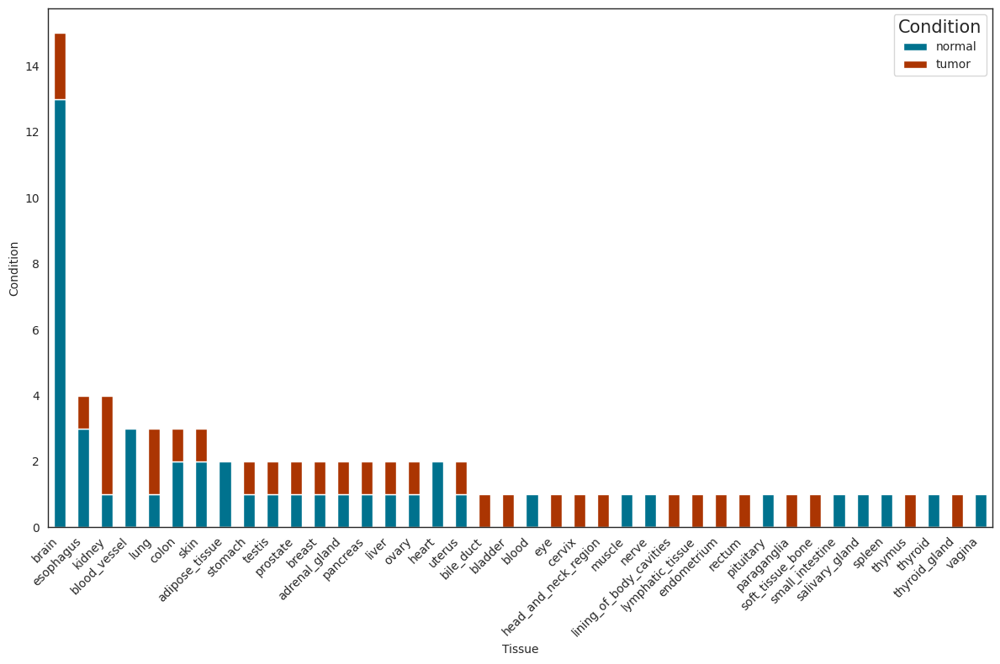

In [41]:
import matplotlib.pyplot as plt
import pandas as pd

# Group by tissue and condition, counting occurrences
df_count = df.groupby(['tissue', 'condition']).size().unstack(fill_value=0)

# Sort the tissues by the total occurrences (sum of "normal" and "tumor")
df_count['total'] = df_count.sum(axis=1)
df_count = df_count.sort_values('total', ascending=False).drop(columns='total')

# Plot stacked bar chart
fig, ax = plt.subplots(figsize=(12, 8))

# Plot "normal" and "tumor" bars stacked
df_count.plot(kind='bar', stacked=True, color=[ncolor, tcolor], ax=ax)

# Customize plot
#ax.set_title('Stacked Bar Plot of Conditions by Tissue')
ax.set_ylabel('Condition')
ax.set_xlabel('Tissue')
plt.xticks(rotation=45, ha='right')

# Add legend
ax.legend(title='Condition')

plt.tight_layout()
plt.show()


In [59]:
flow = pd.read_csv('/home/lnemati/pathway_crosstalk/results/flow/interactions_with_counts.csv', index_col='interaction')

In [60]:
normal = flow.normal_score.sum()
tumor = flow.tumor_score.sum()
both = flow.both_score.sum()

In [64]:
flow.idxmax(axis=1).value_counts()

normal_score    1602
tumor_score     1100
both_score       151
dtype: int64

In [66]:
int_normal, int_tumor, int_both = flow.idxmax(axis=1).value_counts().values

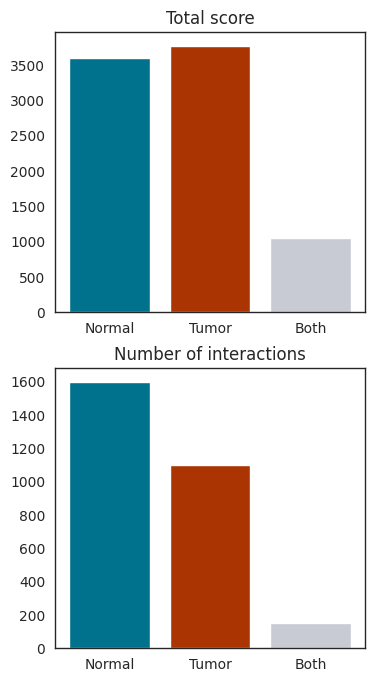

In [80]:


# Creating the bar plot
fig, (ax1, ax2) = plt.subplots(2,1, figsize=(4, 8))

categories = ['Normal', 'Tumor', 'Both']
scores = [normal, tumor, both]
colors = [ncolor, tcolor, '#C8CAD4']
ax1.bar(categories, scores, color=colors)
ax1.set_title('Total score')


categories = ['Normal', 'Tumor', 'Both']
interactions = [int_normal, int_tumor, int_both]
colors = [ncolor, tcolor, '#C8CAD4']
ax2.bar(categories, interactions, color=colors)
ax2.set_title('Number of interactions')

# Show plot
plt.show()

fig.savefig('/home/lnemati/pathway_crosstalk/results/figures/flow/flow_summary.pdf', bbox_inches='tight')


In [86]:
flow

,both_score,normal_score,tumor_score
interaction,,,
CSF1_CSF1R,0.000000,0.000000,9.666667
HLA-E_CD8A,0.653846,0.500000,9.512821
HLA-DQA1_CD4,4.000000,0.038462,8.500000
PLA2G7_PTAFR,0.307692,1.000000,9.358974
CCL3_CCR1,0.076923,0.000000,8.256410
...,...,...,...
THY1_ADGRE5,0.076923,5.500000,0.423077
TENM4_ADGRL1,0.666667,6.192308,1.000000
PTPRS_NTRK3,0.000000,6.794872,1.000000


In [83]:
interactions

[1602, 1100, 151]

In [47]:
#C8CAD4

1048.8076923076924

In [49]:
flow

,interaction,both_score,normal_score,tumor_score
0,CSF1_CSF1R,0.000000,0.000000,9.666667
1,HLA-E_CD8A,0.653846,0.500000,9.512821
2,HLA-DQA1_CD4,4.000000,0.038462,8.500000
3,PLA2G7_PTAFR,0.307692,1.000000,9.358974
4,CCL3_CCR1,0.076923,0.000000,8.256410
...,...,...,...,...
2848,THY1_ADGRE5,0.076923,5.500000,0.423077
2849,TENM4_ADGRL1,0.666667,6.192308,1.000000
2850,PTPRS_NTRK3,0.000000,6.794872,1.000000
2851,ACE2_AGTR1,0.000000,6.833333,0.000000


In [5]:
import igraph as ig
from scipy.sparse import csr_matrix

In [58]:
tc = pd.read_csv('/home/lnemati/pathway_crosstalk/results/pairs_of_interactions/tumor_coocs.csv', index_col=0)
to = pd.read_csv('/home/lnemati/pathway_crosstalk/results/pairs_of_interactions/tumor_occs.csv', index_col=0)
tj = pd.read_csv('/home/lnemati/pathway_crosstalk/results/pairs_of_interactions/tumor_jaccard.csv', index_col=0)

nc = pd.read_csv('/home/lnemati/pathway_crosstalk/results/pairs_of_interactions/normal_coocs.csv', index_col=0)
no = pd.read_csv('/home/lnemati/pathway_crosstalk/results/pairs_of_interactions/normal_occs.csv', index_col=0)
nj = pd.read_csv('/home/lnemati/pathway_crosstalk/results/pairs_of_interactions/normal_jaccard.csv', index_col=0)

np.fill_diagonal(tc.values, 0)
t_occs = pd.Series(np.diag(to), index=to.index)
n_occs = pd.Series(np.diag(no), index=no.index)
n = 3
t_keep = t_occs[(t_occs >= n)].index
n_keep = n_occs[(n_occs >= n)].index
keep = t_keep.intersection(n_keep)

tc = tc.loc[keep, keep]
to = to.loc[keep, keep]
tj = tj.loc[keep, keep]

nc = nc.loc[keep, keep]
no = no.loc[keep, keep]
nj = nj.loc[keep, keep]

In [59]:
diff = tj - nj

In [113]:
genes = ', '.join(diff.sum()[:10].index).replace('_', ', ').replace('+', ', ')
for gene in pd.Series(genes.split(' ')).unique():
    print(gene)

CDH1,
ITGA2,
ITGB1,
KLRG1,
CADM1,
NECTIN3,
CADM3,
CADM4,
EPB41L1,
CEACAM1,
CD209,
CEACAM6,
SELE


In [106]:
genes

'CDH1, ITGA2, ITGB1, CDH1, KLRG1, CADM1, NECTIN3, CADM3, CADM1, CADM3, CADM4, CADM3, EPB41L1, CADM3, NECTIN3, CEACAM1, CD209, CEACAM1, CEACAM6, CEACAM1, SELE'

In [133]:
diff.loc['CDH1_KLRG1'].idxmax()

'WNT3_FZD2+LRP6'

In [127]:
degrees = pd.DataFrame(diff.sum(), columns=['degree'])

In [ ]:
diff

In [142]:
degrees

,degree,most_coexpr_with
CDH1_ITGA2+ITGB1,109.698946,CDH1_ITGA2+ITGB1
CDH1_KLRG1,42.178582,CDH1_KLRG1
CADM1_NECTIN3,6.114197,CADM1_NECTIN3
CADM3_CADM1,-8.671377,CADM3_CADM1
CADM3_CADM4,-50.958302,CADM3_CADM4
...,...,...
LAMA5_ITGA1+ITGB1,32.921825,LAMA5_ITGA1+ITGB1
LAMB1_ITGA1+ITGB1,21.643571,LAMB1_ITGA1+ITGB1
LAMB2_ITGA1+ITGB1,37.845857,LAMB2_ITGA1+ITGB1
LAMC1_ITGA1+ITGB1,89.248895,LAMC1_ITGA1+ITGB1


CDH1_ITGA2+ITGB1      LAMB2_ITGA6+ITGB1
CDH1_KLRG1               WNT3_FZD2+LRP6
CADM1_NECTIN3              APLP2_PLXNA4
CADM3_CADM1               CADM3_EPB41L1
CADM3_CADM4             WNT2B_FZD1+LRP5
                            ...        
LAMA5_ITGA1+ITGB1          ENPP1_P2RY13
LAMB1_ITGA1+ITGB1    COL8A1_ITGA1+ITGB1
LAMB2_ITGA1+ITGB1           THY1_ADGRE2
LAMC1_ITGA1+ITGB1       FN1_ITGA4+ITGB1
LAMC3_ITGA1+ITGB1     LAMA2_ITGA9+ITGB1
Length: 1291, dtype: object

In [156]:
degrees.sort_values('degree', ascending=False)

,degree,most_coexpr_with
GDF9_ACVR1B+BMPR2,243.678632,WNT3_FZD6+LRP5
NRG4_ERBB2+ERBB4,238.584467,WNT11_FZD5+LRP6
C4A_C5AR2,237.704299,LAMA3_ITGAV+ITGB8
NRG4_ERBB4,223.759315,WNT11_FZD5+LRP6
ENPP1_P2RY13,216.028689,COL4A5_ITGA1+ITGB1
...,...,...
OMD_ITGAV+ITGB3,-184.144294,DHRS9_PGR
NGF_NTRK1,-190.248722,LRRTM4_NRXN1
COL3A1_ADGRG1,-194.495105,GZMA_F2RL1
DHCR7_NR1H2,-225.974074,PTGS2_HCAR2


In [157]:
degrees['most_coexpr_with'] = diff.loc[degrees.index].idxmax()
degrees['most_coexpr_with'][:20]

CDH1_ITGA2+ITGB1          LAMB2_ITGA6+ITGB1
CDH1_KLRG1                   WNT3_FZD2+LRP6
CADM1_NECTIN3                  APLP2_PLXNA4
CADM3_CADM1                   CADM3_EPB41L1
CADM3_CADM4                 WNT2B_FZD1+LRP5
CADM3_EPB41L1                 UBASH3B_PPARA
CADM3_NECTIN3                   PODXL2_SELE
CEACAM1_CD209                  GGT1_CYSLTR1
CEACAM1_CEACAM6            WNT9A_FZD10+LRP6
CEACAM1_SELE                  CADM3_NECTIN3
CEACAM5_CEACAM1                   GAD1_GRM8
CEACAM5_CEACAM6                   GAD1_GRM8
COL11A2_ITGA1+ITGB1            ACSL6_P2RY13
COL12A1_ITGA1+ITGB1          VEGFC_FLT4+KDR
COL12A1_ITGA10+ITGB1            TAFA5_S1PR2
COL12A1_ITGA11+ITGB1         VEGFC_FLT4+KDR
COL13A1_ITGA1+ITGB1      COL4A1_ITGA1+ITGB1
COL13A1_ITGA10+ITGB1       SPP1_ITGA9+ITGB1
COL13A1_ITGA11+ITGB1    COL5A2_ITGA11+ITGB1
COL14A1_ITGA1+ITGB1        TNXB_ITGA9+ITGB1
Name: most_coexpr_with, dtype: object

In [166]:
degrees = degrees.sort_values(by='degree', ascending=False)

In [169]:
degrees['most_coexpr_with'][:20]

GDF9_ACVR1B+BMPR2                 WNT3_FZD6+LRP5
NRG4_ERBB2+ERBB4                 WNT11_FZD5+LRP6
C4A_C5AR2                      LAMA3_ITGAV+ITGB8
NRG4_ERBB4                       WNT11_FZD5+LRP6
ENPP1_P2RY13                  COL4A5_ITGA1+ITGB1
TNC_ITGA9+ITGB1                       WNT5A_FRZB
ALDH1A3_CRABP2+RARA            LAMA5_ITGAV+ITGB8
C3_C5AR2                               ICAM1_SPN
COL4A4_ITGA9+ITGB1           COL4A4_ITGA10+ITGB1
TNFSF15_TNFRSF25             COL14A1_ITGA2+ITGB1
EPRS1_P2RY2                  ALDH1A2_CRABP2+RXRA
APLP2_PLXNA4                          IGF2_IGF1R
SEMA3G_NRP2+PLXNA4          COL14A1_ITGA10+ITGB1
ALDH1A2_CRABP2+RARG          ALDH1A1_CRABP2+RARG
ADA2_ADORA1                     SPP1_ITGAV+ITGB3
SEMA4A_PLXNB1                    WNT11_FZD1+LRP6
FLRT1+TENM4_ADGRL1               WNT2B_FZD1+LRP6
COL4A2_ITGA10+ITGB1           COL4A2_ITGA9+ITGB1
ALDH1A2_CRABP2+RARA+RXRA             ENPP1_P2RY2
ENTPD8_P2RY2                 ALDH1A1_CRABP2+RARG
Name: most_coexpr_wi

In [174]:
degrees['most_coexpr_with'][-20:][::-1]

COL6A6_CD44                     EFNA4_EPHA5
DHCR7_NR1H2                     PTGS2_HCAR2
COL3A1_ADGRG1                    GZMA_F2RL1
NGF_NTRK1                      LRRTM4_NRXN1
OMD_ITGAV+ITGB3                   DHRS9_PGR
CCL21_ACKR4                     CCL19_ACKR4
COL4A3_ADGRG6                   COL4A3_SDC4
BMPR1B+BMPR2_BMPR1A            ALDH1A3_RORB
TNFSF14_TNFRSF14                CCL19_CCRL2
NT5E+SLC29A1_ADORA2A           CXCL13_CXCR5
EFNA4_EPHA3                         MDK_ALK
CBR1_PTGFR                       DAGLA_CNR1
FGF10_FGFR1                    TENM2_ADGRL3
NFASC_CNTN1+CNTNAP1            LRRTM2_NRXN3
NT5E+SLC29A3_ADORA2A    NT5E+SLC29A3_ADORA3
BMP6_ACVR2A+BMPR1B            SLITRK6_PTPRS
WNT4_SFRP5                     C1QL1_ADGRB3
PTPRD_IL1RAP                     NRG4_ERBB4
ALCAM_CD6                       LGALS9_CD44
TENM1_ADGRL3                     NRG1_ERBB3
Name: most_coexpr_with, dtype: object

In [109]:
diff.sum().sort_values(ascending=False)[-50:]

GDF15_TGFBR2           -109.244654
ENTPD1_ADORA2B         -109.360544
PDGFA_PDGFRB           -109.856733
NLGN3_NRXN1            -110.108485
COL4A6_CD44            -110.117404
NTF3_NGFR              -110.359247
EFNA4_EPHA4            -110.763855
LAMC3_SV2B             -111.195127
FN1_ITGA3+ITGB1        -111.872516
WNT2B_SFRP5            -112.603083
AKR1C3_PTGFR           -113.499275
PTGES2_TBXA2R          -114.179236
TNXB_SDC1              -114.852721
COL4A3_ITGAV+ITGB8     -117.197631
RSPO3_LGR4             -117.794127
IL1RAP_PTPRF           -119.665417
EDA_EDAR               -120.580027
ADCYAP1_ADCYAP1R1      -123.382534
GAS6_AXL               -125.102916
RARRES2_CMKLR2         -128.604934
COL4A3_CD44            -129.013151
EFNA1_EPHA3            -129.261189
WNT5A_SFRP5            -131.492706
TENM1_ADGRL2           -133.019509
PRXL2B_PTGFR           -133.635737
TAX1BP3_ADGRB2         -134.856685
ANGPTL1_ITGA1+ITGB1    -136.420977
CNTN1_NOTCH1           -140.627197
PLA2G2A_ITGA5+ITGB1 

In [73]:
(diff.loc['NGF_NTRK1'] > 0).value_counts()

False    1208
True       83
Name: NGF_NTRK1, dtype: int64

In [70]:
diff.loc['NGF_NTRK1'].sort_values().tail(20)

EFNB3_EPHB1        0.083333
C4A_C5AR2          0.083333
VEGFB_NRP1         0.087302
COMP_SDC4          0.088889
EFNB3_EPHA4        0.090909
ENTPD1_TMIGD3      0.090909
WNT5A_SFRP5        0.100000
RNASET2_TLR8       0.100000
TF_TFR2            0.100000
TENM2_ADGRL3       0.109091
SEMA5A_PLXNA1      0.111111
NLGN1_NRXN1        0.119048
HPGD_PTGER2        0.126263
VEGFB_FLT1         0.142857
WNT11_FZD9         0.166667
WNT11_FZD9+LRP5    0.200000
WNT5A_FZD9+LRP5    0.200000
NTN4_UNC5D         0.200000
LRRTM4_NRXN1       0.200000
WNT5A_FZD9         0.200000
Name: NGF_NTRK1, dtype: float64

In [10]:
tj.shape

(835, 835)

In [11]:
nj.shape

(835, 835)

In [158]:
diff = stack_triangle(tj - nj, 'diff').sort_values(by='diff', ascending=False)
tj = stack_triangle(tj, 'j').sort_values(by='j', ascending=False)
nj = stack_triangle(nj, 'j').sort_values(by='j', ascending=False)

j
ENPP1_P2RY2        ALDH1A2_CRABP2+RARA+RXRA  1.0
                   ALDH1A2_CRABP2+RARA       1.0
COL6A2_ITGAV+ITGB8 GZMA_F2R                  1.0
LAMA2_ITGAV+ITGB8  GZMA_F2R                  1.0
LAMA4_ITGAV+ITGB8  GZMA_F2R                  1.0
...                                          ...
JAM2_ITGA3+ITGB1   MMP2_ITGAV+ITGB3          0.0
MMP2_ITGAV+ITGB3   THBS1_ITGA3+ITGB1         0.0
LAMA4_ITGA3+ITGB1  MMP2_ITGAV+ITGB3          0.0
OMD_ITGAV+ITGB3    FN1_ITGA3+ITGB1           0.0
LAMA4_ITGA3+ITGB1  OMD_ITGAV+ITGB3           0.0

[832695 rows x 1 columns]

In [161]:
diff['tumor_jaccard'] = tj.loc[diff.index]
diff['normal_jaccard'] = nj.loc[diff.index]

In [163]:
diff[:30]

diff  tumor_jaccard  \
ENPP1_P2RY2         ALDH1A2_CRABP2+RARA+RXRA  1.000000            1.0   
                    ALDH1A2_CRABP2+RARA       1.000000            1.0   
COL6A2_ITGAV+ITGB8  GZMA_F2R                  1.000000            1.0   
LAMA2_ITGAV+ITGB8   GZMA_F2R                  1.000000            1.0   
LAMA4_ITGAV+ITGB8   GZMA_F2R                  1.000000            1.0   
NRXN1_DAG1          GLS+SLC1A1_GRIK3          1.000000            1.0   
WNT3_FRZB           NT5E+SLC29A2_ADORA2B      1.000000            1.0   
HBEGF_ERBB2+ERBB4   WNT3_FZD2+LRP6            1.000000            1.0   
LAMA1_ITGA6+ITGB1   WNT3_FZD4+LRP6            1.000000            1.0   
HBEGF_ERBB2+ERBB4   WNT3_FZD4+LRP6            1.000000            1.0   
WNT4_FZD1+LRP6      FLRT1+TENM4_ADGRL1        1.000000            1.0   
COL1A1_ITGAV+ITGB8  GZMA_F2R                  1.000000            1.0   
MDK_ITGA6+ITGB1     WNT3_FZD4+LRP6            1.000000            1.0   
WNT2B_FZD1+LRP6     FLRT1+TENM4_ADGRL1        1.000000            1.0   
WNT10A_FZD6+LRP6    WNT3_FZD7+LRP6            1.000000            1.0   
NLGN3_NRXN1         LRRTM4_NRXN1              0.958333            1.0   
WNT5B_FZD1+LRP5     FLRT3+TENM4_ADGRL1        0.947368            1.0   
WNT3_FZD7+LRP5      FLRT3+TENM4_ADGRL1        0.941176            1.0   
COL9A2_ITGAV+ITGB8  ENPP1_P2RY2               0.937500            1.0   
WNT4_FZD3+LRP6      FLRT1+TENM4_ADGRL1        0.937500            1.0   
WNT2B_FZD3+LRP6     FLRT1+TENM4_ADGRL1        0.937500            1.0   
HBEGF_ERBB2+ERBB4   WNT9A_FZD2+LRP6           0.916667            1.0   
WNT7B_FZD6+LRP5     WNT11_FZD3+LRP5           0.916667            1.0   
WNT3_FZD4+LRP6      BMP6_ACVR2B+BMPR1A        0.909091            1.0   
HBEGF_ERBB2+ERBB4   WNT5A_FZD2+LRP6           0.909091            1.0   
WNT9A_FZD2+LRP5     WNT7B_FZD2+LRP5           0.909091            1.0   
                    WNT7B_FZD4+LRP5           0.909091            1.0   
INHBB_ACVR1B+ACVR2B WNT3_FZD2+LRP6            0.909091            1.0   
COL9A2_ITGAV+ITGB8  ALDH1A2_CRABP2+RARA       0.909091            1.0   
WNT9A_FZD1+LRP6     WNT4_FZD4+LRP6            0.909091            1.0   

                                              normal_jaccard  
ENPP1_P2RY2         ALDH1A2_CRABP2+RARA+RXRA        0.000000  
                    ALDH1A2_CRABP2+RARA             0.000000  
COL6A2_ITGAV+ITGB8  GZMA_F2R                        0.000000  
LAMA2_ITGAV+ITGB8   GZMA_F2R                        0.000000  
LAMA4_ITGAV+ITGB8   GZMA_F2R                        0.000000  
NRXN1_DAG1          GLS+SLC1A1_GRIK3                0.000000  
WNT3_FRZB           NT5E+SLC29A2_ADORA2B            0.000000  
HBEGF_ERBB2+ERBB4   WNT3_FZD2+LRP6                  0.000000  
LAMA1_ITGA6+ITGB1   WNT3_FZD4+LRP6                  0.000000  
HBEGF_ERBB2+ERBB4   WNT3_FZD4+LRP6                  0.000000  
WNT4_FZD1+LRP6      FLRT1+TENM4_ADGRL1              0.000000  
COL1A1_ITGAV+ITGB8  GZMA_F2R                        0.000000  
MDK_ITGA6+ITGB1     WNT3_FZD4+LRP6                  0.000000  
WNT2B_FZD1+LRP6     FLRT1+TENM4_ADGRL1              0.000000  
WNT10A_FZD6+LRP6    WNT3_FZD7+LRP6                  0.000000  
NLGN3_NRXN1         LRRTM4_NRXN1                    0.041667  
WNT5B_FZD1+LRP5     FLRT3+TENM4_ADGRL1              0.052632  
WNT3_FZD7+LRP5      FLRT3+TENM4_ADGRL1              0.058824  
COL9A2_ITGAV+ITGB8  ENPP1_P2RY2                     0.062500  
WNT4_FZD3+LRP6      FLRT1+TENM4_ADGRL1              0.062500  
WNT2B_FZD3+LRP6     FLRT1+TENM4_ADGRL1              0.062500  
HBEGF_ERBB2+ERBB4   WNT9A_FZD2+LRP6                 0.083333  
WNT7B_FZD6+LRP5     WNT11_FZD3+LRP5                 0.083333  
WNT3_FZD4+LRP6      BMP6_ACVR2B+BMPR1A              0.090909  
HBEGF_ERBB2+ERBB4   WNT5A_FZD2+LRP6                 0.090909  
WNT9A_FZD2+LRP5     WNT7B_FZD2+LRP5                 0.090909  
                    WNT7B_FZD4+LRP5                 0.090909  
INHBB_ACVR1B+ACVR2B WN

In [25]:
t_counts = diff[diff['diff'] > 0].index.get_level_values(0).value_counts()
t_counts = t_counts.add(diff[diff['diff'] > 0].index.get_level_values(1).value_counts())

In [28]:
t_counts.sort_values(ascending=False)[:20]

C4A_C5AR2             821.0
C3_C5AR2              820.0
ENTPD6_P2RY6          768.0
ADA2_ADORA1           766.0
APLP2_PLXNA4          766.0
ANXA1_FPR1            744.0
COL4A2_ITGA9+ITGB1    729.0
ENPP1_P2RY13          729.0
SEMA6B_PLXNA4         722.0
COL4A1_ITGAV+ITGB8    718.0
LRRC4_NTNG2           716.0
COMP_CD36             715.0
COL4A1_ITGA9+ITGB1    710.0
COL4A5_ITGAV+ITGB8    709.0
WNT2B_SFRP4           708.0
FGF1_FGFR2            706.0
TGFB3_ITGAV+ITGB8     705.0
GRN_SORT1             704.0
CD99_CD99L2           700.0
EPRS1_P2RY2           698.0
dtype: float64

In [15]:
diff.head(40)

,,diff
WNT5B_FZD1+LRP5,FLRT3+TENM4_ADGRL1,0.947368
WNT3_FZD7+LRP5,FLRT3+TENM4_ADGRL1,0.941176
WNT5B_FZD3+LRP5,FLRT3+TENM4_ADGRL1,0.904762
LAMA5_ITGAV+ITGB8,CTF1_IL6ST+LIFR,0.866667
CCL3_ACKR2,CCL2_ACKR2,0.846154
WNT5A_FZD3+LRP5,FLRT3+TENM4_ADGRL1,0.783333
WNT5A_FZD5+LRP5,FLRT3+TENM4_ADGRL1,0.783333
WNT5B_FZD7+LRP5,FLRT3+TENM4_ADGRL1,0.780702
WNT5A_FZD7+LRP5,FLRT3+TENM4_ADGRL1,0.777778
WNT3_FZD3+LRP5,FLRT3+TENM4_ADGRL1,0.777778


In [222]:
n = round(0.05 * len(tj))
wnt1 = tj.iloc[:n].index.get_level_values(0).str.contains('WNT')
wnt2 = tj.iloc[:n].index.get_level_values(1).str.contains('WNT')

sum(wnt1 & wnt2) / len(wnt1 | wnt2)

0.0691556576680069

In [224]:
wnt1 = tj.iloc[:].index.get_level_values(0).str.contains('WNT')
wnt2 = tj.iloc[:].index.get_level_values(1).str.contains('WNT')

sum(wnt1 & wnt2) / len(wnt1 | wnt2)

0.013931848533149528

In [230]:
n = round(0.05 * len(nj))
wnt1 = nj.iloc[:n].index.get_level_values(0).str.contains('WNT')
wnt2 = nj.iloc[:n].index.get_level_values(1).str.contains('WNT')

sum(wnt1 & wnt2) / len(wnt1 | wnt2)

0.10562894887995405

In [231]:
wnt1 = nj.iloc[:].index.get_level_values(0).str.contains('WNT')
wnt2 = nj.iloc[:].index.get_level_values(1).str.contains('WNT')

sum(wnt1 & wnt2) / len(wnt1 | wnt2)

0.013931848533149528

In [201]:
#diff.loc[('CSF1_CSF1R', 'CD274_PDCD1')]
tj.loc[('CD274_PDCD1', 'CSF1_CSF1R')]

j    0.333333
Name: (CD274_PDCD1, CSF1_CSF1R), dtype: float64

In [203]:
nj.loc[('CD274_PDCD1', 'CSF1_CSF1R')]

j    0.0
Name: (CD274_PDCD1, CSF1_CSF1R), dtype: float64

In [204]:
no.loc[('CD274_PDCD1', 'CSF1_CSF1R')]

11

In [129]:
#int_pair = ('CSF1_CSF1R', 'CD274_PDCD1')
int_pair = ('WNT5B_FZD1+LRP5', 'FLRT3+TENM4_ADGRL1')

In [97]:
tc.loc[int_pair[0], int_pair[1]]

5

In [98]:
to.loc[int_pair[0], int_pair[1]]

5

In [99]:
nc.loc[int_pair[0], int_pair[1]]

1

In [100]:
no.loc[int_pair[0], int_pair[1]]

19

In [130]:
tj.sum().sort_values(ascending=False)[:20]

WNT4_FZD3+LRP6          503.417173
WNT4_FZD6+LRP6          503.417173
WNT2B_FZD3+LRP6         503.417173
WNT2B_FZD1+LRP6         503.417173
WNT3_FZD6+LRP6          503.417173
WNT4_FZD1+LRP6          503.417173
WNT3_FZD1+LRP6          503.417173
WNT2B_FZD6+LRP6         503.417173
FLRT1+TENM4_ADGRL1      503.417173
BMP8B_ACVR1+BMPR2       500.137711
BMP8B_BMPR1A+BMPR2      493.142294
WNT3_FZD6+LRP5          493.142294
BMP8B_ACVR2B+BMPR1A     493.142294
WNT11_FZD2+LRP6         491.848355
COL26A1_ITGA10+ITGB1    491.848355
WNT11_FZD6+LRP6         491.848355
WNT11_FZD4+LRP6         491.848355
BMP6_ACVR2B+BMPR1A      491.848355
WNT9A_FZD4+LRP6         491.848355
COL9A3_ITGA10+ITGB1     491.848355
dtype: float64

NameError: name 'sch' is not defined

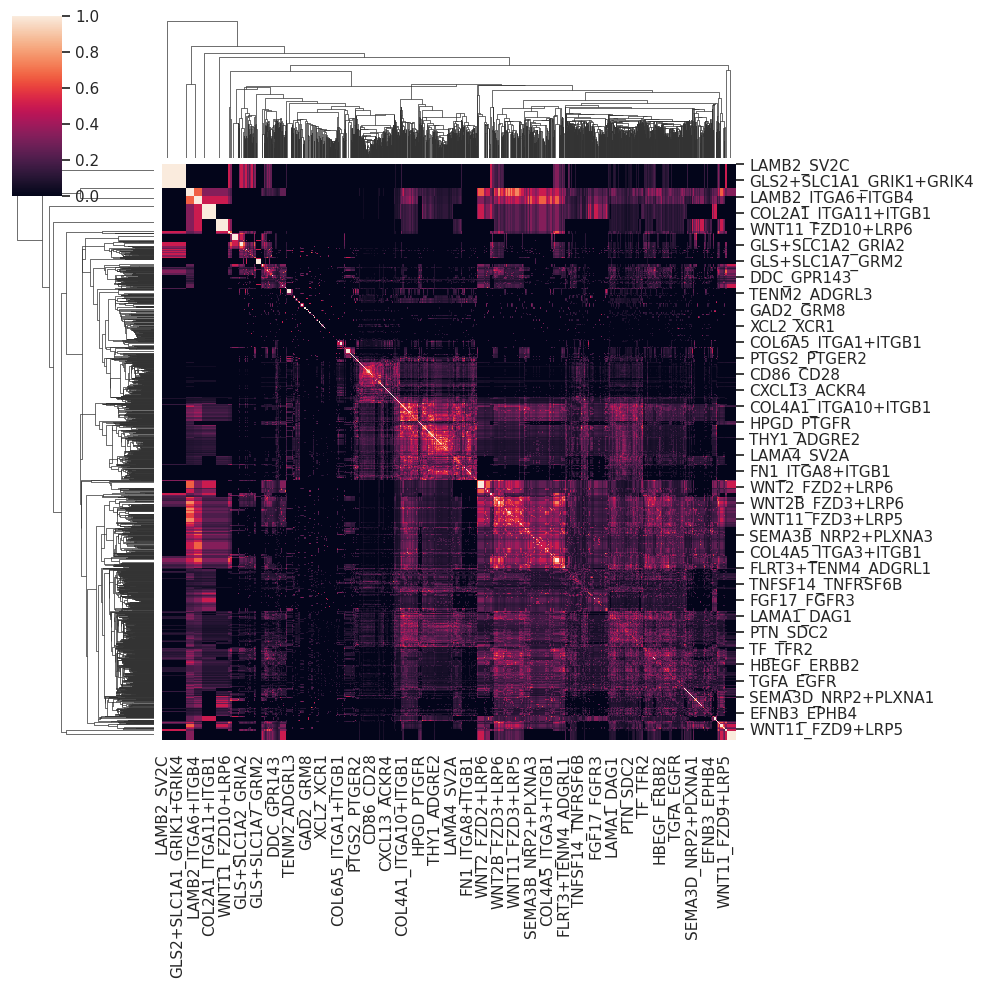

In [125]:
# Step 2: Use sns.clustermap to perform hierarchical clustering
clustergrid = sns.clustermap(tj, method='centroid', metric='euclidean')

# Step 3: Access row and column linkage matrices
row_linkage = clustergrid.dendrogram_row.linkage  # Row linkage matrix
col_linkage = clustergrid.dendrogram_col.linkage  # Column linkage matrix

# Step 4: Extract clusters from the row and column linkage matrices
# For row clusters
row_clusters = sch.fcluster(row_linkage, t=3, criterion='distance')
# For column clusters
col_clusters = sch.fcluster(col_linkage, t=3, criterion='distance')

# Output the clusters
print("Row cluster labels:", row_clusters)
print("Column cluster labels:", col_clusters)

# Show the clustered heatmap
plt.show()

In [146]:
pd.Series(row_clusters).value_counts()[:20]

7     1591
4      402
11     236
2      144
6      137
5      136
12     114
9       51
1       42
13      28
14      20
10      18
8       14
3        2
dtype: int64

In [150]:
j.index[row_clusters == 1]

Index(['DAGLA_CNR1', 'DAGLB_CNR1', 'EFNA3_EPHA7', 'EFNA5_EPHA7',
       'FLRT1+TENM2_ADGRL1', 'FLRT3+TENM2_ADGRL1', 'FLRT3+TENM2_ADGRL2',
       'GAD1+SLC6A6_GABRA3+GABRB3+GABRG2', 'GAD1+SLC6A6_GABRA5+GABRB3+GABRG2',
       'GAD2+SLC6A6_GABRA3+GABRB3+GABRG2', 'GAD2+SLC6A6_GABRA5+GABRB3+GABRG2',
       'GLS+SLC1A1_GRIA1', 'GLS+SLC1A1_GRIA2', 'GLS+SLC1A1_GRIK2',
       'GLS+SLC1A1_GRIK3', 'GLS+SLC1A1_GRM1', 'GLS+SLC1A1_GRM2',
       'GLS+SLC1A6_GRIA2', 'GLS+SLC1A6_GRIA3', 'GLS+SLC1A6_GRIK2',
       'GLS+SLC1A6_GRIK3', 'GLS+SLC1A6_GRM1', 'GLS+SLC1A6_GRM2',
       'GLS2+SLC1A1_GRIA2', 'GLS2+SLC1A1_GRIA3', 'GLS2+SLC1A1_GRIK2',
       'GLS2+SLC1A1_GRIK3', 'GLS2+SLC1A1_GRM1', 'GLS2+SLC1A1_GRM2',
       'GLS2+SLC1A6_GRIA2', 'GLS2+SLC1A6_GRIA3', 'GLS2+SLC1A6_GRIK2',
       'GLS2+SLC1A6_GRIK3', 'GLS2+SLC1A6_GRM1', 'GLS2+SLC1A6_GRM2',
       'SLIT2_ROBO2', 'TENM2_ADGRL1', 'NAAA_CNR1', 'GAD2_GRM1', 'GAD1_GRM1',
       'GAD2_GRM2', 'GAD1_GRM2'],
      dtype='object')

In [101]:
query = 'EGFR'

clusters.loc[j.index[j.index.str.contains(query)]]

AREG_EGFR           4
BTC_EGFR            4
EGF_EGFR            4
HBEGF_EGFR          3
TGFA_EGFR           4
EGF_EGFR+ERBB2      4
TGFA_EGFR+ERBB2     4
AREG_EGFR+ERBB2     4
BTC_EGFR+ERBB2      4
HBEGF_EGFR+ERBB2    1
dtype: int32

In [88]:
clusters[clusters == 1]

CDH1_ITGA2+ITGB1        1
COL11A2_ITGA10+ITGB1    1
COL12A1_ITGA2+ITGB1     1
COL13A1_ITGA2+ITGB1     1
COL14A1_ITGA2+ITGB1     1
                       ..
LAMA1_DAG1              1
LAMB1_DAG1              1
JAM2_ITGA3+ITGB1        1
JAM2_F11R               1
JAM3_F11R               1
Length: 336, dtype: int32

In [89]:
clusters[clusters == 2]

ICAM1_ITGAL          2
ICAM1_ITGAL+ITGB2    2
ICAM1_ITGAM+ITGB2    2
ICAM1_ITGAX+ITGB2    2
ICAM1_SPN            2
                    ..
HLA-DRA_CD4          2
HLA-DRB1_CD4         2
HLA-DRB5_CD4         2
NCAM1_NCAM2          2
NCAM2_L1CAM          2
Length: 139, dtype: int32

In [90]:
clusters[clusters == 3]

COL10A1_ITGA1+ITGB1     3
COL10A1_ITGA10+ITGB1    3
COL10A1_ITGA11+ITGB1    3
COL11A1_ITGA1+ITGB1     3
COL11A1_ITGA10+ITGB1    3
                       ..
LAMB1_ITGA1+ITGB1       3
LAMB2_ITGA1+ITGB1       3
LAMC1_ITGA1+ITGB1       3
LAMC2_ITGA1+ITGB1       3
LAMC3_ITGA1+ITGB1       3
Length: 482, dtype: int32

In [91]:
clusters[clusters == 4]

CDH1_KLRG1             4
CADM1_NECTIN3          4
CADM3_CADM1            4
CADM3_CADM4            4
CADM3_EPB41L1          4
                      ..
SEMA5B_PLXNA1          4
SEMA5A_PLXNA3          4
SEMA5B_PLXNA3          4
SEMA6B_PLXNA2          4
ANGPTL1_ITGA1+ITGB1    4
Length: 610, dtype: int32

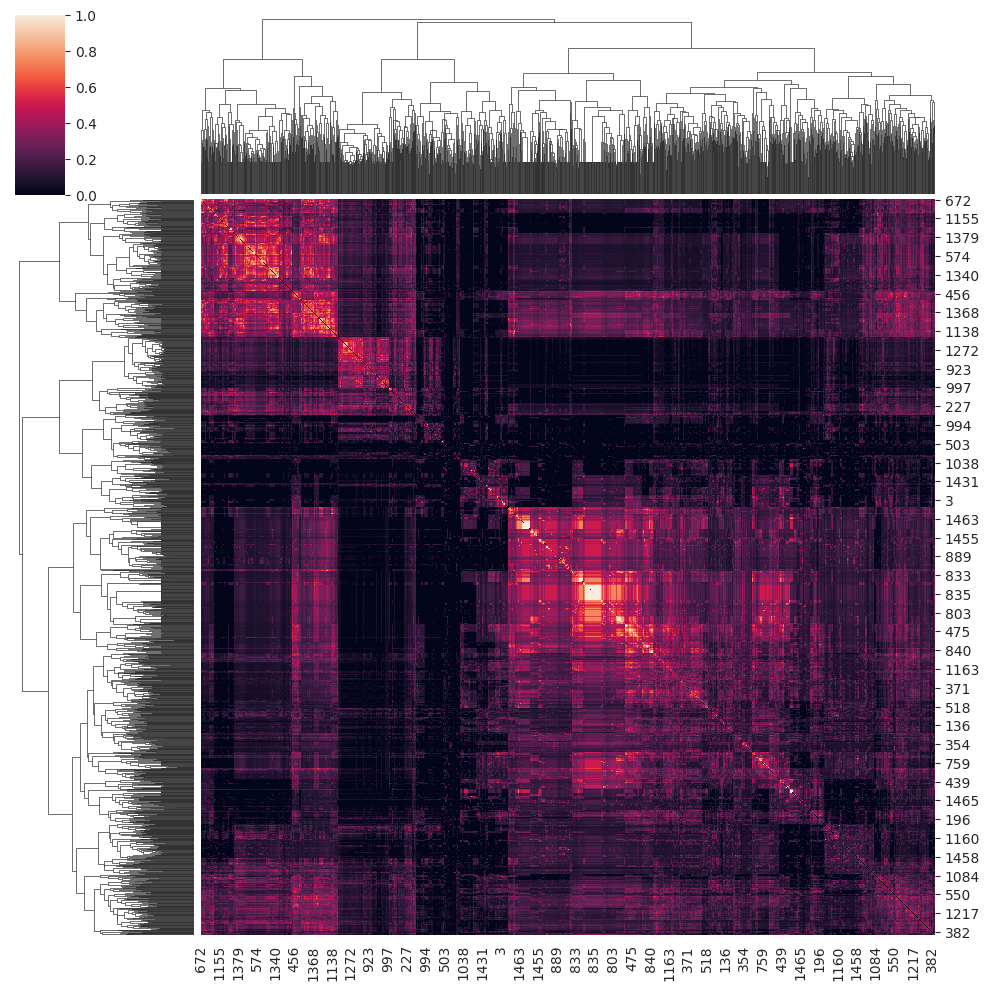

In [63]:
sns.clustermap(j.values)

In [ ]:
from sknetwork.clustering import Leiden

leiden = Leiden(resolution=1)
labels = leiden.fit_predict(tom)

len(set(labels))

In [ ]:
labels

In [52]:
#all_interactions = pd.read_csv('/projects/bioinformatics/DB/CellCellCommunication/WithEnzymes/cpdb_cellchat_enz.csv', index_col='interaction')
all_interactions = pd.read_csv('/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/pancreas/normal/pancreas/interactions.csv', index_col='interaction')['module']

valid = (~modules.isna()).astype(int).values

In [57]:
result = pd.DataFrame(np.add.outer(valid, valid), index=all_interactions.index, columns=all_interactions.index)

In [70]:
idx1 = result.loc['CADM3_CADM4'][result.loc['CADM3_CADM4'] == 2].index

In [87]:
tdf

,CDH1_ITGA2+ITGB1,CDH1_ITGAE+ITGB7,CDH1_KLRG1,CDH2_CDH2,CDH2_FCER2,CDH3_CDH3,CDH5_CDH5,CDH6_CDH6,CDH7_CDH7,CADM1_CADM1,...,LAMA2_ITGA1+ITGB1,LAMA3_ITGA1+ITGB1,LAMA4_ITGA1+ITGB1,LAMA5_ITGA1+ITGB1,LAMB1_ITGA1+ITGB1,LAMB2_ITGA1+ITGB1,LAMB3_ITGA1+ITGB1,LAMC1_ITGA1+ITGB1,LAMC2_ITGA1+ITGB1,LAMC3_ITGA1+ITGB1
CDH1_ITGA2+ITGB1,4,0,1,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,0
CDH1_ITGAE+ITGB7,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CDH1_KLRG1,1,0,3,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,0
CDH2_CDH2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CDH2_FCER2,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LAMB2_ITGA1+ITGB1,1,0,1,0,0,0,0,0,0,0,...,7,3,7,4,6,8,2,7,3,4
LAMB3_ITGA1+ITGB1,1,0,1,0,0,0,0,0,0,0,...,2,2,2,2,2,2,2,2,2,1
LAMC1_ITGA1+ITGB1,1,0,1,0,0,0,0,0,0,0,...,6,3,8,4,7,7,2,9,3,4
LAMC2_ITGA1+ITGB1,1,0,1,0,0,0,0,0,0,0,...,3,3,3,3,3,3,2,3,3,2


In [84]:
valid[::20]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 1, 0])

In [83]:
result.values.diagonal()[::20]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 2, 0, 0, 0, 2, 0])

In [86]:
result.values.diagonal()[::20]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 1, 0])

In [85]:
np.fill_diagonal(result.values, valid)

In [59]:
all_interactions

interaction
CDH1_ITGA2+ITGB1      NaN
CDH1_ITGAE+ITGB7      NaN
CADM1_NECTIN3         NaN
CADM3_CADM1           NaN
CADM3_CADM4          16.0
                     ... 
LAMB2_ITGA1+ITGB1     NaN
LAMB3_ITGA1+ITGB1     NaN
LAMC1_ITGA1+ITGB1     NaN
LAMC2_ITGA1+ITGB1     NaN
LAMC3_ITGA1+ITGB1     NaN
Name: module, Length: 1446, dtype: float64

In [63]:
all_interactions[all_interactions == 16]

interaction
CADM3_CADM4            16.0
BMP8A_ACVR2A+BMPR1B    16.0
CLSTN2_NRXN3           16.0
EFNA3_EPHA8            16.0
EFNA4_EPHA8            16.0
                       ... 
WNT11_FZD8             16.0
WNT11_FZD9             16.0
POMC_OPRL1             16.0
LAMA1_SV2B             16.0
LAMA3_SV2B             16.0
Name: module, Length: 69, dtype: float64

In [51]:
np.sum(np.add.outer(valid, valid) == 1)

384208

In [10]:
fisher = pd.read_csv('/home/lnemati/pathway_crosstalk/results/interactions_network/interactions_network_filtered.csv', index_col='interaction')

In [35]:
f_int  = fisher.index
f_int1 = fisher.query('log2_odds_ratio > 0').index
f_int2 = fisher.query('log2_odds_ratio < 0').index

In [164]:
mwumin = pd.read_csv('/home/lnemati/pathway_crosstalk/results/interactions_network/mannwhitneyu/mannwhitneyu_min_filtered.csv', index_col='interaction')

In [166]:
mwumin.shape

(811, 2)

In [168]:
mwumin.more_expressed_in.value_counts()

tumor     468
normal    343
Name: more_expressed_in, dtype: int64

In [52]:
m_int  = mwumin.index
m_int1 = mwumin.query('more_expressed_in == "tumor"').index
m_int2 = mwumin.query('more_expressed_in == "normal"').index

In [53]:
f_int.shape

(61,)

In [54]:
f_int.isin(m_int).sum() / len(f_int)

0.8688524590163934

In [55]:
f_int1.isin(m_int1).sum() / len(f_int1)

0.8909090909090909

In [56]:
f_int2.isin(m_int2).sum() / len(f_int2)

0.6666666666666666

In [59]:
mwumin.more_expressed_in.value_counts()

tumor     468
normal    343
Name: more_expressed_in, dtype: int64

In [61]:
fisher

,num_interactors_a,num_interactors_b,interactor1,interactor2,interactor3,interactor4,interactor5,interactor6,interactor7,log2_odds_ratio,pval,tumor_intersection,normal_intersection,tumor_union,normal_union,keep,pval_adj
interaction,,,,,,,,,,,,,,,,,
CLU_TREM2+TYROBP,1,2,CLU,TREM2,TYROBP,NaN,NaN,NaN,NaN,inf,0.000965,7,0,62,100,1,0.036476
COL10A1_ITGA11+ITGB1,1,2,COL10A1,ITGA11,ITGB1,NaN,NaN,NaN,NaN,inf,0.000423,8,0,56,86,1,0.020792
COL22A1_ITGA11+ITGB1,1,2,COL22A1,ITGA11,ITGB1,NaN,NaN,NaN,NaN,inf,0.000454,8,0,66,101,1,0.021752
OSM_IL6ST+OSMR,1,2,OSM,IL6ST,OSMR,NaN,NaN,NaN,NaN,inf,0.000293,9,0,66,91,1,0.017331
WNT2_FRZB,1,1,WNT2,FRZB,NaN,NaN,NaN,NaN,NaN,inf,0.000258,9,0,42,57,1,0.015767
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PDYN_OPRD1,1,1,PDYN,OPRD1,NaN,NaN,NaN,NaN,NaN,-inf,0.000337,0,9,12,12,1,0.018817
GAD1_GRM4,1,1,GAD1,GRM4,NaN,NaN,NaN,NaN,NaN,-inf,0.000494,0,11,25,30,1,0.022089
ACE2_AGTR1,1,1,ACE2,AGTR1,NaN,NaN,NaN,NaN,NaN,-inf,0.000409,0,13,31,43,1,0.020792


# Coevolution - Tumor

In [72]:
df = pd.read_csv('/home/lnemati/pathway_crosstalk/data/tumor_coev/all_cancers/Patient/jaccard.csv')

In [5]:
df.set_index(['gene1', 'gene2'], inplace=True)

In [8]:
# Diff complex interactions
fpr, tpr, thr, auroc = generate_roc_curve(
    data=df,
    target_col="interaction",
    feature_col="jaccard",
)

print('auroc')

auroc


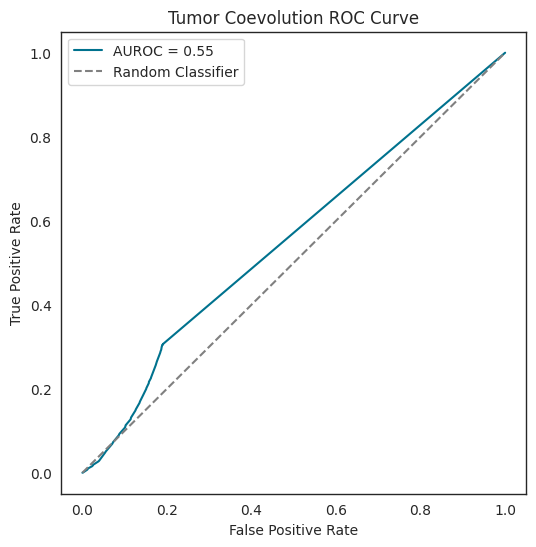

In [9]:
plt.figure(figsize=(6, 6))
plt.plot(fpr, tpr, label=f'AUROC = {auroc:.2f}', color=ncolor)
plt.plot([0, 1], [0, 1], linestyle='--', label='Random Classifier', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Tumor Coevolution ROC Curve')
plt.legend(loc='upper left')
#plt.grid(True)
plt.show()

In [52]:
allowed_strings = ['(p.', 'amp', 'del']

In [53]:
def extract_gene_symbols(mutation_string):
    if pd.isna(mutation_string) or mutation_string == '':
        return []

    # Split the string into individual entries
    gene_entries = mutation_string.split(',')

    # Filter entries to only those with parentheses
    #allowed_strings = ['(p.', '(amp', '(del']
    
    filtered_entries = [entry for entry in gene_entries if any([ x in entry for x in allowed_strings]) and ')' in entry]

    # Remove the parentheses and any content within them
    cleaned_entries = [re.sub(r'\([^()]*\)', '', entry).strip() for entry in filtered_entries]

    # Return the cleaned entries
    return cleaned_entries

In [54]:
#gene_names = pd.read_csv('/home/lnemati/resources/biomart/ensembl_to_symbol_filtered.csv.gz')['Gene name'].values
output_dir = '/home/lnemati/pathway_crosstalk/results/coevolution/tumor'
df_complete = pd.read_csv('/projects/bioinformatics/DB/CancerTracer/intra_heterogeneity_data.txt', sep='\t')
df_complete = df_complete.set_index('Sample', drop=False)
df_complete = df_complete.replace({'-': ''})

# Remove wrongly formatted row
df_complete = df_complete[~df_complete.index.isin(['p075_p3'])]

df_complete['Trunk'] = df_complete['Trunk_mutation'].apply(extract_gene_symbols)
df_complete['Branch'] = df_complete['Branch_mutation'].apply(extract_gene_symbols)
df_complete['Private'] = df_complete['Private_mutation'].apply(extract_gene_symbols)

In [55]:
keep = df_complete.apply(lambda x: any([len(x['Trunk']), len(x['Branch']), len(x['Private'])]) != 0, axis=1).values
df_complete = df_complete[keep]

In [57]:
df_complete.Cancertype.value_counts()

Glioma                               176
Lung Cancer                          136
Esophageal Cancer                     90
Colorectal Cancer                     54
Breast Cancer                         37
Bladder Cancer                        34
Ovarian Cancer                        32
Prostate Cancer                       31
Hepato-Cholangiocarcinoma             17
Leukemia                              11
Pancreatic Cancer                      9
Renal Cancer                           8
Salivary Adenoid Cystic Carcinoma      7
Gastric Carcinoma                      5
Hepatocellular Carcinoma               5
Thyroid Cancer                         4
Urothelial Carcinoma                   2
Melanoma                               1
Cervical Cancer                        1
Uterine Leiomyomas                     1
Name: Cancertype, dtype: int64

In [4]:
mutations = pd.read_csv('/home/lnemati/pathway_crosstalk/results/coevolution/tumor/mutations_df.csv')

In [5]:
mutations = mutations.query("cancertype == 'all_cancers'")

mtypes = pd.DataFrame(0, index=mutations.gene.unique(), columns=['Trunk', 'Branch', 'Private', 'Patient'])

for gene, df in mutations.groupby('gene'):
    counts = df['mutation'].value_counts()
    for mutation_type in counts.index:
        mtypes.at[gene, mutation_type] = counts.loc[mutation_type]
        mtypes.at[gene, mutation_type] = counts.loc[mutation_type]
        mtypes.at[gene, mutation_type] = counts.loc[mutation_type]

mtypes = mtypes.drop(columns=['Patient'])
mtypes['Tot'] = mtypes.sum(axis=1)

mtypes = mtypes.sort_values(by='Tot', ascending=False)
fracs = mtypes.iloc[:, :3].div(mtypes['Tot'].values, axis=0)

mtypes = mtypes.iloc[:, :3]

In [6]:
mtypes.mean()

Trunk      2.003077
Branch     1.214977
Private    3.520719
dtype: float64

In [ ]:
# Create a stacked bar plot
ax = mtypes[:50].plot(kind='bar', stacked=True, figsize=(10, 7))

# Set labels and title
ax.set_xlabel('Genes')
ax.set_ylabel('Fraction')
ax.set_title('Fractions of mutation types')
plt.xticks(rotation=45, ha='right')

# Display the plot
plt.show()

In [61]:
all_pairs = pd.read_csv('/home/lnemati/pathway_crosstalk/data/tumor_coev/all_cancers/Patient/cooccurrences_unfiltered.csv').set_index(['gene1', 'gene2'])

In [64]:
max_lor = all_pairs.loc[all_pairs.log2_odds_ratio <  np.inf, 'log2_odds_ratio'].max() + 1
min_lor = all_pairs.loc[all_pairs.log2_odds_ratio > -np.inf, 'log2_odds_ratio'].min() - 1

all_pairs.loc[all_pairs.log2_odds_ratio ==  np.inf, 'log2_odds_ratio'] = max_lor
all_pairs.loc[all_pairs.log2_odds_ratio == -np.inf, 'log2_odds_ratio'] = min_lor

all_pairs['-log10pval'] = -np.log10(all_pairs['pval'])

In [67]:
# Diff complex interactions
fpr, tpr, thr, auroc = generate_roc_curve(
    data=all_pairs,
    target_col="interaction",
    feature_col="-log10pval",
)

print('auroc')

KeyError: 'interaction'

In [43]:
auroc

0.5297258508280704

In [44]:
all_pairs

interaction  log2_odds_ratio          pval      pval_adj  \
gene1     gene2                                                                 
BAT2D1    HPSE_CCDS        False        14.145932  2.745261e-33  1.898051e-27   
HPSE_CCDS CDC2L2           False        14.145932  2.745261e-33  1.898051e-27   
FRG1B     CDC2L2           False        14.145932  2.339629e-33  1.898051e-27   
BAT2D1    FRG1B            False        14.145932  2.339629e-33  1.898051e-27   
MRPL30    CDC2L2           False        14.145932  2.339629e-33  1.898051e-27   
...                          ...              ...           ...           ...   
PHF19     SRBD1            False        -4.006841  1.000000e+00  1.000000e+00   
NTRK3     KIAA0319L        False        -4.006841  1.000000e+00  1.000000e+00   
          PTPN13           False        -4.006841  1.000000e+00  1.000000e+00   
          TMEM63A          False        -4.006841  1.000000e+00  1.000000e+00   
SLX4      OTUD4            False        -4.006841  1.000000e+00  1.000000e+00   

                     -log10pval  
gene1     gene2                  
BAT2D1    HPSE_CCDS   32.561416  
HPSE_CCDS CDC2L2      32.561416  
FRG1B     CDC2L2      32.630853  
BAT2D1    FRG1B       32.630853  
MRPL30    CDC2L2      32.630853  
...                         ...  
PHF19     SRBD1       -0.000000  
NTRK3     KIAA0319L   -0.000000  
          PTPN13      -0.000000  
          TMEM63A     -0.000000  
SLX4      OTUD4       -0.000000  

[8296701 rows x 5 columns]

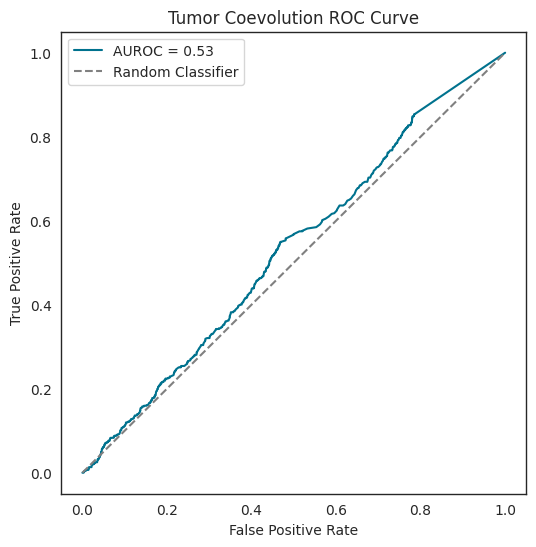

In [45]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 6))
plt.plot(fpr, tpr, label=f'AUROC = {auroc:.2f}', color=ncolor)
plt.plot([0, 1], [0, 1], linestyle='--', label='Random Classifier', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Tumor Coevolution ROC Curve')
plt.legend(loc='upper left')
#plt.grid(True)
plt.show()


In [80]:
tissue = 'All Cancers'
mutation_type='Patient'

In [85]:
df_complete = pd.read_csv('/projects/bioinformatics/DB/CancerTracer/intra_heterogeneity_data.txt', sep='\t')
df_complete = df_complete.set_index('Sample')
df_complete = df_complete.replace({'-': ''})

# Remove wrongly formatted row
df_complete = df_complete[~df_complete.index.isin(['p075_p3'])]

In [81]:
coev = pd.read_csv(f'/home/lnemati/pathway_crosstalk/results/coevolution/tumor/{tissue}/{mutation_type}/jaccard.csv', index_col=0)
gene_counts = pd.read_csv(f'/home/lnemati/pathway_crosstalk/results/coevolution/tumor/{tissue}/{mutation_type}/gene_counts.csv', index_col=0)
gene_counts = gene_counts.rename(columns={'genes': 'All'})

In [82]:
path = '/home/lnemati/pathway_crosstalk/results/coevolution/tumor/All Cancers'

for mutation_type in ['Trunk', 'Branch', 'Private']:
    gene_counts[mutation_type] = pd.read_csv(os.path.join(path, mutation_type, 'gene_counts.csv'), index_col=0)['genes']
    
gene_counts = gene_counts.fillna(0)

In [83]:
path = '/projects/bioinformatics/DB/CellCellCommunication/WithEnzymes/cpdb_cellchat_enz.csv'

interactions = pd.read_csv(path)

# Extract genes for complex A and B for each row
complex_a_genes = interactions.apply(lambda row: list(set([row[f'interactor{i}'] for i in range(1, row['num_interactors_a'] + 1) if pd.notna(row[f'interactor{i}'])])), axis=1)
complex_b_genes = interactions.apply(lambda row: list(set([row[f'interactor{i}'] for i in range(row['num_interactors_a'] + 1, row['num_interactors_a'] + row['num_interactors_b'] + 1) if pd.notna(row[f'interactor{i}'])])), axis=1)
interactions_all_genes = complex_a_genes + complex_b_genes

# make all_interacting_genes a list containing all unique genes in the interactions
all_interacting_genes = list(set().union(*interactions_all_genes))
print("Number of interacting genes: ", len(all_interacting_genes))

Number of interacting genes:  1576


In [84]:
gene_counts['interactor'] = False
gene_counts.loc[gene_counts.index.isin(all_interacting_genes), 'interactor'] = True

In [10]:
from itertools import combinations, product

# Function that generates and saves the ROC curve
def generate_roc_curve(
    data,
    target_col,
    feature_col,
):
    # ROC curve using all gene pairs
    fpr, tpr, thr = roc_curve(data[target_col], data[feature_col])
    auroc = roc_auc_score(data[target_col], data[feature_col])
    
    return fpr, tpr, thr, auroc

def update_diff_complex(
    coev,
    genes_series_a,
    genes_series_b
):
    for genes_a, genes_b in zip(genes_series_a, genes_series_b):
        for pair in product(genes_a, genes_b):
            gene_a, gene_b = pair
            if pair in coev.index:
                coev.loc[pair, "interaction"] = 1
            elif (gene_b, gene_a) in coev.index:
                coev.loc[(gene_b, gene_a), "interaction"] = 1
    return

print("Reading interactions.csv")
# read interactions.csv

path = '/projects/bioinformatics/DB/CellCellCommunication/WithEnzymes/cpdb_cellchat_enz.csv'

interactions = pd.read_csv(path)

# Extract genes for complex A and B for each row
complex_a_genes = interactions.apply(lambda row: list(set([row[f'interactor{i}'] for i in range(1, row['num_interactors_a'] + 1) if pd.notna(row[f'interactor{i}'])])), axis=1)
complex_b_genes = interactions.apply(lambda row: list(set([row[f'interactor{i}'] for i in range(row['num_interactors_a'] + 1, row['num_interactors_a'] + row['num_interactors_b'] + 1) if pd.notna(row[f'interactor{i}'])])), axis=1)
interactions_all_genes = complex_a_genes + complex_b_genes

# make all_interacting_genes a list containing all unique genes in the interactions
all_interacting_genes = list(set().union(*interactions_all_genes))
print("Number of interacting genes: ", len(all_interacting_genes))

# ----- ROC all gene pairs -----

print("Generating ROC curves")

print("coev has shape: ", coev.shape)

# flatten TOM matrix, remove diagonal and duplicated values
print("Flattening coev matrix")
coev = pd.DataFrame(
    coev.where(
        np.tri(
            coev.shape[0],
            dtype=bool,
            k=-1
        ),
        np.nan
    ).stack(dropna=True), columns=["coev"]
)
print("coev has now shape: ", coev.shape)

coev['interaction'] = 0

update_diff_complex(coev, complex_a_genes, complex_b_genes)

print("Total number of interacting pairs: ", coev["interaction"].sum())

# Diff complex interactions
fpr, tpr, thr, auroc = generate_roc_curve(
    data=coev,
    target_col="interaction",
    feature_col="coev",
)

print('auroc:', auroc)

# ------ Rank Sum Test VS All -------
#print("Performing rank sum test")
#
## Perform rank sum test: do interacting pairs have higher TOM than other pairs?
#U_all, p_all = mannwhitneyu(
#    coev.loc[coev['interaction'] == True, "coev"],
#    coev.loc[coev['interaction'] == False, "coev"],
#    alternative="greater"
#)
#
#print('U:', U_all)
#print('p:', p_all)

Reading interactions.csv
Number of interacting genes:  1576
Generating ROC curves
coev has shape:  (20155, 20155)
Flattening coev matrix
coev has now shape:  (203101935, 1)
Total number of interacting pairs:  3433
auroc: 0.5881786390268736


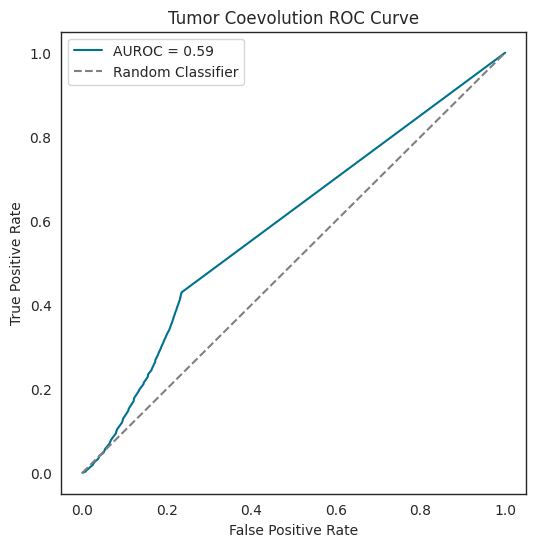

In [11]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 6))
plt.plot(fpr, tpr, label=f'AUROC = {auroc:.2f}', color=ncolor)
plt.plot([0, 1], [0, 1], linestyle='--', label='Random Classifier', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Tumor Coevolution ROC Curve')
plt.legend(loc='upper left')
#plt.grid(True)
plt.show()


In [23]:
'orig' + pd.Series(range(1, 10)).astype(str).values

array(['orig1', 'orig2', 'orig3', 'orig4', 'orig5', 'orig6', 'orig7',
       'orig8', 'orig9'], dtype=object)

In [12]:
coev[coev['interaction'] == 1].sort_values(by = 'coev', ascending=False)[:20]

,,coev,interaction
RXFP4,INSL3,0.500000,1
NAPEPLD,CNR2,0.400000,1
MICA,KLRK1,0.333333,1
JAM3,JAM2,0.300000,1
IL1RN,IL1R2,0.285714,1
GIPR,GIP,0.250000,1
PLA2G2A,FFAR4,0.250000,1
WNT5A,RYK,0.250000,1
WNT9B,FZD5,0.250000,1
WNT3A,FZD5,0.250000,1


In [13]:
tpr[tpr < 1].max()

0.4296533644043111

In [42]:
tcoev_int = coev[coev.interaction == 1]

In [46]:
tcoev_int.to_csv('/home/lnemati/pathway_crosstalk/results/coevolution/comparison/lr_pairs_tumor_coev_all.csv')

In [86]:
cols = ['Trunk', 'Branch', 'Private']

fracs = gene_counts[cols]

tot = df_complete.shape[0]

for col in cols:
    fracs[col] = gene_counts[col] / tot

In [98]:
gene_counts

,All,Trunk,Branch,Private,interactor
TP53,397,292.0,86.0,108.0,False
TTN,221,154.0,86.0,257.0,False
EGFR,158,104.0,29.0,57.0,True
MUC16,131,85.0,53.0,111.0,False
PTEN,116,50.0,29.0,50.0,False
...,...,...,...,...,...
C17orf108,1,0.0,0.0,1.0,False
C6orf204,1,0.0,1.0,0.0,False
TEX19,1,0.0,0.0,1.0,False
ALDH3B1,1,0.0,0.0,1.0,False


In [87]:
fracs

,Trunk,Branch,Private
TP53,0.253472,0.074653,0.093750
TTN,0.133681,0.074653,0.223090
EGFR,0.090278,0.025174,0.049479
MUC16,0.073785,0.046007,0.096354
PTEN,0.043403,0.025174,0.043403
...,...,...,...
C17orf108,0.000000,0.000000,0.000868
C6orf204,0.000000,0.000868,0.000000
TEX19,0.000000,0.000000,0.000868
ALDH3B1,0.000000,0.000000,0.000868


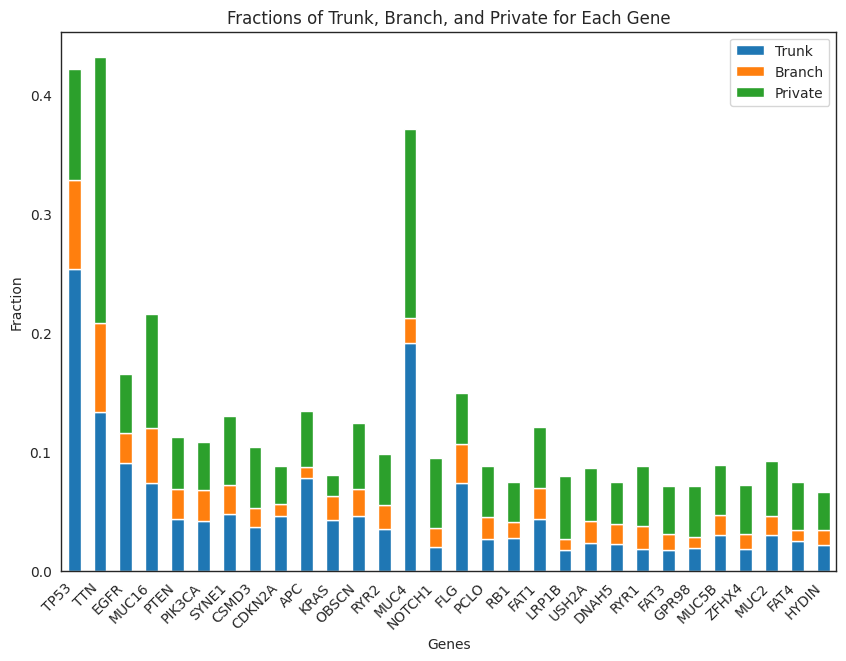

In [93]:
# Create a stacked bar plot
ax = fracs[:30].plot(kind='bar', stacked=True, figsize=(10, 7))

# Set labels and title
ax.set_xlabel('Genes')
ax.set_ylabel('Fraction')
ax.set_title('Fractions of Trunk, Branch, and Private for Each Gene')
plt.xticks(rotation=45, ha='right')

# Display the plot
plt.show()

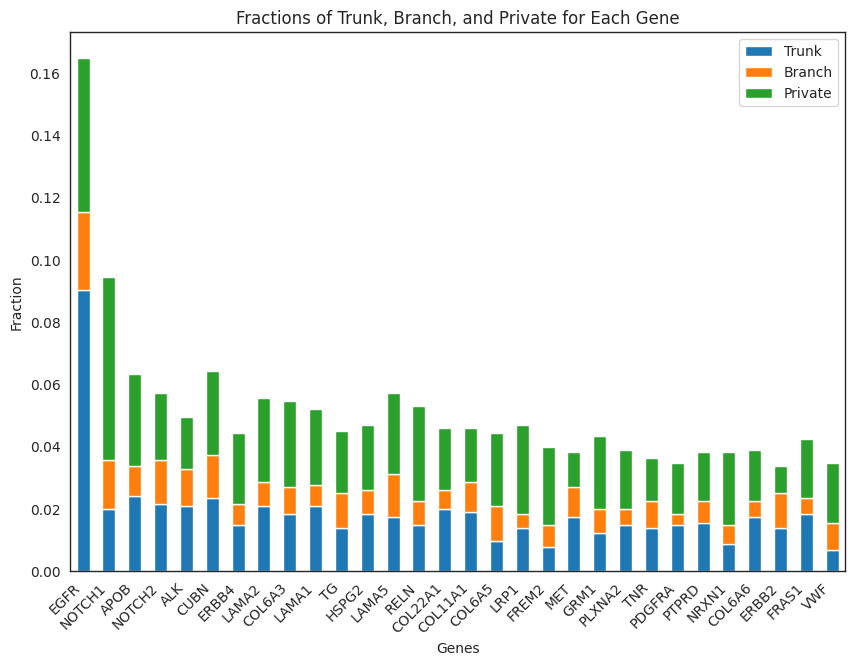

In [94]:
interactors = gene_counts[gene_counts['interactor']].index

# Create a stacked bar plot
ax = fracs.loc[interactors][0:30].plot(kind='bar', stacked=True, figsize=(10, 7))

# Set labels and title
ax.set_xlabel('Genes')
ax.set_ylabel('Fraction')
ax.set_title('Fractions of Trunk, Branch, and Private for Each Gene')
plt.xticks(rotation=45, ha='right')

# Display the plot
plt.show()

In [90]:
mutated = gene_counts[gene_counts['All'] > 10].index

In [99]:
df_frac

,Trunk,Branch,Private
TP53,0.253472,0.074653,0.093750
MUC4,0.190972,0.021701,0.158854
TTN,0.133681,0.074653,0.223090
EGFR,0.090278,0.025174,0.049479
APC,0.078125,0.008681,0.047743
...,...,...,...
CDC7,0.000000,0.001736,0.009549
NBPF1,0.000000,0.006944,0.006944
PANK3,0.000000,0.001736,0.009549
NPHP3,0.000000,0.000868,0.009549


In [101]:
df_frac = fracs.loc[mutated].sort_values(by='Trunk', ascending=False)
df_frac.loc[df_frac.index.intersection(interactors)][:20]

,Trunk,Branch,Private
EGFR,0.090278,0.025174,0.049479
APOB,0.024306,0.009549,0.029514
CUBN,0.023438,0.013889,0.026910
NOTCH2,0.021701,0.013889,0.021701
LAMA2,0.020833,0.007812,0.026910
ALK,0.020833,0.012153,0.016493
LAMA1,0.020833,0.006944,0.024306
COL22A1,0.019965,0.006076,0.019965
NOTCH1,0.019965,0.015625,0.059028
COL11A1,0.019097,0.009549,0.017361


In [92]:
df_frac = fracs.loc[mutated].sort_values(by='Private', ascending=False)
df_frac.loc[df_frac.index.intersection(interactors)][:20]

,Trunk,Branch,Private
NOTCH1,0.019965,0.015625,0.059028
EGFR,0.090278,0.025174,0.049479
RELN,0.014757,0.007812,0.030382
APOB,0.024306,0.009549,0.029514
LRP1,0.013889,0.004340,0.028646
COL6A3,0.018229,0.008681,0.027778
LAMA2,0.020833,0.007812,0.026910
CUBN,0.023438,0.013889,0.026910
LAMA5,0.017361,0.013889,0.026042
FREM2,0.007812,0.006944,0.025174


# Coevolution - Normal

In [8]:
ncoev_int = all_pairs[all_pairs.interaction == 1]

In [9]:
ncoev_int

coev  interaction
ADIPOR1 ADIPOQ  0.194296            1
ADIPOR2 ADIPOQ  0.208487            1
ADORA1  ACP3    0.291429            1
        ADA     0.123382            1
        ADA2    0.316754            1
...                  ...          ...
WNT9B   SFRP4   0.575581            1
        SFRP5   0.560440            1
        WIF1    0.524887            1
XCR1    XCL1    0.478873            1
        XCL2    0.485915            1

[3467 rows x 2 columns]

In [10]:
ncoev_int.to_csv('/home/lnemati/pathway_crosstalk/results/coevolution/comparison/lr_pairs_normal_coev.csv')

In [29]:
ncoev_int = pd.read_csv('/home/lnemati/pathway_crosstalk/results/coevolution/comparison/lr_pairs_normal_coev.csv')
tcoev_int = pd.read_csv('/home/lnemati/pathway_crosstalk/results/coevolution/comparison/lr_pairs_tumor_coev_all.csv')

ncoev_int = ncoev_int.set_index(['Unnamed: 0', 'Unnamed: 1']).drop(columns='interaction')
tcoev_int = tcoev_int.set_index(['Unnamed: 0', 'Unnamed: 1']).drop(columns='interaction')

common_pairs = tcoev_int.index.intersection(ncoev_int.index)

ncoev_int = ncoev_int.loc[common_pairs]
tcoev_int = tcoev_int.loc[common_pairs]

In [34]:
from scipy.stats import spearmanr
spearmanr(ncoev_int.coev, tcoev_int.coev)

SignificanceResult(statistic=-0.0018571881162175968, pvalue=0.9285297752167221)

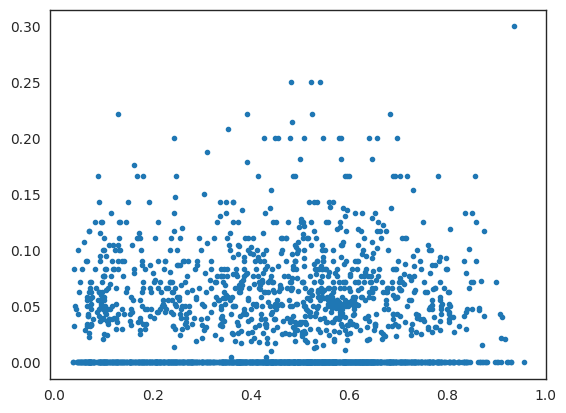

In [36]:
plt.plot(ncoev_int.coev, tcoev_int.coev, marker='.', linestyle=' ')

In [38]:
tcoev_int.idxmax()

coev    (JAM3, JAM2)
dtype: object

In [8]:
ncorr = pd.read_csv('/home/lnemati/pathway_crosstalk/results/coevolution/coexpression_correlation_normal.csv.gz', index_col=0)
tcorr = pd.read_csv('/home/lnemati/pathway_crosstalk/results/coevolution/coexpression_correlation_tumor.csv.gz', index_col=0)

In [4]:
norm = pd.read_csv('/home/lnemati/pathway_crosstalk/results/coevolution/avg_coexpression_normal.csv.gz', index_col=0)
norm = tri_vals(norm)

In [5]:
tumo = pd.read_csv('/home/lnemati/pathway_crosstalk/results/coevolution/avg_coexpression_tumor.csv.gz', index_col=0)
tumo = tri_vals(tumo)

In [7]:
def tri_vals(df):
    # Convert DataFrame to NumPy array
    arr = df.to_numpy()
    
    # Get the indices for the upper triangle excluding the diagonal
    triu_indices = np.triu_indices(arr.shape[0], k=1)
    
    # Extract the upper triangle values using the indices
    upper_triangle_vals = arr[triu_indices]
    
    return upper_triangle_vals

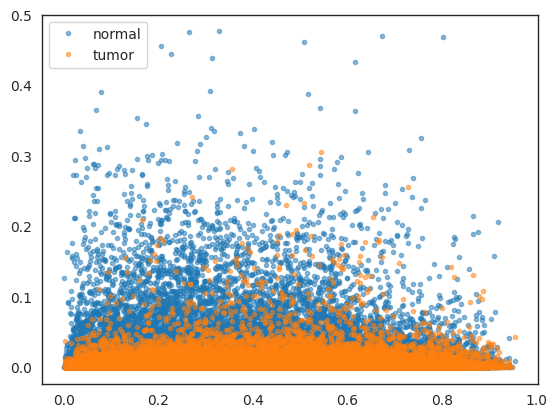

In [30]:
subset = 100
plt.plot(coev[::subset], norm[::subset], label='normal', linestyle=" ", marker='.', alpha=0.5)
plt.plot(coev[::subset], tumo[::subset], label='tumor', linestyle=" ", marker='.', alpha=0.5)
plt.legend()

In [37]:
from scipy.stats import spearmanr
from scipy.stats import pearsonr

In [43]:
subset = 100

In [44]:
spearmanr(norm[::subset], tumo[::subset], nan_policy='omit')

SignificanceResult(statistic=0.35415773680445267, pvalue=0.0)

In [45]:
spearmanr(coev[::subset], norm[::subset], nan_policy='omit')

SignificanceResult(statistic=0.117068279621558, pvalue=0.0)

In [46]:
spearmanr(coev[::subset], tumo[::subset], nan_policy='omit')

SignificanceResult(statistic=0.08840442631874691, pvalue=0.0)

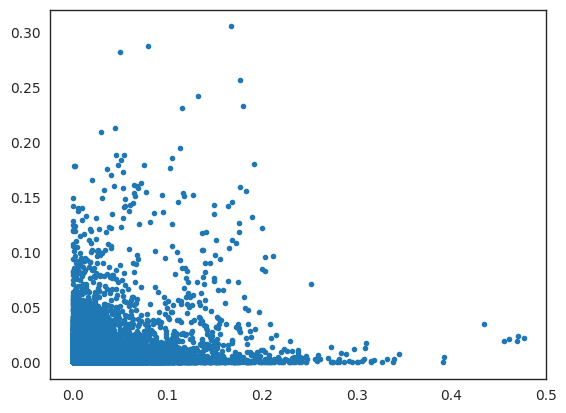

In [31]:
plt.plot(norm[::subset], tumo[::subset], label='normal', linestyle=" ", marker='.')

# Hub Genes

In [5]:
df = pd.read_csv('/home/lnemati/pathway_crosstalk/results/hubs/n_tissues_top_node_metrics.csv', index_col=0)
df.head(3)

,f_degree_tumor,f_closeness_tumor,f_betweenness_tumor,f_pagerank_tumor,f_clustering_local_tumor,f_degree_normal,f_closeness_normal,f_betweenness_normal,f_pagerank_normal,f_clustering_local_normal,interactor
TSPAN18,0.0625,0.03125,0.03125,0.06250,0.12500,0.06383,0.06383,0.0,0.106383,0.085106,0
C3orf84,0.0000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.0,0.000000,0.000000,0
CEP250,0.0000,0.06250,0.03125,0.03125,0.03125,0.00000,0.00000,0.0,0.000000,0.042553,0


In [14]:
top_ccc = df[df['interactor'].astype(bool)][['f_degree_tumor', 'f_degree_normal']]
top_ccc['sum'] = top_ccc['f_degree_tumor'] + top_ccc['f_degree_normal']
top_ccc.sort_values(by='f_degree_tumor', ascending=False).head(20)

,f_degree_tumor,f_degree_normal,sum
IL10RA,0.90625,0.170213,1.076463
LAIR1,0.90625,0.212766,1.119016
CD86,0.87500,0.106383,0.981383
CD4,0.87500,0.085106,0.960106
LILRB4,0.84375,0.127660,0.971410
HCST,0.84375,0.063830,0.907580
CSF2RB,0.84375,0.021277,0.865027
ITGB2,0.84375,0.319149,1.162899
PTPRC,0.84375,0.234043,1.077793
TYROBP,0.84375,0.340426,1.184176


In [6]:
(df['f_degree_tumor'] - df['f_degree_normal']).sort_values().tail(20)

TRAF3IP3     0.727394
IL10RA       0.736037
SLAMF8       0.738697
C1orf162     0.738697
NCKAP1L      0.746011
RASAL3       0.747340
LST1         0.747340
PLEK         0.747340
CD84         0.747340
LY86         0.748670
CCR5         0.748670
CD37         0.757314
CYTH4        0.757314
CD86         0.768617
HCST         0.779920
CD4          0.789894
TNFAIP8L2    0.811170
SCIMP        0.811170
CSF2RB       0.822473
IL16         0.822473
dtype: float64

In [7]:
df.loc['CD4']

f_degree_tumor               0.875000
f_closeness_tumor            0.625000
f_betweenness_tumor          0.093750
f_pagerank_tumor             0.687500
f_clustering_local_tumor     0.343750
f_degree_normal              0.085106
f_closeness_normal           0.021277
f_betweenness_normal         0.106383
f_pagerank_normal            0.106383
f_clustering_local_normal    0.127660
interactor                   1.000000
Name: CD4, dtype: float64

In [38]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def plot_node_analysis(df, metric='degree', save_path=None):
    """
    Plot hub analysis for different metrics, such as 'degree', 'betweenness', etc.

    Parameters:
    - df: DataFrame containing the data.
    - metric: String, the metric to use for the plot. Default is 'degree'.
    - graycolor, tcolor, tcolor2, ncolor, ncolor2: Colors for the plots.
    - save_path: Path to save the plot. If None, the plot will not be saved.
    """
    # Generate column names based on the metric
    tumor_col = f'f_{metric}_tumor'
    normal_col = f'f_{metric}_normal'

    # Convert columns to numeric (ensuring proper conversion)
    df[tumor_col] = pd.to_numeric(df[tumor_col], errors='coerce')
    df[normal_col] = pd.to_numeric(df[normal_col], errors='coerce')

    # Init Tumor Hubs DataFrame
    tumor_hub_values = df[tumor_col].dropna().unique()  # Drop NaNs before sorting
    tumor_hub_df = pd.DataFrame(index=sorted(tumor_hub_values, reverse=True), columns=['CCC', 'Other Genes'])

    # Init Normal Hubs DataFrame
    normal_hub_values = df[normal_col].dropna().unique()  # Drop NaNs before sorting
    normal_hub_df = pd.DataFrame(index=sorted(normal_hub_values, reverse=True), columns=['CCC', 'Other Genes'])

    # Init All Hubs DataFrame
    all_hub_values = set(normal_hub_values).union(tumor_hub_values)
    all_hub_df = pd.DataFrame(index=sorted(all_hub_values, reverse=True), columns=['Tumor', 'Normal', 'Both'])

    # Prepare Tumor Hubs DataFrame
    for value in tumor_hub_df.index:
        tumor_hub_df.loc[value, 'CCC'] = ((df[tumor_col] >= value) & (df['interactor'] == 1)).sum()
        tumor_hub_df.loc[value, 'Other Genes'] = ((df[tumor_col] >= value) & (df['interactor'] == 0)).sum()

    # Prepare Normal Hubs DataFrame
    for value in normal_hub_df.index:
        normal_hub_df.loc[value, 'CCC'] = ((df[normal_col] >= value) & (df['interactor'] == 1)).sum()
        normal_hub_df.loc[value, 'Other Genes'] = ((df[normal_col] >= value) & (df['interactor'] == 0)).sum()

    # Prepare All Hubs DataFrame
    for value in all_hub_df.index:
        all_hub_df.loc[value, 'Both'] = ((df[normal_col] >= value) & (df[tumor_col] >= value)).sum()
        all_hub_df.loc[value, 'Normal'] = (df[normal_col] >= value).sum() - all_hub_df.loc[value, 'Both']
        all_hub_df.loc[value, 'Tumor'] = (df[tumor_col] >= value).sum() - all_hub_df.loc[value, 'Both']

    # Normalize frequencies in Tumor and Normal Hubs DataFrame
    tumor_hub_df = tumor_hub_df.div(tumor_hub_df.sum(axis=1), axis=0)
    normal_hub_df = normal_hub_df.div(normal_hub_df.sum(axis=1), axis=0)

    # Ensure all values are numeric
    tumor_hub_df = tumor_hub_df.astype(np.float64)
    normal_hub_df = normal_hub_df.astype(np.float64)
    all_hub_df = all_hub_df.astype(np.float64)

    # Define x values
    normal_hub_x = normal_hub_df.index
    tumor_hub_x = tumor_hub_df.index
    all_hub_x = all_hub_df.index

    # Create the figure and the layout
    fig = plt.figure(figsize=(10, 10))
    axs = fig.subplot_mosaic(
        """
        A
        B
        C
        """
    )
    
    # Plot All Hubs using plt.stackplot
    axs['A'].stackplot(all_hub_x, all_hub_df['Both'], all_hub_df['Tumor'], all_hub_df['Normal'],
                  colors=[graycolor, tcolor, ncolor], edgecolor='black', linewidth=1)
    axs['A'].vlines(x=df[tumor_col].max(),  ymin=0, ymax=2e4, color=tcolor, linestyle='--')
    axs['A'].vlines(x=df[normal_col].max(), ymin=0, ymax=2e4, color=ncolor, linestyle='--')
    axs['A'].set_ylabel('Number of Genes')
    axs['A'].grid(False)

    # Plot Normal Hubs using plt.stackplot
    axs['B'].stackplot(normal_hub_x, normal_hub_df['CCC'], normal_hub_df['Other Genes'],
                  colors=[ncolor, ncolor2], edgecolor='black', linewidth=1)
    axs['B'].set_ylabel('Fraction of Genes')
    axs['B'].grid(False)

    # Plot Tumor Hubs using plt.stackplot
    axs['C'].stackplot(tumor_hub_x, tumor_hub_df['CCC'], tumor_hub_df['Other Genes'],
                  colors=[tcolor, tcolor2], edgecolor='black')
    axs['C'].set_xlabel('Fraction of Tissues')
    axs['C'].set_ylabel('Fraction of Genes')
    axs['C'].grid(False)

    # Adjust layout to remove space between plots
    # plt.tight_layout()

    # Add legends
    loc = 'center'
    bbox = (0.8, 0.7)
    axs['A'].legend(['$N_{Both}$', '$N_{Tumor}$', '$N_{Normal}$'], title='All Hub Genes', bbox_to_anchor=bbox, loc=loc)
    axs['B'].legend(['CCC Genes', 'Other Genes'], title='Normal Hub Genes', bbox_to_anchor=bbox, loc=loc)
    axs['C'].legend(['CCC Genes', 'Other Genes'], title='Tumor Hub Genes', bbox_to_anchor=bbox, loc=loc)

    axs['A'].set_xlim(0, 1)
    axs['B'].set_xlim(0, 1)
    axs['C'].set_xlim(0, 1)

    axs['A'].set_ylim(0, 20000)
    axs['B'].set_ylim(0, 1.005)
    axs['C'].set_ylim(0, 1.005)
    
    axs['A'].set_xticks([])
    axs['B'].set_xticks([])

    # Save or show the plot
    if save_path:
        plt.savefig(save_path)
    else:
        plt.show()
    
    return all_hub_df, normal_hub_df, tumor_hub_df
# Example usage:
# plot_hub_analysis(df, metric='betweenness', save_path='/path/to/save/plot.pdf')

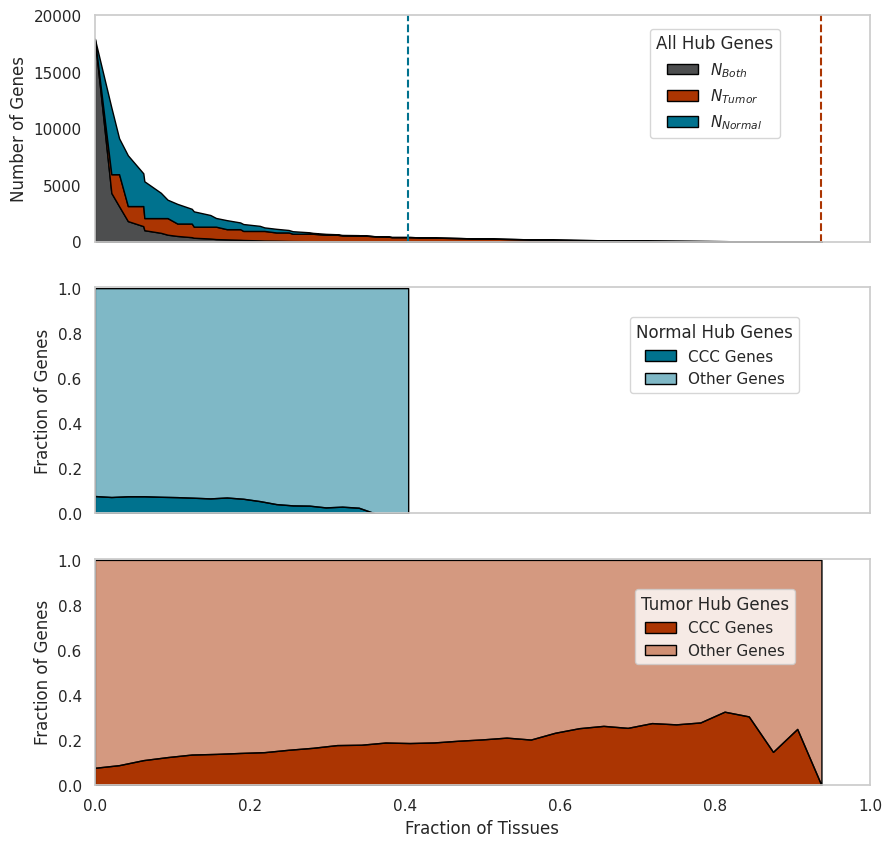

In [39]:
all_nodes, normal_nodes, tumor_nodes = plot_node_analysis(df, metric='degree', save_path='/home/lnemati/pathway_crosstalk/results/figures/hubs/area_hubs.pdf')

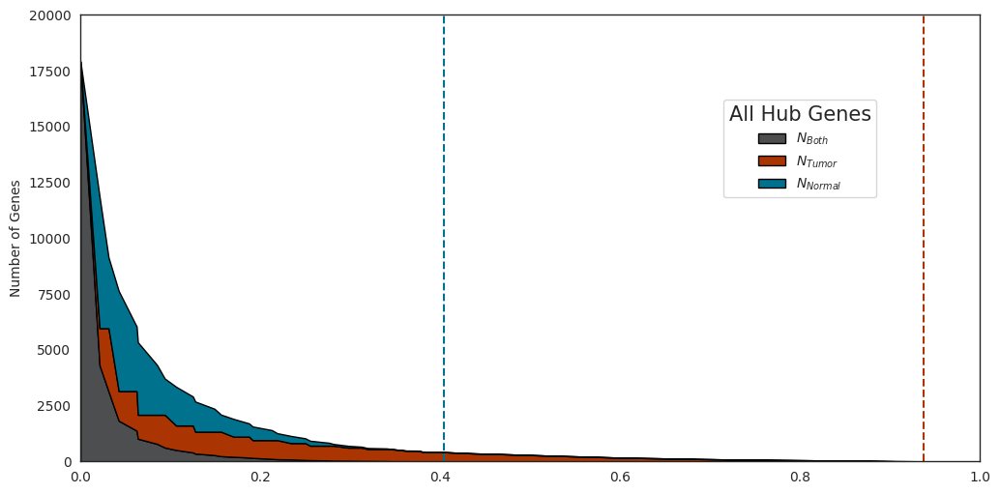

In [36]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def plot_only_one_node_analysis(panel, df, metric='degree', save_path=None):
    """
    Plot hub analysis for different metrics, such as 'degree', 'betweenness', etc.

    Parameters:
    - df: DataFrame containing the data.
    - metric: String, the metric to use for the plot. Default is 'degree'.
    - graycolor, tcolor, tcolor2, ncolor, ncolor2: Colors for the plots.
    - save_path: Path to save the plot. If None, the plot will not be saved.
    """
    
    panel = list(panel)
    
    # Generate column names based on the metric
    tumor_col = f'f_{metric}_tumor'
    normal_col = f'f_{metric}_normal'

    # Convert columns to numeric (ensuring proper conversion)
    df[tumor_col] = pd.to_numeric(df[tumor_col], errors='coerce')
    df[normal_col] = pd.to_numeric(df[normal_col], errors='coerce')

    # Init Tumor Hubs DataFrame
    tumor_hub_values = df[tumor_col].dropna().unique()  # Drop NaNs before sorting
    tumor_hub_df = pd.DataFrame(index=sorted(tumor_hub_values, reverse=True), columns=['CCC', 'Other Genes'])

    # Init Normal Hubs DataFrame
    normal_hub_values = df[normal_col].dropna().unique()  # Drop NaNs before sorting
    normal_hub_df = pd.DataFrame(index=sorted(normal_hub_values, reverse=True), columns=['CCC', 'Other Genes'])

    # Init All Hubs DataFrame
    all_hub_values = set(normal_hub_values).union(tumor_hub_values)
    all_hub_df = pd.DataFrame(index=sorted(all_hub_values, reverse=True), columns=['Tumor', 'Normal', 'Both'])

    # Prepare Tumor Hubs DataFrame
    for value in tumor_hub_df.index:
        tumor_hub_df.loc[value, 'CCC'] = ((df[tumor_col] >= value) & (df['interactor'] == 1)).sum()
        tumor_hub_df.loc[value, 'Other Genes'] = ((df[tumor_col] >= value) & (df['interactor'] == 0)).sum()

    # Prepare Normal Hubs DataFrame
    for value in normal_hub_df.index:
        normal_hub_df.loc[value, 'CCC'] = ((df[normal_col] >= value) & (df['interactor'] == 1)).sum()
        normal_hub_df.loc[value, 'Other Genes'] = ((df[normal_col] >= value) & (df['interactor'] == 0)).sum()

    # Prepare All Hubs DataFrame
    for value in all_hub_df.index:
        all_hub_df.loc[value, 'Both'] = ((df[normal_col] >= value) & (df[tumor_col] >= value)).sum()
        all_hub_df.loc[value, 'Normal'] = (df[normal_col] >= value).sum() - all_hub_df.loc[value, 'Both']
        all_hub_df.loc[value, 'Tumor'] = (df[tumor_col] >= value).sum() - all_hub_df.loc[value, 'Both']

    # Normalize frequencies in Tumor and Normal Hubs DataFrame
    tumor_hub_df = tumor_hub_df.div(tumor_hub_df.sum(axis=1), axis=0)
    normal_hub_df = normal_hub_df.div(normal_hub_df.sum(axis=1), axis=0)

    # Ensure all values are numeric
    tumor_hub_df = tumor_hub_df.astype(np.float64)
    normal_hub_df = normal_hub_df.astype(np.float64)
    all_hub_df = all_hub_df.astype(np.float64)

    # Define x values
    normal_hub_x = normal_hub_df.index
    tumor_hub_x = tumor_hub_df.index
    all_hub_x = all_hub_df.index

    # Create the figure and the layout
    axs = {}
    if len(panel) == 1:
        fig, ax = plt.subplots(1,1, figsize=(12, 6))
    
    if panel == [2,3]:
        fig, (ax1, ax2) = plt.subplots(2,1, figsize=(12, 6))
    
    # Add legends
    loc = 'center'
    bbox = (0.8, 0.7)
    
    if panel == [1]:
        axs['A'] = ax 
            
        # Plot All Hubs using plt.stackplot
        axs['A'].stackplot(all_hub_x, all_hub_df['Both'], all_hub_df['Tumor'], all_hub_df['Normal'],
                      colors=[graycolor, tcolor, ncolor], edgecolor='black', linewidth=1)
        axs['A'].vlines(x=df[tumor_col].max(),  ymin=0, ymax=2e4, color=tcolor, linestyle='--')
        axs['A'].vlines(x=df[normal_col].max(), ymin=0, ymax=2e4, color=ncolor, linestyle='--')
        axs['A'].set_ylabel('Number of Genes')
        axs['A'].grid(False)
        
        axs['A'].legend(['$N_{Both}$', '$N_{Tumor}$', '$N_{Normal}$'], title='All Hub Genes', bbox_to_anchor=bbox, loc=loc)
        axs['A'].set_xlim(0, 1)
        axs['A'].set_ylim(0, 20000)
        #axs['A'].set_xticks([])

    if panel == [2]:
        axs['B'] = ax
        
        # Plot Normal Hubs using plt.stackplot
        axs['B'].stackplot(normal_hub_x, normal_hub_df['CCC'], normal_hub_df['Other Genes'],
                      colors=[ncolor, ncolor2], edgecolor='black', linewidth=1)
        axs['B'].set_ylabel('Fraction of Genes')
        axs['B'].grid(False)
        
        axs['B'].legend(['CCC Genes', 'Other Genes'], title='Normal Hub Genes', bbox_to_anchor=bbox, loc=loc)
        axs['B'].set_xlim(0, 1)
        axs['B'].set_ylim(0, 1.005)
        #axs['B'].set_xticks([])

    if panel == [3]:
        axs['C'] = ax
        
        # Plot Tumor Hubs using plt.stackplot
        axs['C'].stackplot(tumor_hub_x, tumor_hub_df['CCC'], tumor_hub_df['Other Genes'],
                      colors=[tcolor, tcolor2], edgecolor='black')
        axs['C'].set_xlabel('Fraction of Tissues')
        axs['C'].set_ylabel('Fraction of Genes')
        axs['C'].grid(False)

        axs['C'].legend(['CCC Genes', 'Other Genes'], title='Tumor Hub Genes', bbox_to_anchor=bbox, loc=loc)

        axs['C'].set_xlim(0, 1)
        axs['C'].set_ylim(0, 1.005)

    if panel == [2, 3]:
        axs['B'] = ax1
        axs['C'] = ax2
        
        # Plot Normal Hubs using plt.stackplot
        axs['B'].stackplot(normal_hub_x, normal_hub_df['CCC'], normal_hub_df['Other Genes'],
                      colors=[ncolor, ncolor2], edgecolor='black', linewidth=1)
        axs['B'].set_ylabel('Fraction of Genes')
        axs['B'].grid(False)
        
        axs['B'].legend(['CCC Genes', 'Other Genes'], title='Normal Hub Genes', bbox_to_anchor=bbox, loc=loc)
        axs['B'].set_xlim(0, 1)
        axs['B'].set_ylim(0, 1.005)
        
        # Plot Tumor Hubs using plt.stackplot
        axs['C'].stackplot(tumor_hub_x, tumor_hub_df['CCC'], tumor_hub_df['Other Genes'],
                      colors=[tcolor, tcolor2], edgecolor='black')
        axs['C'].set_xlabel('Fraction of Tissues')
        axs['C'].set_ylabel('Fraction of Genes')
        axs['C'].grid(False)

        axs['C'].legend(['CCC Genes', 'Other Genes'], title='Tumor Hub Genes', bbox_to_anchor=bbox, loc=loc)

        axs['C'].set_xlim(0, 1)
        axs['C'].set_ylim(0, 1.005)




    # Adjust layout to remove space between plots
    # plt.tight_layout()



    

    # Save or show the plot
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    else:
        plt.show()
    
    return
# Example usage:
# plot_hub_analysis(df, metric='betweenness', save_path='/path/to/save/plot.pdf')

plot_only_one_node_analysis([1], df, save_path='/home/lnemati/pathway_crosstalk/results/figures/hubs/hubs_panel_1.pdf')

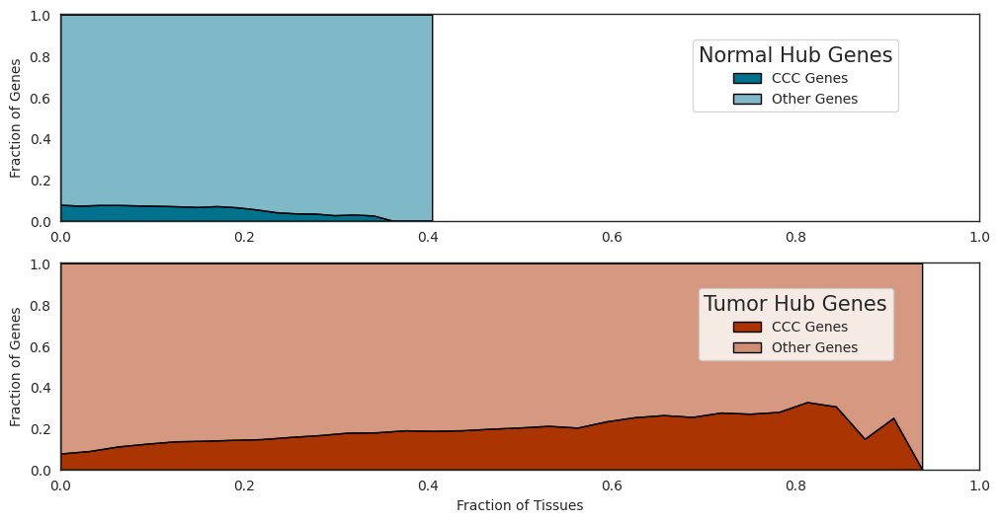

In [37]:
plot_only_one_node_analysis([2, 3], df, save_path='/home/lnemati/pathway_crosstalk/results/figures/hubs/hubs_panel_2_3.pdf')

In [40]:
name2id = pd.read_csv('/home/lnemati/resources/reactome/ReactomeIDs.tsv', sep='\t', header=None, index_col=0).to_dict()[1]
id2name = {v: k for k, v in name2id.items()}

roots = pd.read_csv('/home/lnemati/resources/reactome/ReactomeRootPathways.csv')

roots['root'] = roots.root.map(id2name)
roots['pathway'] = roots.pathway.map(id2name)

pw2root = roots.set_index('pathway')['root'].to_dict()

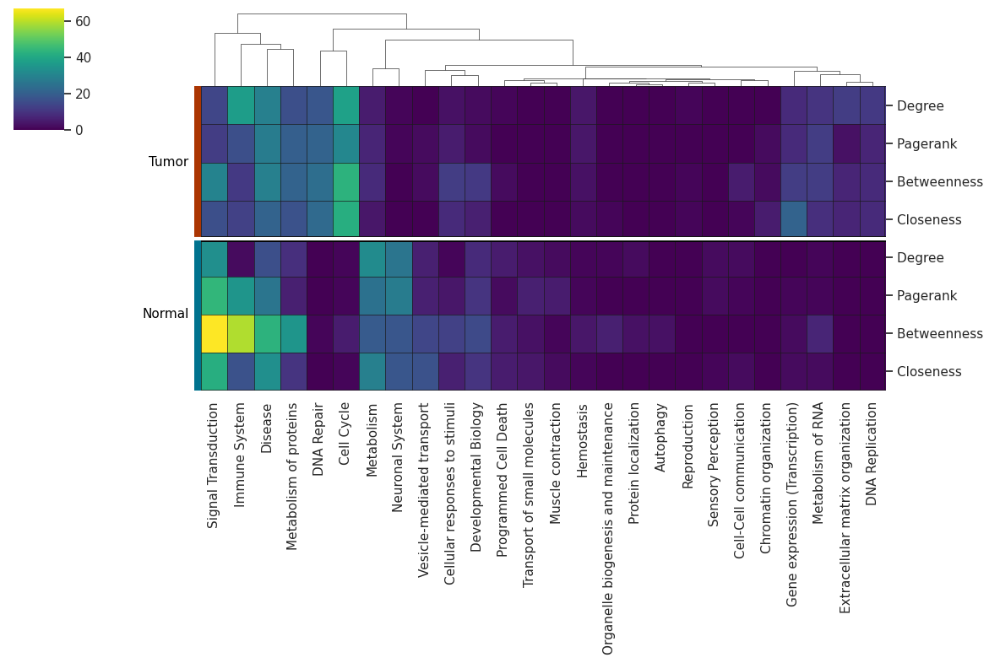

In [115]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

cmap='viridis'

# Assuming pw2root is already defined
path = '/home/lnemati/pathway_crosstalk/results/hubs/enrichment/reactome/all_hubs'

metrics = []
all_roots = set()
t_counts = {}
n_counts = {}

for directory in os.listdir(path):
    if directory == 'clustering_local':
        continue
    
    metric = directory
    metrics.append(metric)
    
    t_enr = os.path.join(path, metric, 'enrichment_tumor.csv')
    t_enr = pd.read_csv(t_enr)
    t_counts[metric] = t_enr.Term.map(pw2root).value_counts()
    
    n_enr = os.path.join(path, metric, 'enrichment_normal.csv')
    n_enr = pd.read_csv(n_enr)
    n_counts[metric] = n_enr.Term.map(pw2root).value_counts() 

    all_roots.update(t_counts[metric].index, n_counts[metric].index)
    
all_roots = list(all_roots)

# Make matrix with metrics as columns and roots as rows
# Each metric has a tumor and normal column
cols = [metric + '_tumor' for metric in metrics] + [metric + '_normal' for metric in metrics]
root_counts = pd.DataFrame(0, index=all_roots, columns=cols)

# Fill in matrix, leave 0 where no data
for metric in metrics:
    root_counts.loc[t_counts[metric].index, f'{metric}_tumor'] = t_counts[metric]
    root_counts.loc[n_counts[metric].index, f'{metric}_normal'] = n_counts[metric]

# Create a dictionary mapping of condition to color
condition_colors = {'tumor': tcolor, 'normal': ncolor}

# Create a list of conditions based on column names
conditions = ['tumor' if 'tumor' in col else 'normal' for col in root_counts.columns]

# Change _tumor and _normal to one or two spaces so that it can't be seen in the plot
root_counts.columns = [col.replace('_tumor', ' ').replace('_normal', '  ') for col in root_counts.columns]
# Capitalize
root_counts.columns = [col[0].upper() + col[1:] for col in root_counts.columns]

# Create a DataFrame for row_colors with the conditions
row_colors_df = pd.DataFrame(conditions, index=root_counts.columns, columns=[''])

# Map the conditions to their respective colors
row_colors = row_colors_df[''].map(condition_colors)

# Plot the clustermap with row colors
g = sns.clustermap(
    root_counts.T,
    cmap=cmap,
    #cbar_pos=(.9, .1, .05, .25),
    figsize=(12, 8),
    row_cluster=False,
    row_colors=row_colors,
    colors_ratio=1/(2*len(all_roots))
)

# Add the "Tumor" and "Normal" labels next to the row colors
# Find the middle of the rows corresponding to "tumor" and "normal" conditions
row_positions = [i for i, cond in enumerate(conditions) if cond == 'tumor']
tumor_mid = sum(row_positions) / len(row_positions) + 0.5
row_positions = [i for i, cond in enumerate(conditions) if cond == 'normal']
normal_mid = sum(row_positions) / len(row_positions) + 0.5

# Add text to the left of the row colors
g.ax_row_colors.text(-0.8, tumor_mid, 'Tumor', va='center', ha='right', fontsize=11, color='black')
g.ax_row_colors.text(-0.8, normal_mid, 'Normal', va='center', ha='right', fontsize=11, color='black')

# Adjust plot limits and spacing to fit the text
g.ax_row_colors.set_xlim(-1.5, 1)

# Add white line between Tumor and Normal
wide_lw = 5
separator = row_colors.value_counts().values[:-1]

g.ax_heatmap.hlines(separator, -1, g.ax_heatmap.get_xlim()[1], color='black', linewidth=wide_lw, zorder=10)

g.ax_heatmap.hlines(separator, -1, g.ax_heatmap.get_xlim()[1], color='white', linewidth=wide_lw-2, zorder=20)
g.ax_row_colors.hlines(separator, *g.ax_row_colors.get_xlim(), color='white', linewidth=wide_lw-2, zorder=20)

# Add black outline
separators1 = list(range(root_counts.shape[0]))
separators1 = separators1 + [max(separators1) + 0.95]
separators2 = list(range(root_counts.shape[1]))
separators2 = separators2 + [max(separators2) + 0.99]
g.ax_heatmap.vlines(separators1, *g.ax_heatmap.get_ylim(), color='k', linewidth=0.5, zorder=1)
g.ax_heatmap.hlines(separators2, *g.ax_heatmap.get_xlim(), color='k', linewidth=0.5, zorder=1)

plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/hubs/pw_heatmap.pdf', bbox_inches="tight")

plt.show()


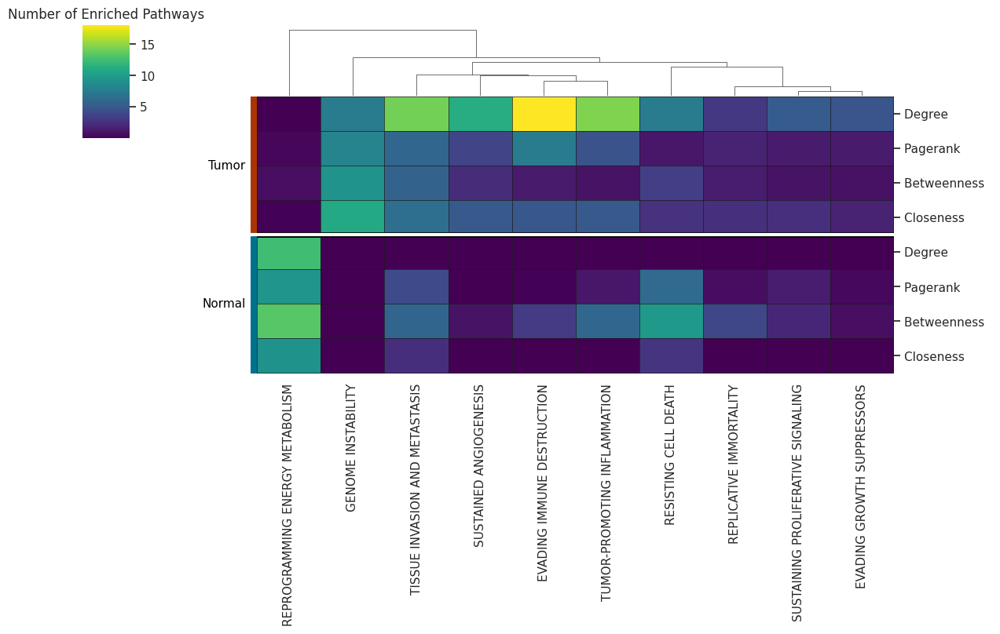

In [114]:
from matplotlib.colors import LinearSegmentedColormap

#cmap='RdBu'
#cmap = LinearSegmentedColormap.from_list("", [ncolor, 'white', tcolor])
cmap='viridis'

# Assuming pw2root is already defined
path = '/home/lnemati/pathway_crosstalk/results/hubs/enrichment/hallmarks/all_hubs'

metrics = []

t_vals = {}
n_vals = {}

all_hallmarks = set()

for directory in os.listdir(path):
    if directory == 'clustering_local':
        continue
    
    metric = directory
    metrics.append(metric)
    
    t_enr = os.path.join(path, metric, 'enrichment_tumor.csv')
    t_enr = pd.read_csv(t_enr).set_index('Term')
    #t_vals[metric] = np.log2(t_enr['Odds Ratio'])
    #t_vals[metric] = (t_enr['Odds Ratio'])
    t_vals[metric] = -np.log10(t_enr['Adjusted P-value'])

    
    n_enr = os.path.join(path, metric, 'enrichment_normal.csv')
    n_enr = pd.read_csv(n_enr).set_index('Term')
    #n_vals[metric] = np.log2(n_enr['Odds Ratio'])
    #n_vals[metric] = (n_enr['Odds Ratio'])
    n_vals[metric] = -np.log10(n_enr['Adjusted P-value'])

    
    all_hallmarks.update(t_vals[metric].index.union(n_vals[metric].index))
    
    
all_hallmarks = list(all_hallmarks)

# Make matrix with metrics as columns and roots as rows
# Each metric has a tumor and normal column
cols = [metric + '_tumor' for metric in metrics] + [metric + '_normal' for metric in metrics]
matrix = pd.DataFrame(0, index=all_hallmarks, columns=cols)

# Fill in matrix, leave 0 where no data
for metric in metrics:
    matrix.loc[t_vals[metric].index, f'{metric}_tumor'] = t_vals[metric]
    matrix.loc[n_vals[metric].index, f'{metric}_normal'] = n_vals[metric]

# Create a dictionary mapping of condition to color
condition_colors = {'tumor': tcolor, 'normal': ncolor}

# Create a list of conditions based on column names
conditions = ['tumor' if 'tumor' in col else 'normal' for col in matrix.columns]

# Change _tumor and _normal to one or two spaces so that it can't be seen in the plot
matrix.columns = [col.replace('_tumor', ' ').replace('_normal', '  ') for col in matrix.columns]
# Capitalize
matrix.columns = [col[0].upper() + col[1:] for col in matrix.columns]

# Create a DataFrame for row_colors with the conditions
row_colors_df = pd.DataFrame(conditions, index=matrix.columns, columns=[''])

# Map the conditions to their respective colors
row_colors = row_colors_df[''].map(condition_colors)

# Plot the clustermap with row colors
g = sns.clustermap(
    matrix.T,
    cmap=cmap,
    #cbar_pos=(.9, .1, .05, .25),
    figsize=(12, 8),
    row_cluster=False,
    row_colors=row_colors,
    colors_ratio=1/(2*len(all_roots)),
    #vmin=1,
    #vmax=-1
)


# Add the "Tumor" and "Normal" labels next to the row colors
# Find the middle of the rows corresponding to "tumor" and "normal" conditions
row_positions = [i for i, cond in enumerate(conditions) if cond == 'tumor']
tumor_mid = sum(row_positions) / len(row_positions) + 0.5
row_positions = [i for i, cond in enumerate(conditions) if cond == 'normal']
normal_mid = sum(row_positions) / len(row_positions) + 0.5

# Add text to the left of the row colors
g.ax_row_colors.text(-0.8, tumor_mid, 'Tumor', va='center', ha='right', fontsize=11, color='black')
g.ax_row_colors.text(-0.8, normal_mid, 'Normal', va='center', ha='right', fontsize=11, color='black')

# Adjust plot limits and spacing to fit the text
g.ax_row_colors.set_xlim(-1.5, 1)

# Add white line between Tumor and Normal
wide_lw = 5
separator = row_colors.value_counts().values[:-1]

g.ax_heatmap.hlines(separator, -1, g.ax_heatmap.get_xlim()[1], color='black', linewidth=wide_lw, zorder=10)

g.ax_heatmap.hlines(separator, -1, g.ax_heatmap.get_xlim()[1], color='white', linewidth=wide_lw-2, zorder=20)
g.ax_row_colors.hlines(separator, *g.ax_row_colors.get_xlim(), color='white', linewidth=wide_lw-2, zorder=20)

# Add black outline
separators1 = list(range(matrix.shape[0]))
separators1 = separators1 + [max(separators1) + 0.99]
separators2 = list(range(matrix.shape[1]))
separators2 = separators2 + [max(separators2) + 0.99]
g.ax_heatmap.vlines(separators1, *g.ax_heatmap.get_ylim(), color='k', linewidth=0.5, zorder=1)
g.ax_heatmap.hlines(separators2, *g.ax_heatmap.get_xlim(), color='k', linewidth=0.5, zorder=1)

plt.title('Number of Enriched Pathways')

plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/hubs/hallmarks_heatmap.pdf', bbox_inches="tight")

plt.show()


In [43]:
genes_scores = pd.read_csv('/home/lnemati/pathway_crosstalk/results/hubs/n_tissues_top_node_metrics.csv', index_col=0)

In [101]:
# Initialize an empty dictionary to hold odds ratios for each metric
odds_ratios_dict = {}

path = '/home/lnemati/pathway_crosstalk/results/hubs/enrichment/hallmarks/all_hubs'

for metric in metrics:

    # TUMOR
    tumor_genes = genes_scores[
        (genes_scores['f_{}'.format(metric) + '_tumor'] > genes_scores['f_{}'.format(metric) + '_normal'])
    ].index.tolist()

    t_enr = os.path.join(path, metric, 'enrichment_tumor.csv')
    t_enr = pd.read_csv(t_enr).set_index('Term')

    t_hub_hallmarks = t_enr.apply(lambda x: len(x['Genes'].split(';')), axis=1)
    t_hub_not_hallmarks = len(tumor_genes) - t_hub_hallmarks

    t_odds = t_hub_hallmarks / t_hub_not_hallmarks

    # NORMAL
    normal_genes = genes_scores[
        (genes_scores['f_{}'.format(metric) + '_tumor'] < genes_scores['f_{}'.format(metric) + '_normal'])
    ].index.tolist()

    n_enr = os.path.join(path, metric, 'enrichment_normal.csv')
    n_enr = pd.read_csv(n_enr).set_index('Term')

    n_hub_hallmarks = n_enr.apply(lambda x: len(x['Genes'].split(';')), axis=1)
    n_hub_not_hallmarks = len(normal_genes) - n_hub_hallmarks

    n_odds = n_hub_hallmarks / n_hub_not_hallmarks

    # Calculate odds ratio for each hallmark
    odds_ratio = t_odds / n_odds

    # Store odds ratios for each hallmark in a dictionary
    odds_ratios_dict[metric] = odds_ratio

# Convert the dictionary into a pandas DataFrame
odds_ratios_df = pd.DataFrame(odds_ratios_dict)
log_odds_ratios_df = np.log2(odds_ratios_df)
log_odds_ratios_df.index.name = None

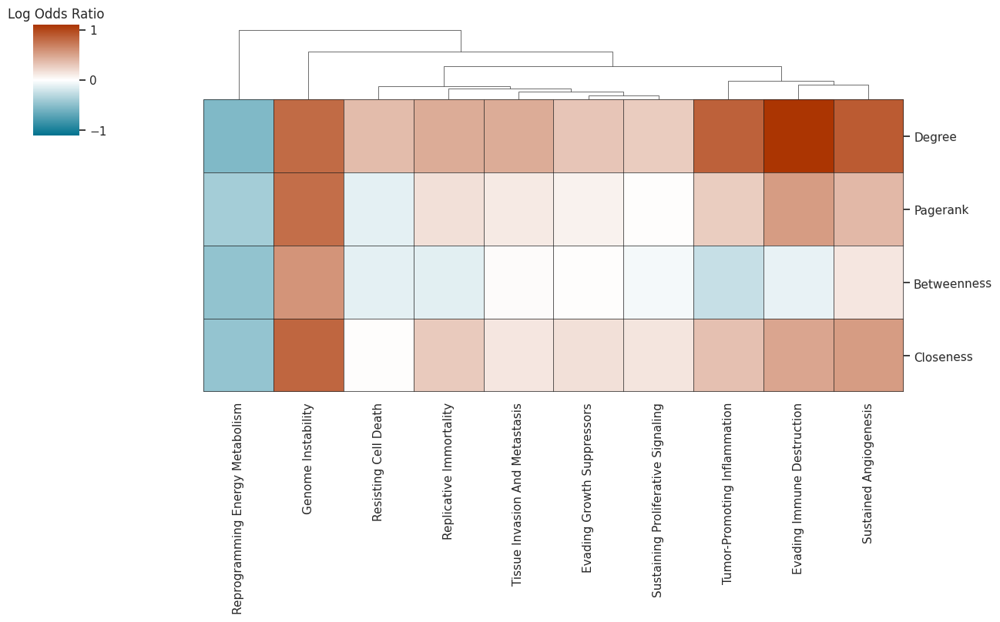

In [113]:
cmap = LinearSegmentedColormap.from_list("", [ncolor, 'white', tcolor])

matrix = log_odds_ratios_df.T
matrix.index.name = ' '

matrix.columns = [col.title() for col in matrix.columns]
matrix.index   = [idx.title() for idx in matrix.index  ]

g = sns.clustermap(
    matrix,
    cmap=cmap,
    #cbar_pos=(.0, .071, .05, .25),
    figsize=(12, 8),
    row_cluster=False,
    #col_cluster=False,
    #row_colors=row_colors,
    #colors_ratio=1/(2*len(all_roots)),
    vmin=-1.1,
    vmax=1.1
)

g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), rotation=1)  # Adjust the rotation as needed

# Add black outline
separators1 = list(range(matrix.shape[1]))
separators1 = separators1 + [max(separators1) + 0.99]
separators2 = list(range(matrix.shape[0]))
separators2 = separators2 + [max(separators2) + 0.99]
g.ax_heatmap.vlines(separators1, *g.ax_heatmap.get_ylim(), color='k', linewidth=0.5, zorder=1)
g.ax_heatmap.hlines(separators2, *g.ax_heatmap.get_xlim(), color='k', linewidth=0.5, zorder=1)

plt.title('Log Odds Ratio')

plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/hubs/hallmarks_odds_heatmap.pdf', bbox_inches="tight")

In [107]:
log_odds_ratios_df.min()

 
degree        -0.544209
pagerank      -0.387643
betweenness   -0.469140
closeness     -0.461736
dtype: float64

In [46]:
(odds_ratios_df['degree'] + odds_ratios_df['pagerank'] + odds_ratios_df['closeness'] + odds_ratios_df['betweenness']) / 4

Term
EVADING GROWTH SUPPRESSORS            1.108024
EVADING IMMUNE DESTRUCTION            1.484036
GENOME INSTABILITY                    1.687338
REPLICATIVE IMMORTALITY               1.155328
REPROGRAMMING ENERGY METABOLISM       0.724663
RESISTING CELL DEATH                  1.034069
SUSTAINED ANGIOGENESIS                1.428334
SUSTAINING PROLIFERATIVE SIGNALING    1.074166
TISSUE INVASION AND METASTASIS        1.140979
TUMOR-PROMOTING INFLAMMATION          1.281397
dtype: float64

In [20]:
def read_gmt(gmt_file):
    with open(gmt_file) as f:                                                                                                                                             
        lines = f.readlines()                                                                                                                                             
    gmt = {}                                                                                                                                                              
    for line in lines:                                                                                                                                                    
        line = line.strip().split('\t')                                                                                                                                   
        gmt[line[0]] = line[2:]
    return gmt

# Interactions enrichment

In [97]:
name2id = pd.read_csv('/home/lnemati/resources/reactome/ReactomeIDs.tsv', sep='\t', header=None, index_col=0).to_dict()[1]
id2name = {v: k for k, v in name2id.items()}

roots = pd.read_csv('/home/lnemati/resources/reactome/ReactomeRootPathways.csv')

roots['root'] = roots.root.map(id2name)
roots['pathway'] = roots.pathway.map(id2name)

pw2root = roots.set_index('pathway')['root'].to_dict()

In [98]:
tdf = pd.read_csv('/home/lnemati/pathway_crosstalk/results/interactions_network/mannwhitneyu/mannwhitneyu_min_tumor_enrichment.csv')

In [102]:
ndf = pd.read_csv('/home/lnemati/pathway_crosstalk/results/interactions_network/mannwhitneyu/mannwhitneyu_min_normal_enrichment.csv')

In [105]:
tdf[tdf.Term.map(pw2root) == 'Immune System']

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Genes
0,ReactomePathways.gmt,Adaptive Immune System,86/122,6.603215e-25,5.678765e-22,2.947073,LILRB4;CD1D;MRC1;COL17A1;VCAM1;ITGB1;HLA-G;COL...
2,ReactomePathways.gmt,"Antigen Presentation: Folding, assembly and pe...",7/8,7.066116e-04,1.146577e-02,3.237358,HLA-G;HLA-B;HLA-C;HLA-E;HLA-F;HLA-A;HSPA5
3,ReactomePathways.gmt,Antigen processing-Cross presentation,11/15,2.761000e-04,4.946792e-03,2.735613,HLA-G;HLA-B;HLA-C;HLA-E;TLR4;HLA-F;HLA-A;MRC1;...
8,ReactomePathways.gmt,C-type lectin receptors (CLRs),6/6,4.252707e-04,7.171231e-03,3.665111,IL1B;CCL17;ICAM2;CD209;ICAM3;CCL22
14,ReactomePathways.gmt,Class I MHC mediated antigen processing & pres...,12/16,9.874915e-05,2.022006e-03,2.798099,HLA-G;HLA-B;HLA-C;HLA-E;HLA-F;HLA-A;ITGAV;MRC1...
19,ReactomePathways.gmt,Costimulation by the CD28 family,20/23,3.355589e-09,4.122581e-07,3.269435,HLA-DRB5;CD4;CD80;PDCD1LG2;PDCD1;CTLA4;HLA-DRB...
20,ReactomePathways.gmt,Cytokine Signaling in Immune system,103/238,9.409072e-09,1.011475e-06,1.752213,PTAFR;IL2RG;IL22RA1;VCAM1;TNFRSF13C;ITGB1;CCL4...
23,ReactomePathways.gmt,Downstream TCR signaling,10/12,8.726281e-05,1.974895e-03,3.095830,HLA-DRB5;HLA-DQB1;HLA-DQA2;CD4;HLA-DQA1;HLA-DP...
25,ReactomePathways.gmt,Endosomal/Vacuolar pathway,6/7,2.281293e-03,2.837200e-02,3.174407,HLA-G;HLA-B;HLA-C;HLA-E;HLA-F;HLA-A
27,ReactomePathways.gmt,Generation of second messenger molecules,10/12,8.726281e-05,1.974895e-03,3.095830,HLA-DRB5;HLA-DQB1;HLA-DQA2;CD4;HLA-DQA1;HLA-DP...


In [104]:
ndf.Term.map(pw2root).value_counts()

Neuronal System                      23
Signal Transduction                  13
Developmental Biology                 2
Extracellular matrix organization     2
Disease                               1
Transport of small molecules          1
Name: Term, dtype: int64

# Compare

In [5]:
from scipy.stats import false_discovery_control
from scipy.stats import sem
from scipy import stats

In [6]:
df = pd.read_csv('/home/lnemati/pathway_crosstalk/results/compare_results.csv', index_col=0)
df = df.drop(columns=['avg_coev_tom_correlation'])

In [13]:
df[df['modularity'] < 0.3]['modularity'].sort_values()

name
testis                                   0.054892
colon_transverse                         0.206424
heart_left_ventricle                     0.239598
brain_cortex                             0.241315
brain_caudate_basal_ganglia              0.255689
kidney_cortex                            0.259091
brain_nucleus_accumbens_basal_ganglia    0.274479
rectum_adenocarcinoma                    0.278666
adrenocortical_cancer                    0.282483
lung_squamous_cell_carcinoma             0.297960
Name: modularity, dtype: float64

In [11]:
df['interactions_mannwhitneyu_p_adj'] = stats.false_discovery_control(df['interactions_mannwhitneyu_p'], method='bh')

In [12]:
auroc_a = df['interactions_auroc']
auroc_t = df.query('condition == "tumor"')['interactions_auroc']
auroc_n = df.query('condition == "normal"')['interactions_auroc']

print('AUROC')

print('All tissues:', auroc_a.mean(), '+/-', np.std(auroc_a))
print('Normal', auroc_n.mean(), '+/-', np.std(auroc_n))
print('Tumor', auroc_t.mean(), '+/-', np.std(auroc_t))

ua = df['interactions_mannwhitneyu_U']
ut = df.query('condition == "tumor"')['interactions_mannwhitneyu_U']
un = df.query('condition == "normal"')['interactions_mannwhitneyu_U']
#print()
#
#print('Mann-Whitney U')
#
#
#print('All tissues:', ua.mean(), '+/-', sem(ua))
#print('Normal', un.mean(), '+/-', sem(un))
#print('Tumor', ut.mean(), '+/-', sem(ut))

AUROC
All tissues: 0.6103896637308337 +/- 0.0368408026208443
Normal 0.5881180230039456 +/- 0.01957211204041014
Tumor 0.6431011360484509 +/- 0.03145614205515242


In [13]:
df['-log10_mannwhitneyu_p_adj'] = -np.log10(df['interactions_mannwhitneyu_p_adj'])

In [14]:
df.drop(columns='interactions_mannwhitneyu_p', inplace=True)
df.drop(columns='interactions_mannwhitneyu_p_adj', inplace=True)

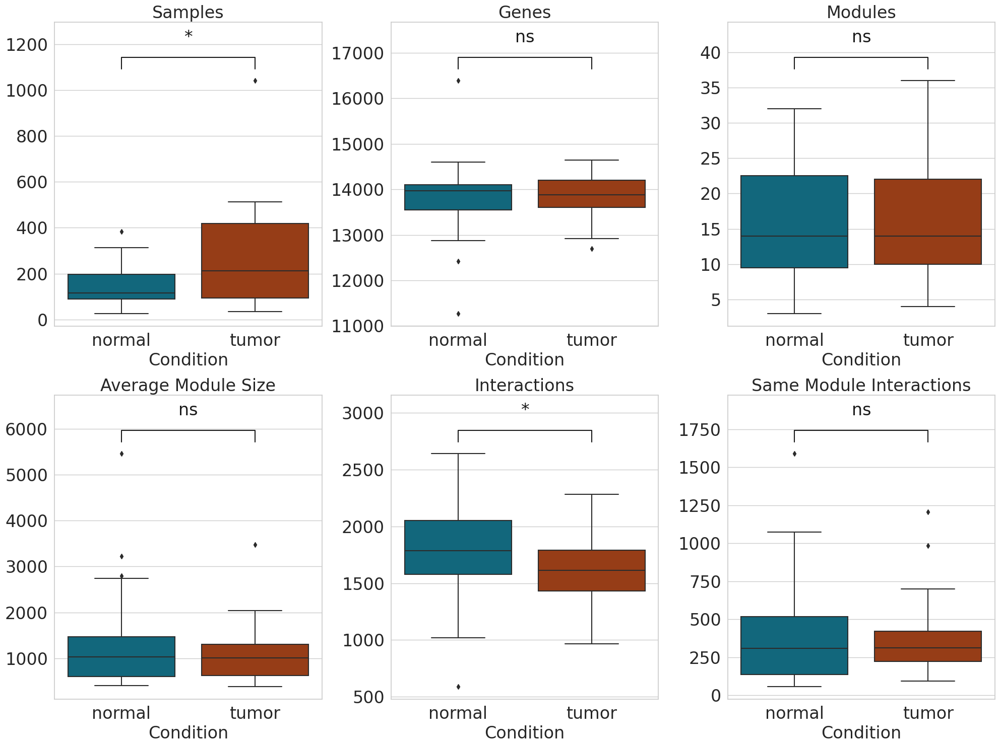

In [15]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests

# Title dictionary for subplots
title_dict = {
    'n_samples': 'Samples',
    'n_genes': 'Genes',
    'n_modules': 'Modules',
    'avg_module_size': 'Average Module Size',
    #'avg_degree': 'Average Degree',
    #'avg_intramodular_degree': 'Average Intramodular Degree',
    'tot_interactions': 'Interactions',
    'n_interactions_same_module': 'Same Module Interactions',
    #'interactions_auroc': 'AUROC',
    #'interactions_mannwhitneyu_U': 'Mann-Whitney $U$',
    #'-log10_mannwhitneyu_p_adj': 'Mann-Whitney $-log_{10}{p_{adj}}$',
}

# Set the style
sns.set(style="whitegrid")

# Define font size
fs = 24

# Function to perform Mann-Whitney U test and return p-value
def compute_p_value(data, column):
    """Compute p-value for Mann-Whitney U test."""
    normal_data = data[data['condition'] == 'normal'][column]
    tumor_data = data[data['condition'] == 'tumor'][column]
    _, p_value = mannwhitneyu(normal_data, tumor_data, alternative='two-sided')
    return p_value

# Function to add significance bars to the boxplot
def add_significance(ax, data, column, p_value):
    """ Adds significance bars to the given axes object based on p-value. """
    # Determine the significance level
    if p_value < 0.001:
        significance = '***'
    elif p_value < 0.01:
        significance = '**'
    elif p_value < 0.05:
        significance = '*'
    else:
        significance = 'ns'  # Not significant

    # Calculate maximum y-value and add space for significance bar
    normal_data = data[data['condition'] == 'normal'][column]
    tumor_data = data[data['condition'] == 'tumor'][column]
    y_max = max(normal_data.max(), tumor_data.max())
    y_min = min(normal_data.min(), tumor_data.min())
    y_offset = 0.2 * (y_max - y_min if y_max > y_min else 1)

    h = 0.05 * (y_max - y_min)  # Height of the significance bar
    y_bar_start = y_max + h
    y_bar_end = y_max + 2 * h

    x1, x2 = 0, 1
    col = 'k'

    # Plot the significance bar
    ax.plot([x1, x1, x2, x2], [y_bar_start, y_bar_end, y_bar_end, y_bar_start], lw=1.5, c=col)
    ax.text((x1 + x2) * 0.5, y_bar_end + h, significance, ha='center', va='bottom', color=col, fontsize=fs)

    # Update the y-axis limit to make space for the significance bar
    ax.set_ylim(top=y_bar_end + h * 3)  # Adding extra space to avoid overlap with titles

# Define columns to plot based on the title_dict
columns = list(title_dict.keys())

# Collect p-values for FDR correction
p_values = [compute_p_value(df, column) for column in columns]

# Apply FDR correction
#p_values = stats.false_discovery_control(p_values, method='bh')

# Create a dictionary of corrected p-values
p_value_dict = dict(zip(columns, p_values))

# Plot boxplots for each column
plt.figure(figsize=(20, 15))  # Adjusted figure size for better spacing

subplot_shape = (2,3)

# Plot the countplot for 'condition'
#plt.subplot(subplot_shape[0], subplot_shape[1], 1)
#sns.countplot(x='condition', data=df, palette=[ncolor, tcolor])
#plt.title('Tissues', fontsize=fs)
#plt.xlabel('Condition', fontsize=fs)
#plt.ylabel('', fontsize=fs)
#plt.xticks(fontsize=fs)
#plt.yticks(fontsize=fs)

# Plot boxplots for each column in the title_dict
for i, column in enumerate(columns):
    plt.subplot(subplot_shape[0], subplot_shape[1], i + 1)
    ax = sns.boxplot(x='condition', y=column, data=df, palette=[ncolor, tcolor])
    plt.title(title_dict[column], fontsize=fs)
    plt.xlabel('Condition', fontsize=fs)
    plt.ylabel('', fontsize=fs)
    plt.xticks(fontsize=fs)
    plt.yticks(fontsize=fs)

    # Add significance bars
    add_significance(ax, df, column, p_value_dict[column])

plt.tight_layout()

# Save the figure
plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/comparison/comparison_all.pdf')

# Show the plot
plt.show()


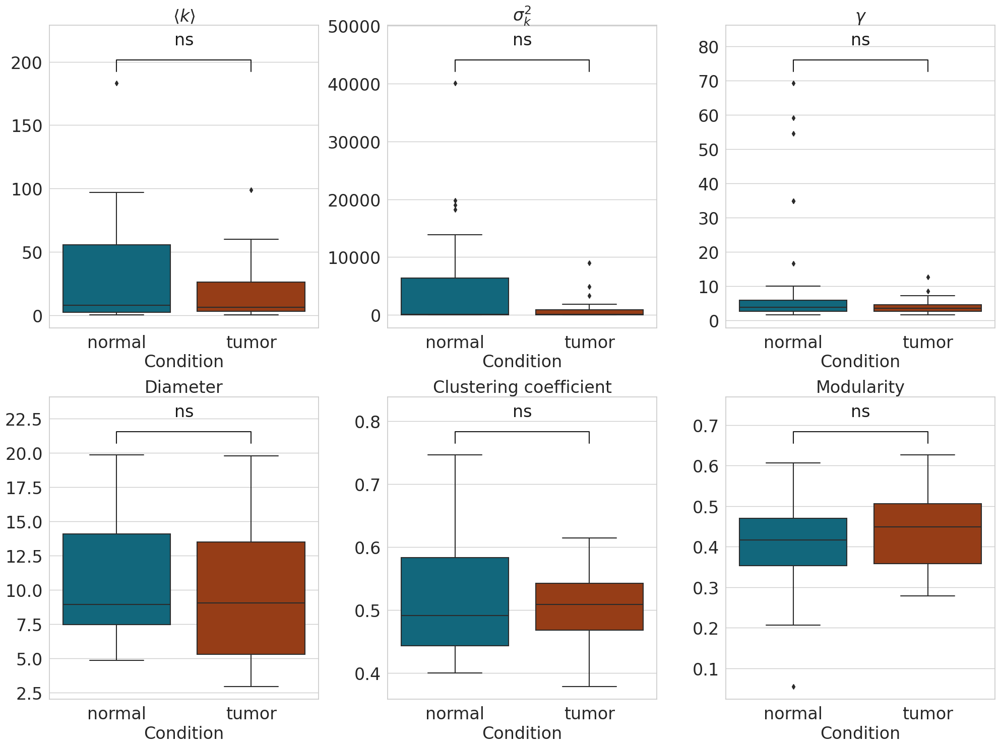

In [16]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests

# Title dictionary for subplots
# Title dictionary for subplots
title_dict = {
    'avg_degree': '$ \langle k \\rangle $',
    #'avg_intramodular_degree': 'avg_intramodular_degree',
    'var_degree': '$ \sigma^2_{k}$',
    #'var_intramodular_degree': 'variance_intramodular',
    'powerlaw_alpha': '$\gamma$',
    #'avg_shortest_path': 'avg_path_length',
    'diameter': 'Diameter',
    'clustering_global': 'Clustering coefficient',
    'modularity': 'Modularity',
    #'powerlaw_xmin': 'xmin',
    #'powerlaw_sigma': 'sigma'
}

# Set the style
sns.set(style="whitegrid")

# Define font size
fs = 24

# Function to perform Mann-Whitney U test and return p-value
def compute_p_value(data, column):
    """Compute p-value for Mann-Whitney U test."""
    normal_data = data[data['condition'] == 'normal'][column]
    tumor_data = data[data['condition'] == 'tumor'][column]
    _, p_value = mannwhitneyu(normal_data, tumor_data, alternative='two-sided')
    return p_value

# Function to add significance bars to the boxplot
def add_significance(ax, data, column, p_value):
    """ Adds significance bars to the given axes object based on p-value. """
    # Determine the significance level
    if p_value < 0.001:
        significance = '***'
    elif p_value < 0.01:
        significance = '**'
    elif p_value < 0.05:
        significance = '*'
    else:
        significance = 'ns'  # Not significant

    # Calculate maximum y-value and add space for significance bar
    normal_data = data[data['condition'] == 'normal'][column]
    tumor_data = data[data['condition'] == 'tumor'][column]
    y_max = max(normal_data.max(), tumor_data.max())
    y_min = min(normal_data.min(), tumor_data.min())
    y_offset = 0.2 * (y_max - y_min if y_max > y_min else 1)

    h = 0.05 * (y_max - y_min)  # Height of the significance bar
    y_bar_start = y_max + h
    y_bar_end = y_max + 2 * h

    x1, x2 = 0, 1
    col = 'k'

    # Plot the significance bar
    ax.plot([x1, x1, x2, x2], [y_bar_start, y_bar_end, y_bar_end, y_bar_start], lw=1.5, c=col)
    ax.text((x1 + x2) * 0.5, y_bar_end + h, significance, ha='center', va='bottom', color=col, fontsize=fs)

    # Update the y-axis limit to make space for the significance bar
    ax.set_ylim(top=y_bar_end + h * 3)  # Adding extra space to avoid overlap with titles

# Define columns to plot based on the title_dict
columns = list(title_dict.keys())

# Collect p-values for FDR correction
p_values = [compute_p_value(df, column) for column in columns]

# Apply FDR correction
#p_values = stats.false_discovery_control(p_values, method='bh')

# Create a dictionary of corrected p-values
p_value_dict = dict(zip(columns, p_values))

# Plot boxplots for each column
plt.figure(figsize=(20, 15))  # Adjusted figure size for better spacing

subplot_shape = (2,3)

# Plot boxplots for each column in the title_dict
for i, column in enumerate(columns):
    plt.subplot(subplot_shape[0], subplot_shape[1], i + 1)
    ax = sns.boxplot(x='condition', y=column, data=df, palette=[ncolor, tcolor])
    plt.title(title_dict[column], fontsize=fs)
    plt.xlabel('Condition', fontsize=fs)
    plt.ylabel('', fontsize=fs)
    plt.xticks(fontsize=fs)
    plt.yticks(fontsize=fs)

    # Add significance bars
    add_significance(ax, df, column, p_value_dict[column])

plt.tight_layout()

# Save the figure
plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/comparison/comparison_networks.pdf')

# Show the plot
plt.show()

In [17]:
len(df[df['modularity'] > 0.3]) / len(df)

0.8734177215189873

In [18]:
df[df['modularity'] < 0.25]

,condition,n_modules,n_genes,n_samples,sft_power,avg_module_size,tot_interactions,n_interactions_same_module,interactions_auroc,interactions_mannwhitneyu_U,...,var_degree,var_intramodular_degree,powerlaw_alpha,powerlaw_xmin,powerlaw_sigma,avg_path_length,diameter,clustering_global,modularity,-log10_mannwhitneyu_p_adj
name,,,,,,,,,,,,,,,,,,,,,
brain_cortex,normal,9,14412,98,7.0,1601.333333,2369,519,0.598586,1.289807e+11,...,13897.870597,12168.850341,2.267697,84.860901,0.020532,2.643195,8.595622,0.650040,0.241315,53.789909
colon_transverse,normal,5,13966,161,12.0,2793.200000,1726,455,0.590353,1.028753e+11,...,18238.639008,14256.663752,54.594200,625.201530,9.191330,4.220873,14.229232,0.746441,0.206424,39.354542
heart_left_ventricle,normal,4,12913,193,22.0,3228.250000,1277,670,0.566081,6.182073e+10,...,24.080463,21.125772,1.715822,0.990959,0.014314,4.962848,16.869120,0.545906,0.239598,16.206909
testis,normal,3,16389,157,18.0,5463.000000,2641,1590,0.550216,1.832422e+11,...,4716.125370,4717.203911,34.920287,394.780304,6.092263,5.322682,16.290385,0.740806,0.054892,17.603549


In [19]:
df[df['modularity'] > 0.3].condition.value_counts() / df.condition.value_counts()

normal    0.851064
tumor     0.906250
Name: condition, dtype: float64

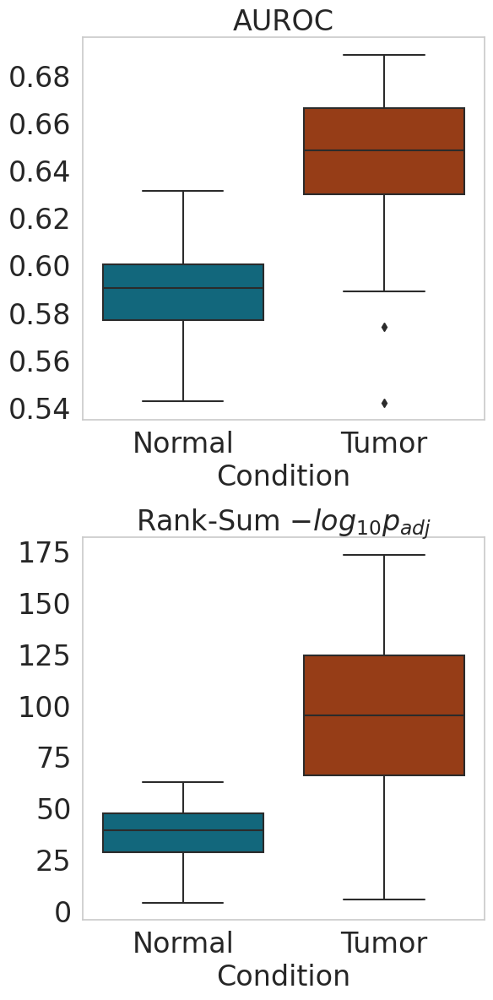

In [26]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style
sns.set_style("whitegrid", {'axes.grid': False})

# Define font size
fs = 24

# Plot boxplots for each column
plt.figure(figsize=(6, 12))  # Adjust the figure size to accommodate smaller vertical subplots

title_dict = {
    'interactions_auroc': 'AUROC',
    #'interactions_mannwhitneyu_U': 'Rank-Sum $U$',
    '-log10_mannwhitneyu_p_adj': 'Rank-Sum $-log_{10}{p_{adj}}$',
}

for i, column in enumerate(title_dict.keys()):
    plt.subplot(len(title_dict), 1, i + 1)  # Change the subplot to vertical arrangement
    sns.boxplot(x='condition', y=column, data=df.replace({'normal': 'Normal', 'tumor': 'Tumor'}), palette=[ncolor, tcolor])
    plt.title(title_dict[column], fontsize=fs)
    plt.xlabel('Condition', fontsize=fs)
    plt.ylabel('', fontsize=fs)
    plt.xticks(fontsize=fs)
    plt.yticks(fontsize=fs)

plt.tight_layout()

# Save the figure
plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/comparison/comparison_mannwhitneyu_auroc.pdf')

# Show the plot
plt.show()


In [14]:
# COEVOLUTION

from sklearn.metrics import roc_curve, roc_auc_score
from scipy.stats import mannwhitneyu
from itertools import combinations, product

# Function that generates and saves the ROC curve
def generate_roc_curve(
    data,
    target_col,
    feature_col,
    name=None,
):
    # ROC curve using all gene pairs
    fpr, tpr, _ = roc_curve(data[target_col], data[feature_col])
    auroc = roc_auc_score(data[target_col], data[feature_col])
    
    return fpr, tpr, auroc

def update_diff_complex(
    all_pairs,
    genes_series_a,
    genes_series_b
):
    for genes_a, genes_b in zip(genes_series_a, genes_series_b):
        for pair in product(genes_a, genes_b):
            gene_a, gene_b = pair
            if pair in all_pairs.index:
                all_pairs.loc[pair, "interaction"] = 1
            elif (gene_b, gene_a) in all_pairs.index:
                all_pairs.loc[(gene_b, gene_a), "interaction"] = 1
    return

print("Reading interactions.csv")
# read interactions.csv 
interactions = pd.read_csv('/projects/bioinformatics/DB/CellCellCommunication/WithEnzymes/cpdb_cellchat_enz.csv')
coev = pd.read_csv('/home/lnemati/resources/coevolution/jaccard_genes.csv.gz', index_col=0)

# Extract genes for complex A and B for each row
complex_a_genes = interactions.apply(lambda row: list(set([row[f'interactor{i}'] for i in range(1, row['num_interactors_a'] + 1) if pd.notna(row[f'interactor{i}'])])), axis=1)
complex_b_genes = interactions.apply(lambda row: list(set([row[f'interactor{i}'] for i in range(row['num_interactors_a'] + 1, row['num_interactors_a'] + row['num_interactors_b'] + 1) if pd.notna(row[f'interactor{i}'])])), axis=1)
interactions_all_genes = complex_a_genes + complex_b_genes

# make all_interacting_genes a list containing all unique genes in the interactions
all_interacting_genes = list(set().union(*interactions_all_genes))
print("Number of interacting genes: ", len(all_interacting_genes))

# ----- ROC all gene pairs -----

print("Generating ROC curves")

print("coev has shape: ", coev.shape)

# flatten TOM matrix, remove diagonal and duplicated values
print("Flattening coev matrix")
all_pairs = pd.DataFrame(
    coev.where(
        np.tri(
            coev.shape[0],
            dtype=bool,
            k=-1
        ),
        np.nan
    ).stack(dropna=True), columns=["coev"]
)
print("all_pairs has now shape: ", all_pairs.shape)

all_pairs['interaction'] = 0

update_diff_complex(all_pairs, complex_a_genes, complex_b_genes)

print("Total number of interacting pairs: ", all_pairs["interaction"].sum())

# Diff complex interactions
coev_fpr, coev_tpr, coev_auroc = generate_roc_curve(
    data=all_pairs,
    target_col="interaction",
    feature_col="coev",
    name='Coevoulution'
)

print('auroc:', auroc)

Reading interactions.csv
Number of interacting genes:  1576
Generating ROC curves
coev has shape:  (17756, 17756)
Flattening coev matrix
all_pairs has now shape:  (157628890, 1)
Total number of interacting pairs:  3467
auroc: 0.6639019087494823


In [17]:
coev_fpr, coev_tpr, coev_auroc = (fpr, tpr, auroc)

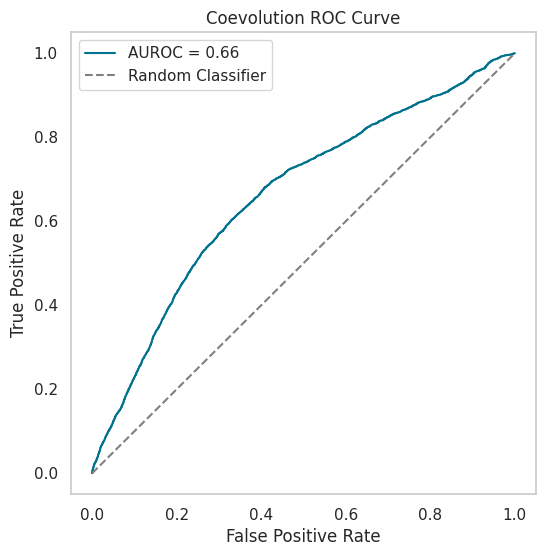

In [18]:
plt.figure(figsize=(6, 6))
plt.plot(coev_fpr, coev_tpr, label=f'AUROC = {coev_auroc:.2f}', color=ncolor)
plt.plot([0, 1], [0, 1], linestyle='--', label='Random Classifier', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Coevolution ROC Curve')
plt.legend(loc='upper left')
#plt.grid(True)
plt.show()


In [16]:
import numpy as np
from scipy.interpolate import interp1d

def interpolate_data(x_data, y_data, new_x):
    """
    Interpolate y_data to match new_x using linear interpolation.

    Parameters:
    x_data : array-like
        The original x data points.
    y_data : array-like
        The original y data points corresponding to x_data.
    new_x : array-like
        The new x data points for which we want to compute interpolated y values.

    Returns:
    new_x : array-like
        The input new_x values (unchanged).
    new_y : array-like
        The interpolated y values corresponding to new_x.
    """
    # Create an interpolation function
    interpolation_func = interp1d(x_data, y_data, kind='linear', fill_value="extrapolate")
    
    # Compute new_y by applying the interpolation function to new_x
    new_y = interpolation_func(new_x)
    
    return new_x, new_y


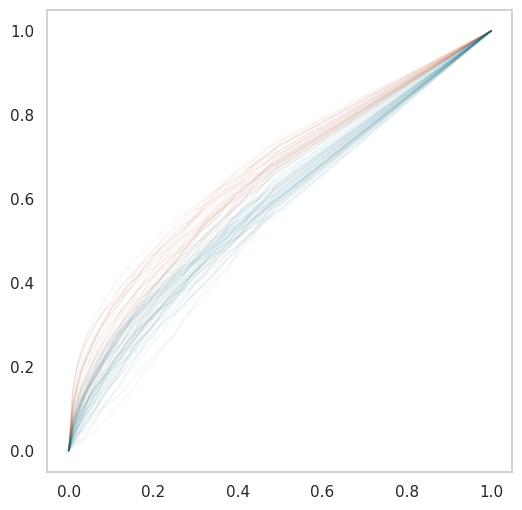

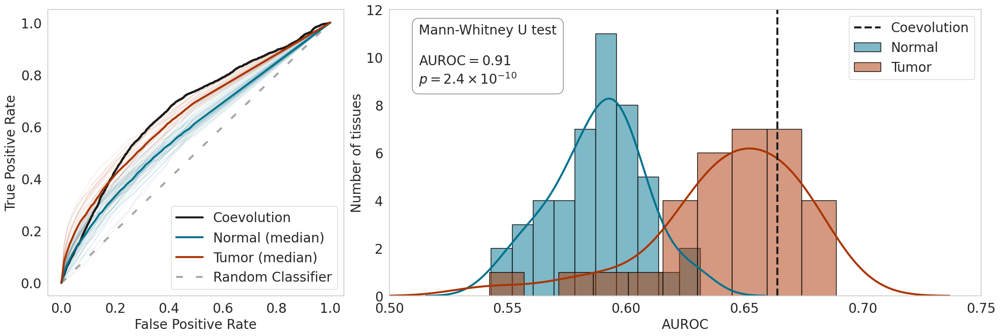

In [62]:
# Define font size
fs = 20

# Data Preparation for AUROC
col = 'interactions_auroc'
normal_data = df.loc[df.condition == 'normal', col]
tumor_data = df.loc[df.condition == 'tumor', col]

# Perform Mann-Whitney U test
u_statistic, mannwhitney_p_value = stats.mannwhitneyu(tumor_data, normal_data, alternative='greater')

# Create the figure
fig = plt.figure(layout="constrained", figsize=(21, 7))

axs = fig.subplot_mosaic(
    """
    ABB
    """
)

lw = 3
cut = 3
alpha=0.5
bins=10


# ----- PLOT A (ROC) ------

xx = np.linspace(0,1,100)

path = '/home/lnemati/pathway_crosstalk/results/roc/tumor'
t_yy = []

for tissue in os.listdir(path):
    fpr = np.load(os.path.join(path, tissue, 'fpr.npy'))
    tpr = np.load(os.path.join(path, tissue, 'tpr.npy'))
    
    xx, yy = interpolate_data(fpr, tpr, xx)
    axs['A'].plot(xx, yy, color=tcolor, linestyle='-', lw=1, alpha=0.1)
    
    t_yy.append(yy)
    
t_median = np.median(np.array(t_yy), axis=0)

path = '/home/lnemati/pathway_crosstalk/results/roc/normal'
n_yy = []

for tissue in os.listdir(path):
    fpr = np.load(os.path.join(path, tissue, 'fpr.npy'))
    tpr = np.load(os.path.join(path, tissue, 'tpr.npy'))
    
    xx, yy = interpolate_data(fpr, tpr, xx)
    axs['A'].plot(xx, yy, color=ncolor, linestyle='-', lw=1, alpha=0.1)
    
    n_yy.append(yy)
    
n_median = np.median(np.array(n_yy), axis=0)

axs['A'].plot(coev_fpr, coev_tpr, label=f'Coevolution', color='k', lw=lw)
axs['A'].plot(xx, n_median, color=ncolor, label=f'Normal (median)', lw=lw)
axs['A'].plot(xx, t_median, color=tcolor, label=f'Tumor (median)', lw=lw)
axs['A'].plot(xx, xx, color=graycolor2, label=f'Random Classifier', linestyle=(0, (3.33, 6.66)), lw=lw)

# ----- PLOT B (COMPARISON) ------

# Plot histograms for AUROC with outlines
sns.histplot(normal_data,
        bins=bins,
        kde=True,
        color=ncolor,
        edgecolor='black',
        label='Normal',
        alpha=alpha,
        kde_kws={'cut': cut},
        line_kws={'linewidth': lw, 'color': ncolor},
        ax=axs['B'])
sns.histplot(tumor_data,
        bins=bins,
        kde=True,
        color=tcolor,
        edgecolor='black',
        label='Tumor',
        alpha=alpha,
        kde_kws={'cut': cut},
        line_kws={'linewidth': lw, 'color': tcolor},
        ax=axs['B'])

axs['B'].vlines(x=auroc,ymin=0, ymax=100, colors='k', linestyles='--', label='Coevolution', lw=3)

axs['A'].set_xlabel('False Positive Rate', fontsize=fs)
axs['A'].set_ylabel('True Positive Rate', fontsize=fs)
axs['A'].legend(fontsize=fs)
axs['A'].tick_params(axis='both', labelsize=fs)

axs['B'].set_xlabel('AUROC', fontsize=fs)
axs['B'].set_ylabel('Number of tissues', fontsize=fs)
axs['B'].legend(fontsize=fs)
axs['B'].tick_params(axis='both', labelsize=fs)

# Add text box for Mann-Whitney U test results with transparency
u_str = str(int(u_statistic))
p_str = str(str(f"{mannwhitney_p_value:.1e}"))[:3] + '\\times 10^{' + str(mannwhitney_p_value).split('e')[-1] + '}'

auroc_t_vs_n = round(u_statistic / (tumor_data.shape[0] * normal_data.shape[0]), 2)

textstr = f"Mann-Whitney U test\n\nAUROC$={auroc_t_vs_n}$\n$p={p_str}$"
props = dict(boxstyle='round,pad=0.5', facecolor='white', edgecolor='black', alpha=0.5)
axs['B'].text(0.05, 0.95, textstr, transform=axs['B'].transAxes, fontsize=fs, verticalalignment='top', bbox=props)

axs['B'].set_xlim(0.5, 0.75)
axs['B'].set_ylim(0, 12)

#plt.tight_layout()

# Save the figure
plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/comparison/comparison_auroc_histogram.pdf', bbox_inches='tight')
plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/comparison/comparison_auroc_histogram.png', bbox_inches='tight')

# Show the plot
plt.show()


# Coevolution Violinplot

In [6]:
# Coevolution
coev = pd.read_csv('/home/lnemati/resources/coevolution/jaccard_genes.csv.gz', index_col=0)
# Tumor consensus
t_cons = pd.read_csv('/home/lnemati/pathway_crosstalk/results/consensus_modules/tumor/perc25/matrix.csv', index_col=0)
# Normal consensus
#n_cons =

In [7]:
coev = stack_triangle(coev, 'jaccard')
t_cons = stack_triangle(t_cons, 'adj')

In [8]:
from itertools import product

# read interactions.csv 
interactions = pd.read_csv('/projects/bioinformatics/DB/CellCellCommunication/WithEnzymes/cpdb_cellchat_enz.csv')
#coev = pd.read_csv('/home/lnemati/resources/coevolution/jaccard_genes.csv.gz', index_col=0)

# Extract genes for complex A and B for each row
complex_a_genes = interactions.apply(lambda row: list(set([row[f'interactor{i}'] for i in range(1, row['num_interactors_a'] + 1) if pd.notna(row[f'interactor{i}'])])), axis=1)
complex_b_genes = interactions.apply(lambda row: list(set([row[f'interactor{i}'] for i in range(row['num_interactors_a'] + 1, row['num_interactors_a'] + row['num_interactors_b'] + 1) if pd.notna(row[f'interactor{i}'])])), axis=1)
interactions_all_genes = complex_a_genes + complex_b_genes

# make all_interacting_genes a list containing all unique genes in the interactions
all_interacting_genes = list(set().union(*interactions_all_genes))

def update_diff_complex(
    coev,
    genes_series_a,
    genes_series_b
):
    coev["interaction"] = 'Other Gene Pairs'
    for genes_a, genes_b in zip(genes_series_a, genes_series_b):
        for pair in product(genes_a, genes_b):
            gene_a, gene_b = pair
            if pair in coev.index:
                coev.loc[pair, "interaction"] = 'CCC Gene Pairs'
            elif (gene_b, gene_a) in coev.index:
                coev.loc[(gene_b, gene_a), "interaction"] = 'CCC Gene Pairs'
    return

update_diff_complex(coev, complex_a_genes, complex_b_genes)
update_diff_complex(t_cons, complex_a_genes, complex_b_genes)

In [9]:
t_cons = t_cons[t_cons['adj'] > 0]

In [10]:
t_cons['log_adj'] = np.log10(t_cons['adj'])

In [ ]:

SUBSET = 20

fig, (ax1, ax2, ax3) = plt.subplots(3,1,figsize=(10, 10))

ax1.set_ylabel('')
ax2.set_ylabel('')
ax3.set_ylabel('')

sns.violinplot(
    data=t_cons[::SUBSET],
    x="interaction",
    y="adj",
    ax=ax2,
    order=['CCC Gene Pairs', 'Other Gene Pairs'],
    palette=[tcolor, '#C8CAD4']
)
ax2.set_ylabel('Co-expression Score ($-log_{10}(a_{ij}$)')

sns.violinplot(
    data=coev[::SUBSET],
    x="interaction",
    y="jaccard",
    ax=ax3,
    order=['CCC Gene Pairs', 'Other Gene Pairs'],
    palette=[orangecolor, '#C8CAD4']
)
ax3.set_ylabel('Co-evolution Score (Jaccard Index)')

#plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/comparison/violin_ccc_vs_others.pdf')

In [ ]:

# ----- ROC all gene pairs -----

print("Generating ROC curves")

print("coev has shape: ", coev.shape)

# flatten TOM matrix, remove diagonal and duplicated values
print("Flattening coev matrix")
all_pairs = pd.DataFrame(
    coev.where(
        np.tri(
            coev.shape[0],
            dtype=bool,
            k=-1
        ),
        np.nan
    ).stack(dropna=True), columns=["coev"]
)
print("all_pairs has now shape: ", all_pairs.shape)

all_pairs['interaction'] = 0

update_diff_complex(all_pairs, complex_a_genes, complex_b_genes)

print("Total number of interacting pairs: ", all_pairs["interaction"].sum())

# Diff complex interactions
coev_fpr, coev_tpr, coev_auroc = generate_roc_curve(
    data=all_pairs,
    target_col="interaction",
    feature_col="coev",
    name='Coevoulution'
)

# Interactions Network

In [76]:
network = pd.read_csv('/home/lnemati/pathway_crosstalk/results/interactions_network/interactions_network_filtered.csv')

In [77]:
network['normal_j'] = network['normal_intersection'] / network['normal_union']
network['tumor_j'] = network['tumor_intersection'] / network['tumor_union']

In [78]:
network['-tumor_intersection'] = -network['tumor_intersection']
network['-normal_intersection'] = -network['normal_intersection']

network['-tumor_j'] = -network['tumor_j']
network['-normal_j'] = -network['normal_j']

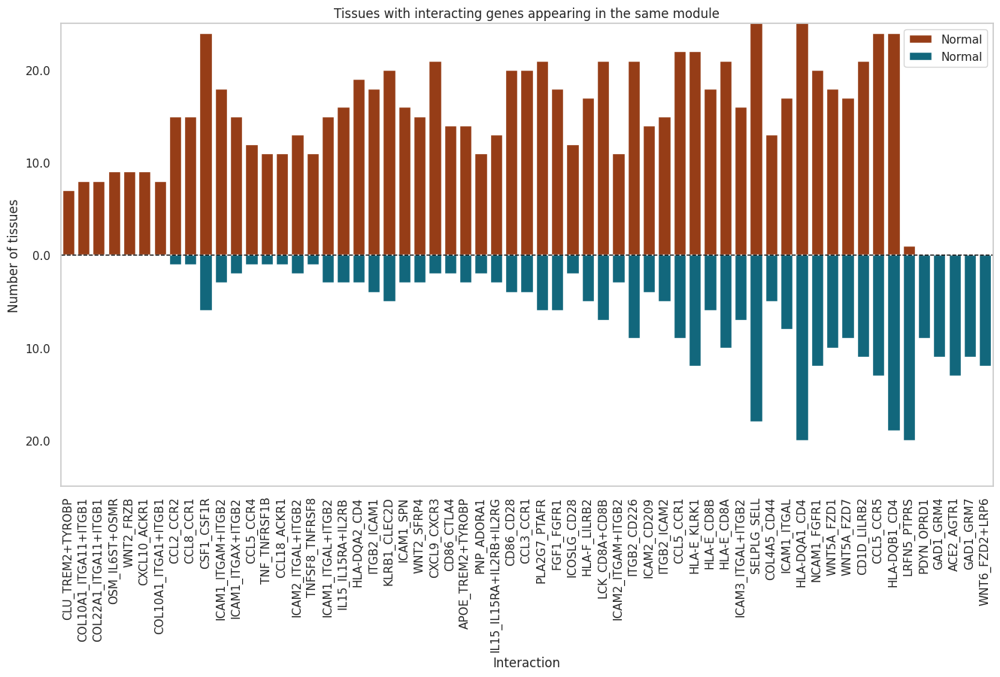

In [88]:
fig, ax = plt.subplots(1, 1, figsize=(16, 8))

sns.barplot(ax=ax, x='interaction', y='tumor_intersection', data=network, color=tcolor, alpha=1, label='Normal')
sns.barplot(ax=ax, x='interaction', y='-normal_intersection', data=network, color=ncolor, alpha=1, label='Normal')

ax.axhline(0, color='black', linewidth=1, linestyle='--')

# Adding labels and title for subplot 2
ax.set_xlabel('Interaction')
ax.set_ylabel('')
ax.set_title('Tissues with interacting genes appearing in the same module')
ax.set_ylim(-25, 25)
ax.set_ylabel('Number of tissues')
ax.legend()
ax.tick_params(axis='x', rotation=90)

# Change negative y-axis ticks to positive and display only the first decimal place
ax.set_yticklabels([f'{abs(x):.1f}' for x in ax.get_yticks()])

plt.show()

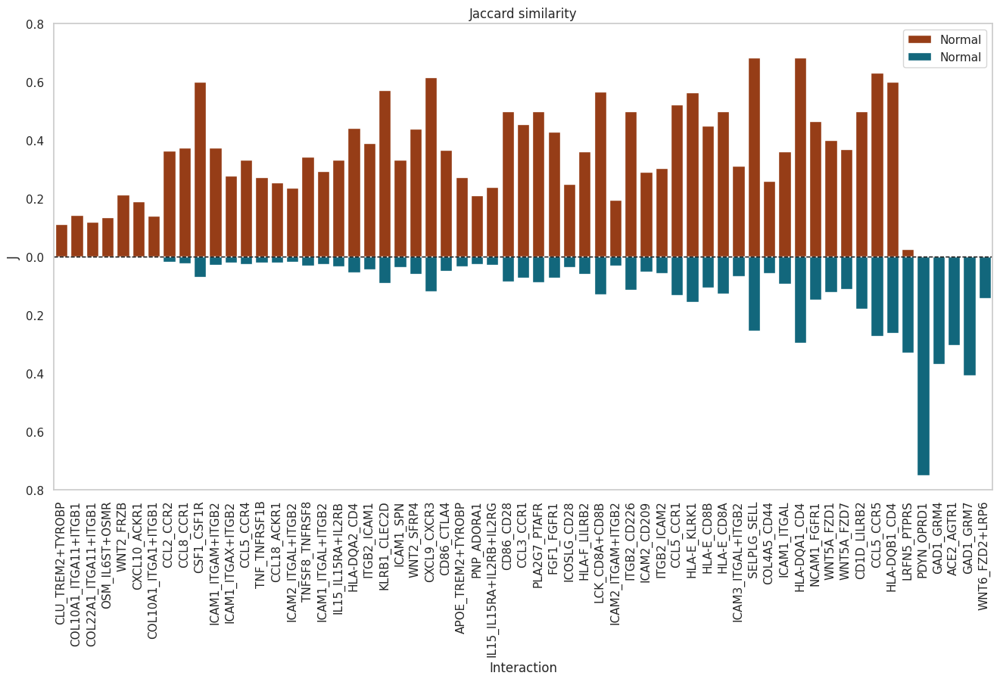

In [95]:
fig, ax = plt.subplots(1, 1, figsize=(16, 8))

sns.barplot(ax=ax, x='interaction', y='tumor_j', data=network, color=tcolor, alpha=1, label='Normal')
sns.barplot(ax=ax, x='interaction', y='-normal_j', data=network, color=ncolor, alpha=1, label='Normal')

ax.axhline(0, color='black', linewidth=1, linestyle='--')

# Adding labels and title for subplot 2
ax.set_xlabel('Interaction')
ax.set_ylabel('J')
ax.set_title('Jaccard similarity')
ax.set_ylim(-0.8, 0.8)
ax.legend()
ax.tick_params(axis='x', rotation=90)

# Change negative y-axis ticks to positive and display only the first decimal place
ax.set_yticklabels([f'{abs(x):.1f}' for x in ax.get_yticks()])

plt.show()

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharey=True)

# Plot for df1
sns.barplot(ax=axes[0], x='interaction', y='j_modules_tumor', data=df1, color='red', alpha=0.6, label='Tumor')
sns.barplot(ax=axes[0], x='interaction', y='j_modules_normal', data=df1, color='blue', alpha=0.6, label='Normal')

# Adding labels and title for subplot 1
axes[0].set_xlabel('Interaction')
axes[0].set_ylabel('Jaccard Similarity')
axes[0].set_title('Top Coexpressed in Tumor')
axes[0].set_ylim(-0.8, 0.8)
axes[0].legend()
axes[0].tick_params(axis='x', rotation=90)

# Plot for df2
sns.barplot(ax=axes[1], x='interaction', y='j_modules_tumor', data=df2, color='red', alpha=0.6, label='Tumor')
sns.barplot(ax=axes[1], x='interaction', y='j_modules_normal', data=df2, color='blue', alpha=0.6, label='Normal')

# Adding labels and title for subplot 2
axes[1].set_xlabel('Interaction')
axes[1].set_ylabel('')
axes[1].set_title('Top Coexpressed in Normal')
axes[1].set_ylim(-0.8, 0.8)
axes[1].legend()
axes[1].tick_params(axis='x', rotation=90)

# Remove padding between subplots
fig.subplots_adjust(wspace=0.0, hspace=0)

# Change negative y-axis ticks to positive and display only the first decimal place
for ax in axes:
    ax.set_yticklabels([f'{abs(x):.1f}' for x in ax.get_yticks()])

# Show plot
plt.show()


In [47]:
network.head()

,interaction,num_interactors_a,num_interactors_b,interactor1,interactor2,interactor3,interactor4,interactor5,interactor6,interactor7,log2_odds_ratio,pval,tumor_intersection,normal_intersection,tumor_union,normal_union,keep,pval_adj
0,CLU_TREM2+TYROBP,1,2,CLU,TREM2,TYROBP,NaN,NaN,NaN,NaN,inf,0.000965,7,0,62,100,1,0.036476
1,COL10A1_ITGA11+ITGB1,1,2,COL10A1,ITGA11,ITGB1,NaN,NaN,NaN,NaN,inf,0.000423,8,0,56,86,1,0.020792
2,COL22A1_ITGA11+ITGB1,1,2,COL22A1,ITGA11,ITGB1,NaN,NaN,NaN,NaN,inf,0.000454,8,0,66,101,1,0.021752
3,OSM_IL6ST+OSMR,1,2,OSM,IL6ST,OSMR,NaN,NaN,NaN,NaN,inf,0.000293,9,0,66,91,1,0.017331
4,WNT2_FRZB,1,1,WNT2,FRZB,NaN,NaN,NaN,NaN,NaN,inf,0.000258,9,0,42,57,1,0.015767


In [8]:
n = 30

df1 = network.head(n)
df2 = network.tail(n)
df1['modules_tumor'] = -df1['j_modules_tumor']
df2['j_modules_tumor'] = -df2['j_modules_tumor']

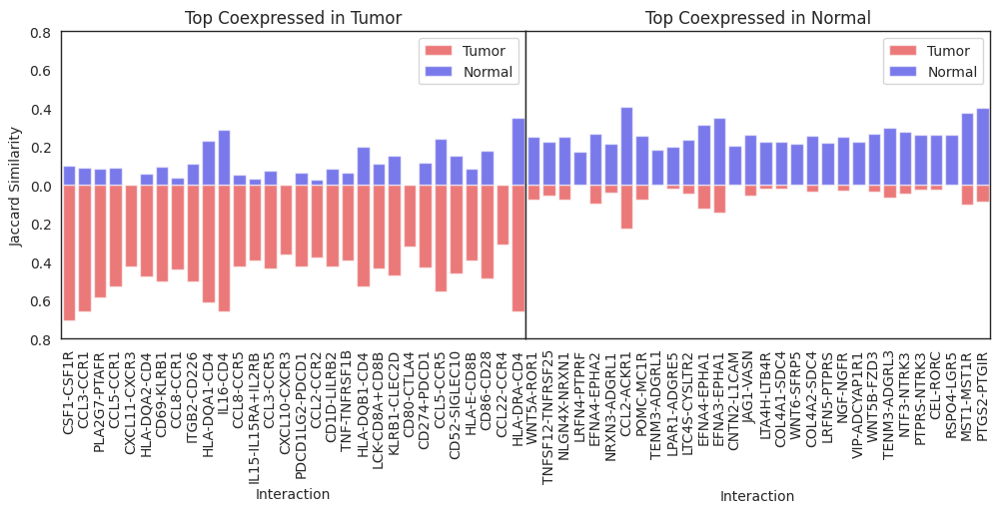

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharey=True)

# Plot for df1
sns.barplot(ax=axes[0], x='interaction', y='j_modules_tumor', data=df1, color='red', alpha=0.6, label='Tumor')
sns.barplot(ax=axes[0], x='interaction', y='j_modules_normal', data=df1, color='blue', alpha=0.6, label='Normal')

# Adding labels and title for subplot 1
axes[0].set_xlabel('Interaction')
axes[0].set_ylabel('Jaccard Similarity')
axes[0].set_title('Top Coexpressed in Tumor')
axes[0].set_ylim(-0.8, 0.8)
axes[0].legend()
axes[0].tick_params(axis='x', rotation=90)

# Plot for df2
sns.barplot(ax=axes[1], x='interaction', y='j_modules_tumor', data=df2, color='red', alpha=0.6, label='Tumor')
sns.barplot(ax=axes[1], x='interaction', y='j_modules_normal', data=df2, color='blue', alpha=0.6, label='Normal')

# Adding labels and title for subplot 2
axes[1].set_xlabel('Interaction')
axes[1].set_ylabel('')
axes[1].set_title('Top Coexpressed in Normal')
axes[1].set_ylim(-0.8, 0.8)
axes[1].legend()
axes[1].tick_params(axis='x', rotation=90)

# Remove padding between subplots
fig.subplots_adjust(wspace=0.0, hspace=0)

# Change negative y-axis ticks to positive and display only the first decimal place
for ax in axes:
    ax.set_yticklabels([f'{abs(x):.1f}' for x in ax.get_yticks()])

# Show plot
plt.show()


In [2]:
t_same = pd.read_csv('/home/lnemati/pathway_crosstalk/results/t_same_n_diff.csv')
n_same = pd.read_csv('/home/lnemati/pathway_crosstalk/results/n_same_t_diff.csv')

In [8]:
t = t_same.set_index('interaction')['total']
n = n_same.set_index('interaction')['total']

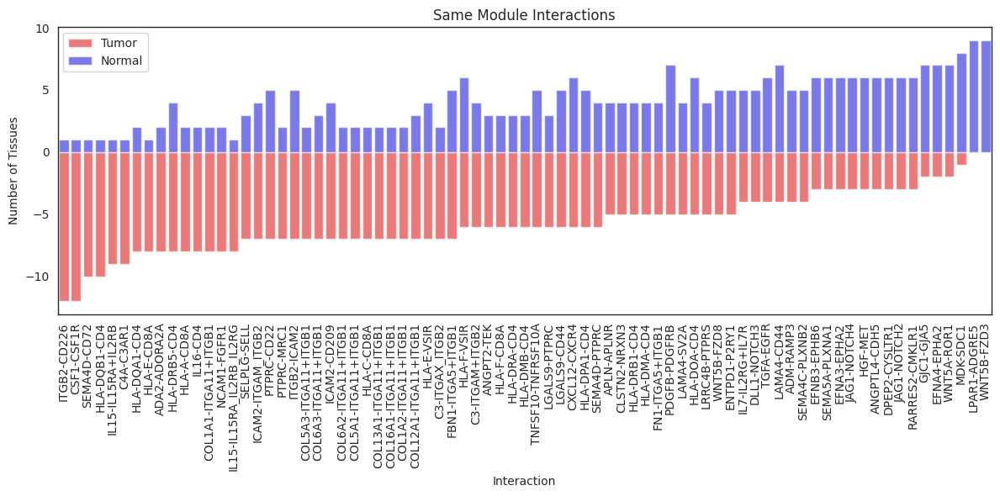

In [48]:
# Concatenate the series into a DataFrame
df = pd.concat([t, n], axis=1)
df.columns = ['t', 'n']

df['sum'] = df['t'] + df['n']
df = df[(df['sum'] >= 9)]
#df.sort_values(by=['sum', 't'], ascending=[False, False], inplace=True)
df.sort_values(by='t', ascending=False, inplace=True)
df['t'] = -df['t']

# Reset index to make 'interaction' a regular column
df.reset_index(inplace=True)

# Plotting parameters
plt.figure(figsize=(12, 6))

# Create the diverging bar plot using seaborn, with x and y switched
sns.barplot(x='interaction', y='t', data=df, color='red', alpha=0.6, label='Tumor')
sns.barplot(x='interaction', y='n', data=df, color='blue', alpha=0.6, label='Normal')

# Adding labels and title
plt.xlabel('Interaction')
plt.ylabel('Number of Tissues')
plt.title('Same Module Interactions')

# Adding legend
plt.legend()

# Rotate the labels on the x-axis
plt.xticks(rotation=90)

plt.tight_layout()

# Show plot
plt.show()


# Pathway Network

In [17]:
network = pd.read_csv('/home/lnemati/pathway_crosstalk/results/pathways_network/pathways_network_filtered.csv')
all_pathways = list(set(network['pathway1']).union(set(network['pathway2'])))

In [18]:
len(all_pathways)

169

In [19]:
network

,pathway1,pathway2,log2_odds_ratio,pval_adj,j_genesets,tumor_intersection,normal_intersection,tumor_union,normal_union
0,TNF receptor superfamily (TNFSF) members media...,Other semaphorin interactions,inf,0.005746,0.000000,15,0,28,13
1,TNFs bind their physiological receptors,TNF receptor superfamily (TNFSF) members media...,5.569856,0.000710,0.095238,19,1,23,11
2,RUNX1 and FOXP3 control the development of reg...,Interleukin receptor SHC signaling,4.321928,0.006920,0.057143,20,1,30,11
3,RUNX1 and FOXP3 control the development of reg...,Interleukin-15 signaling,3.797956,0.029849,0.000000,17,1,28,10
4,Interleukin-15 signaling,Interleukin receptor SHC signaling,3.767554,0.002717,0.242424,22,3,29,16
...,...,...,...,...,...,...,...,...,...
780,HSF1 activation,Defective B3GALT6 causes EDSP2 and SEMDJL1,-inf,0.006920,0.000000,0,9,15,18
781,HSF1 activation,Defective B3GAT3 causes JDSSDHD,-inf,0.006920,0.000000,0,9,15,18
782,Purinergic signaling in leishmaniasis infection,Attenuation phase,-inf,0.006870,0.018868,0,7,28,21
783,Signaling by FGFR2 IIIa TM,Cross-presentation of particulate exogenous an...,-inf,0.006752,0.000000,0,6,31,18


In [20]:
network.head()

,pathway1,pathway2,log2_odds_ratio,pval_adj,j_genesets,tumor_intersection,normal_intersection,tumor_union,normal_union
0,TNF receptor superfamily (TNFSF) members media...,Other semaphorin interactions,inf,0.005746,0.000000,15,0,28,13
1,TNFs bind their physiological receptors,TNF receptor superfamily (TNFSF) members media...,5.569856,0.000710,0.095238,19,1,23,11
2,RUNX1 and FOXP3 control the development of reg...,Interleukin receptor SHC signaling,4.321928,0.006920,0.057143,20,1,30,11
3,RUNX1 and FOXP3 control the development of reg...,Interleukin-15 signaling,3.797956,0.029849,0.000000,17,1,28,10
4,Interleukin-15 signaling,Interleukin receptor SHC signaling,3.767554,0.002717,0.242424,22,3,29,16


In [21]:
# Replace 'inf' values with the maximum value
max_value = network.log2_odds_ratio.replace([float('inf'), float('-inf')], float('nan')).max().max()
min_value = network.log2_odds_ratio.replace([float('inf'), float('-inf')], float('nan')).min().min()

network['log2_odds_ratio'] = network['log2_odds_ratio'].replace(float('inf'), max_value)
network['log2_odds_ratio'] = network['log2_odds_ratio'].replace(float('-inf'), min_value)

In [22]:
network.to_csv('/home/lnemati/pathway_crosstalk/results/pathways_network/pathways_network_no_inf.csv')

In [23]:
roots = pd.read_csv('/home/lnemati/resources/reactome/ReactomeRootPathways.csv')
roots.set_index('pathway', inplace=True)

In [24]:
# Get id-name mapping
ids = pd.read_csv('/home/lnemati/resources/reactome/ReactomeIDs.tsv', sep='\t', names=['name', 'id'])
ids2names = ids.set_index('id')
names2ids = ids.set_index('name')

In [25]:
# Subset
ids = names2ids.loc[all_pathways, 'id'].values
roots = roots.loc[ids]

In [26]:
names = ids2names.loc[roots['root']].name
roots['root'] = names.values

In [27]:
names = ids2names.loc[roots.index].name
roots.index = names.values

In [28]:
roots.loc[network.pathway1]['root']

TNF receptor superfamily (TNFSF) members mediating non-canonical NF-kB pathway                        Immune System
TNFs bind their physiological receptors                                                               Immune System
RUNX1 and FOXP3 control the development of regulatory T lymphocytes (Tregs)         Gene expression (Transcription)
RUNX1 and FOXP3 control the development of regulatory T lymphocytes (Tregs)         Gene expression (Transcription)
Interleukin-15 signaling                                                                              Immune System
                                                                                                ...                
HSF1 activation                                                                       Cellular responses to stimuli
HSF1 activation                                                                       Cellular responses to stimuli
Purinergic signaling in leishmaniasis infection                         

In [29]:
roots.root.value_counts()

Immune System                           35
Disease                                 30
Signal Transduction                     24
Developmental Biology                   15
Metabolism of proteins                  15
Extracellular matrix organization       10
Metabolism                               8
Neuronal System                          7
Gene expression (Transcription)          7
Hemostasis                               7
Vesicle-mediated transport               7
Cellular responses to stimuli            4
Organelle biogenesis and maintenance     1
Cell-Cell communication                  1
Circadian Clock                          1
Muscle contraction                       1
Name: root, dtype: int64

In [30]:
multiple_roots = roots.index.value_counts()[roots.index.value_counts() > 1].index
roots.loc[multiple_roots, 'root'] = 'Multiple root pathways'

In [31]:
roots.loc[network.pathway1]['root'].values.shape

(788,)

In [32]:
for idx, row in network.iterrows():
    if roots.loc[row.pathway1].shape[0] == 1:
        network.at[idx, 'root1'] = roots.loc[row.pathway1]['root']
    else:
        network.at[idx, 'root1'] = 'Multiple roots'
        
    if roots.loc[row.pathway2].shape[0] == 1:
        network.at[idx, 'root2'] = roots.loc[row.pathway2]['root']
    else:
        network.at[idx, 'root2'] = 'Multiple roots'

network.to_csv('/home/lnemati/pathway_crosstalk/results/pathways_network/pathways_network_no_inf.csv', index=False)

In [33]:
roots.index.name = 'pathway'
network.to_csv('/home/lnemati/pathway_crosstalk/results/pathways_network/pathways_network_no_inf.csv', index=False)

In [34]:
roots = roots.reset_index().drop_duplicates().set_index('pathway')
roots.to_csv('/home/lnemati/pathway_crosstalk/results/pathways_network/pathways_roots.csv')

In [35]:
network['root2'].unique()

array(['Developmental Biology', 'Immune System', 'Signal Transduction',
       'Extracellular matrix organization', 'Metabolism of proteins',
       'Hemostasis', 'Disease', 'Metabolism',
       'Gene expression (Transcription)', 'Circadian Clock',
       'Multiple roots', 'Cellular responses to stimuli',
       'Vesicle-mediated transport', 'Neuronal System',
       'Organelle biogenesis and maintenance'], dtype=object)

<Axes: >

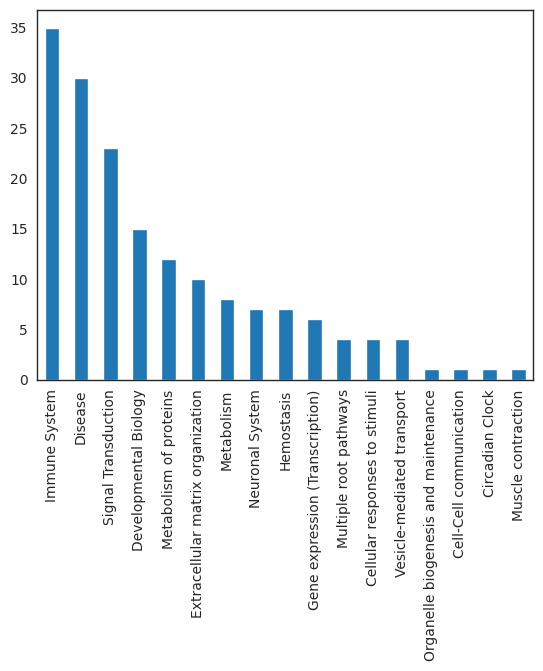

In [36]:
roots['root'].value_counts().plot(kind='bar')

In [37]:
roots['root'].value_counts().sum()

169

In [38]:
subset = roots[roots['root'] == 'Neuronal System']
subset

,root
pathway,
Assembly and cell surface presentation of NMDA receptors,Neuronal System
Negative regulation of NMDA receptor-mediated neuronal transmission,Neuronal System
Dopamine Neurotransmitter Release Cycle,Neuronal System
Long-term potentiation,Neuronal System
Neurexins and neuroligins,Neuronal System
"Unblocking of NMDA receptors, glutamate binding and activation",Neuronal System
Acetylcholine Neurotransmitter Release Cycle,Neuronal System


In [39]:
roots.loc['COPII-mediated vesicle transport']

root    Multiple root pathways
Name: COPII-mediated vesicle transport, dtype: object

In [40]:
roots.loc['Generation of second messenger molecules']

root    Immune System
Name: Generation of second messenger molecules, dtype: object

In [41]:
pw = 'Molecules associated with elastic fibres'
network[(network.pathway1 == pw) | (network.pathway2 == pw)]

,pathway1,pathway2,log2_odds_ratio,pval_adj,j_genesets,tumor_intersection,normal_intersection,tumor_union,normal_union,root1,root2
26,Molecules associated with elastic fibres,GPVI-mediated activation cascade,-2.104337,3.338581e-02,0.000000,10,11,53,22,Extracellular matrix organization,Hemostasis
83,Molecules associated with elastic fibres,Interleukin-4 and Interleukin-13 signaling,-2.513728,3.989666e-03,0.020548,16,17,59,25,Extracellular matrix organization,Immune System
84,Regulation of Complement cascade,Molecules associated with elastic fibres,-2.515174,6.481228e-03,0.006098,12,14,61,24,Immune System,Extracellular matrix organization
93,MyD88 deficiency (TLR2/4),Molecules associated with elastic fibres,-2.584963,7.819658e-03,0.000000,8,12,52,23,Disease,Extracellular matrix organization
96,Molecules associated with elastic fibres,Immunoregulatory interactions between a Lympho...,-2.612443,3.975008e-03,0.003861,13,15,66,25,Extracellular matrix organization,Immune System
144,Molecules associated with elastic fibres,Cross-presentation of particulate exogenous an...,-2.893085,5.132524e-03,0.046512,7,12,46,21,Extracellular matrix organization,Immune System
167,RAC1 GTPase cycle,Molecules associated with elastic fibres,-3.004446,1.550336e-03,0.004545,9,13,59,22,Signal Transduction,Extracellular matrix organization
178,Other interleukin signaling,Molecules associated with elastic fibres,-3.104337,3.323185e-02,0.000000,2,6,45,21,Immune System,Extracellular matrix organization
197,Neutrophil degranulation,Molecules associated with elastic fibres,-3.228624,1.961075e-04,0.001946,11,16,69,25,Immune System,Extracellular matrix organization
202,Molecules associated with elastic fibres,IRAK4 deficiency (TLR2/4),-3.232661,1.435879e-03,0.000000,6,12,53,22,Extracellular matrix organization,Disease


In [42]:
pw = 'TNF receptor superfamily (TNFSF) members mediating non-canonical NF-kB pathway'
network[(network.pathway1 == pw) | (network.pathway2 == pw)]

,pathway1,pathway2,log2_odds_ratio,pval_adj,j_genesets,tumor_intersection,normal_intersection,tumor_union,normal_union,root1,root2
0,TNF receptor superfamily (TNFSF) members media...,Other semaphorin interactions,5.569856,0.005746,0.000000,15,0,28,13,Immune System,Developmental Biology
1,TNFs bind their physiological receptors,TNF receptor superfamily (TNFSF) members media...,5.569856,0.000710,0.095238,19,1,23,11,Immune System,Immune System


In [43]:
pw = 'Other semaphorin interactions'
network[(network.pathway1 == pw) | (network.pathway2 == pw)]

,pathway1,pathway2,log2_odds_ratio,pval_adj,j_genesets,tumor_intersection,normal_intersection,tumor_union,normal_union,root1,root2
0,TNF receptor superfamily (TNFSF) members media...,Other semaphorin interactions,5.569856,0.005746,0.000000,15,0,28,13,Immune System,Developmental Biology
45,Other semaphorin interactions,Collagen chain trimerization,-2.263034,0.048000,0.000000,7,7,55,17,Developmental Biology,Extracellular matrix organization
303,Regulation of expression of SLITs and ROBOs,Other semaphorin interactions,-3.967820,0.003141,0.000000,2,7,78,24,Developmental Biology,Developmental Biology
304,Other semaphorin interactions,Cargo concentration in the ER,-3.974005,0.036986,0.000000,1,5,23,12,Developmental Biology,Multiple roots
329,Other semaphorin interactions,Neurophilin interactions with VEGF and VEGFR,-4.129283,0.014875,0.000000,2,5,30,9,Developmental Biology,Signal Transduction
358,Other semaphorin interactions,Modulation by Mtb of host immune system,-4.380822,0.019859,0.000000,1,5,26,11,Developmental Biology,Disease
379,RHO GTPases Activate Formins,Other semaphorin interactions,-4.515700,0.002158,0.006369,2,6,63,14,Signal Transduction,Developmental Biology
506,Other semaphorin interactions,Attenuation phase,-8.240314,0.011708,0.000000,0,6,24,17,Developmental Biology,Cellular responses to stimuli
567,Other semaphorin interactions,COPII-mediated vesicle transport,-8.240314,0.022860,0.000000,0,6,23,20,Developmental Biology,Multiple roots
715,Other semaphorin interactions,HSF1 activation,-8.240314,0.008341,0.000000,0,6,25,16,Developmental Biology,Cellular responses to stimuli


In [44]:
edgelist = network[['pathway1', 'pathway2', 'log2_odds_ratio']]
edgelist

,pathway1,pathway2,log2_odds_ratio
0,TNF receptor superfamily (TNFSF) members media...,Other semaphorin interactions,5.569856
1,TNFs bind their physiological receptors,TNF receptor superfamily (TNFSF) members media...,5.569856
2,RUNX1 and FOXP3 control the development of reg...,Interleukin receptor SHC signaling,4.321928
3,RUNX1 and FOXP3 control the development of reg...,Interleukin-15 signaling,3.797956
4,Interleukin-15 signaling,Interleukin receptor SHC signaling,3.767554
...,...,...,...
780,HSF1 activation,Defective B3GALT6 causes EDSP2 and SEMDJL1,-8.240314
781,HSF1 activation,Defective B3GAT3 causes JDSSDHD,-8.240314
782,Purinergic signaling in leishmaniasis infection,Attenuation phase,-8.240314
783,Signaling by FGFR2 IIIa TM,Cross-presentation of particulate exogenous an...,-8.240314


In [45]:
# Gather all unique pathway names
all_pathways = list(set(edgelist['pathway1']).union(set(edgelist['pathway2'])))

# Create an empty DataFrame with pathways as both index and columns
adjacency_matrix = pd.DataFrame(0, index=all_pathways, columns=all_pathways)

# Iterate over each row in the DataFrame and update the adjacency matrix
for index, row in edgelist.iterrows():
    pathway1 = row['pathway1']
    pathway2 = row['pathway2']
    log2_odds_ratio = row['log2_odds_ratio']
    
    adjacency_matrix.loc[pathway1, pathway2] = log2_odds_ratio
    adjacency_matrix.loc[pathway2, pathway1] = log2_odds_ratio  # Assuming the graph is undirected
    
# Replace 'inf' values with 10 times the maximum value
max_value = adjacency_matrix.replace([float('inf'), float('-inf')], float('nan')).max().max()
adjacency_matrix = adjacency_matrix.replace(float('inf'), max_value)

# Replace '-inf' values with 10 times the minimum value
min_value = adjacency_matrix.replace([float('inf'), float('-inf')], float('nan')).min().min()
adjacency_matrix = adjacency_matrix.replace(float('-inf'), min_value)

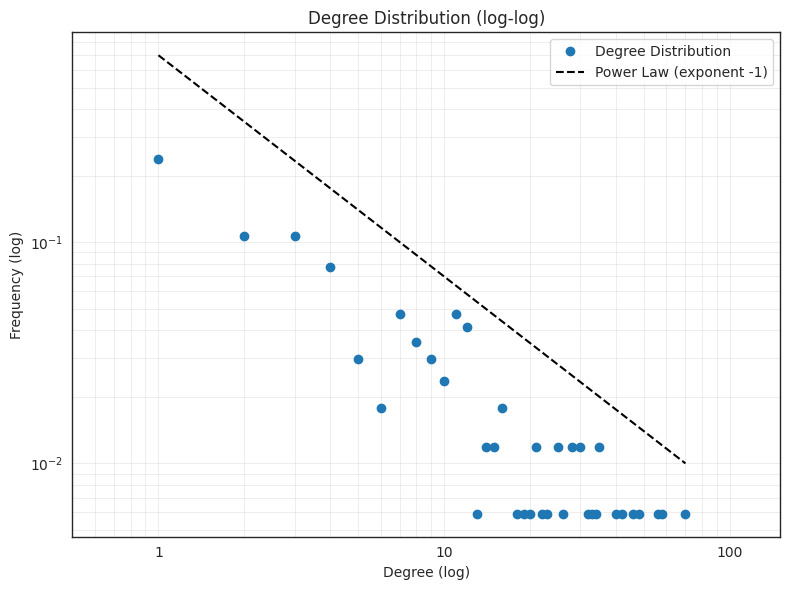

In [47]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter

# Assuming you already have the adjacency matrix stored in 'adjacency_matrix'

# Calculate the degrees
degrees = np.abs(adjacency_matrix != 0).sum(axis=1)

degree_counts = (degrees.value_counts() / adjacency_matrix.shape[0]).values
degree_idx = degrees.value_counts().index

# Plot on log-log scale
plt.figure(figsize=(8, 6))
plt.plot(degree_idx, degree_counts, linestyle=' ', marker='o', label='Degree Distribution')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Degree (log)')
plt.ylabel('Frequency (log)')
plt.xlim(0.5, 150)
plt.grid(which='both', linestyle='-', linewidth=0.5, alpha=0.5)
plt.gca().xaxis.set_major_formatter(ScalarFormatter())
plt.title('Degree Distribution (log-log)')

# Add a line for the theoretical power law with exponent -1
x_values = np.linspace(min(degree_idx), max(degree_idx), 100)
y_values = 0.7 * x_values ** (-1)  # Adjust the constant for visualization
plt.plot(x_values, y_values, color='k', linestyle='--', label='Power Law (exponent -1)')

plt.legend()
plt.tight_layout()

# Save the plot
plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/pathways_network/degree_distribution.pdf')

plt.show()


In [50]:
degrees.sort_values(ascending=False)

Neutrophil degranulation                                                    70
Immunoregulatory interactions between a Lymphoid and a non-Lymphoid cell    58
Interleukin-4 and Interleukin-13 signaling                                  56
ECM proteoglycans                                                           48
Integrin cell surface interactions                                          46
                                                                            ..
CD28 dependent Vav1 pathway                                                  1
Adrenaline,noradrenaline inhibits insulin secretion                          1
E3 ubiquitin ligases ubiquitinate target proteins                            1
Negative regulation of NMDA receptor-mediated neuronal transmission          1
TNFs bind their physiological receptors                                      1
Length: 169, dtype: int64

In [48]:
degree_idx

Int64Index([ 1,  3,  2,  4,  7, 11, 12,  8,  5,  9, 10,  6, 16, 15, 35, 28, 30,
            14, 25, 21, 26, 22, 18, 58, 56, 33, 46, 19, 34, 70, 42, 20, 40, 32,
            48, 13, 23],
           dtype='int64')

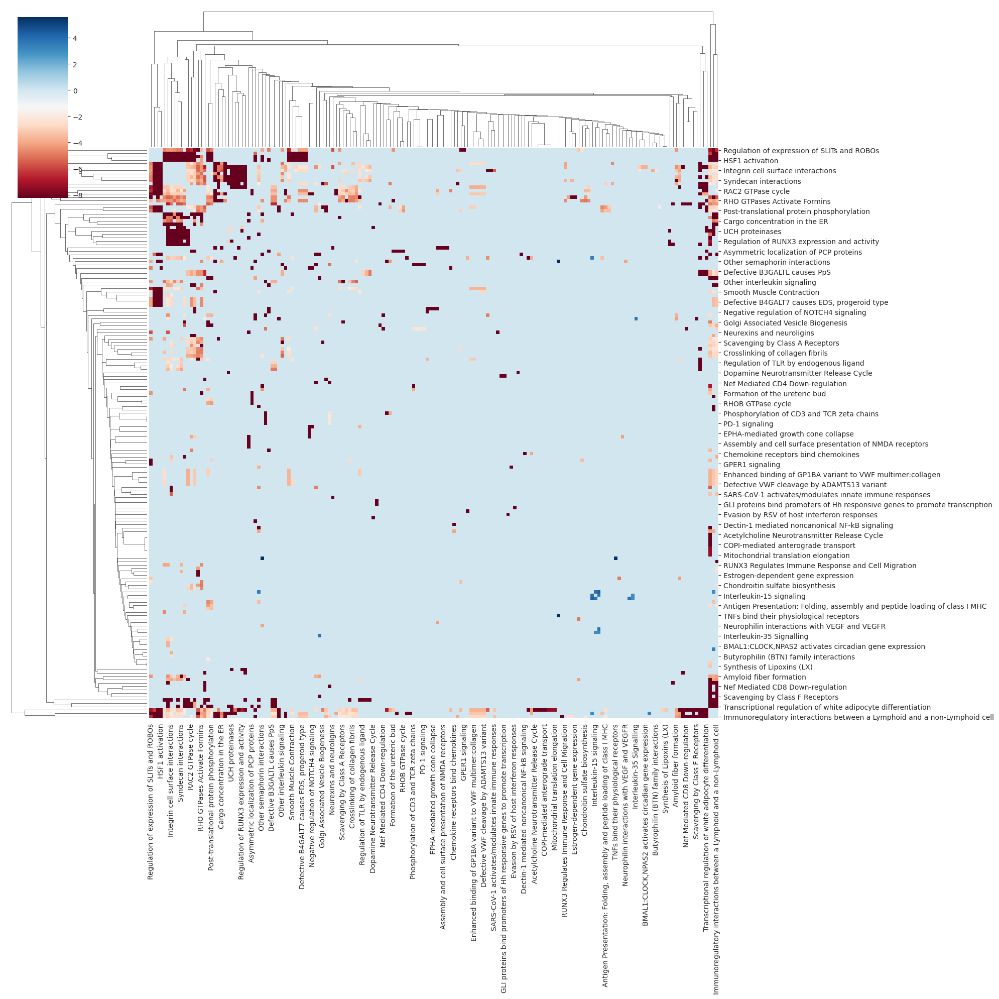

In [75]:
#sns.clustermap(adjacency_matrix, figsize=(20,20), cmap='RdBu')

In [77]:
adjacency_matrix.index

Index(['Nef Mediated CD8 Down-regulation', 'Defective B3GALTL causes PpS',
       'STAT3 nuclear events downstream of ALK signaling',
       'SMAD2/SMAD3:SMAD4 heterotrimer regulates transcription',
       'Collagen degradation', 'GPVI-mediated activation cascade',
       'Tight junction interactions', 'Attenuation phase',
       'Golgi Associated Vesicle Biogenesis',
       'Interaction between L1 and Ankyrins',
       ...
       'Signaling by RAF1 mutants', 'Butyrophilin (BTN) family interactions',
       'Formation of the ureteric bud', 'CDC42 GTPase cycle',
       'Collagen chain trimerization', 'Mitochondrial translation elongation',
       'Recycling pathway of L1', 'Cytosolic tRNA aminoacylation',
       'Acetylcholine Neurotransmitter Release Cycle',
       'MET activates PTK2 signaling'],
      dtype='object', length=169)

# High level pathways

In [5]:
network = pd.read_csv('/home/lnemati/pathway_crosstalk/results/pathways_network/pathways_network_filtered.csv')

In [6]:
network[:20]

,pathway1,pathway2,log2_odds_ratio,pval_adj,j_genesets,tumor_intersection,normal_intersection,tumor_union,normal_union
0,TNF receptor superfamily (TNFSF) members media...,Other semaphorin interactions,inf,0.005746,0.000000,15,0,28,13
1,TNFs bind their physiological receptors,TNF receptor superfamily (TNFSF) members media...,5.569856,0.000710,0.095238,19,1,23,11
2,RUNX1 and FOXP3 control the development of reg...,Interleukin receptor SHC signaling,4.321928,0.006920,0.057143,20,1,30,11
3,RUNX1 and FOXP3 control the development of reg...,Interleukin-15 signaling,3.797956,0.029849,0.000000,17,1,28,10
4,Interleukin-15 signaling,Interleukin receptor SHC signaling,3.767554,0.002717,0.242424,22,3,29,16
5,Interleukin-21 signaling,Interleukin receptor SHC signaling,3.748938,0.005479,0.088235,22,2,31,13
6,Interleukin-35 Signalling,DAP12 signaling,3.714246,0.025616,0.000000,14,1,30,16
7,RUNX1 and FOXP3 control the development of reg...,Interleukin-10 signaling,3.462707,0.004912,0.000000,21,2,41,23
8,Nuclear events stimulated by ALK signaling in ...,Interleukin-4 and Interleukin-13 signaling,3.378512,0.037013,0.027972,13,1,43,25
9,Interleukin-2 signaling,Interleukin-15 signaling,3.044394,0.014178,0.368421,21,4,28,15


In [7]:
(network['log2_odds_ratio'] > 0).value_counts()

False    773
True      12
Name: log2_odds_ratio, dtype: int64

In [8]:
adj = pd.read_csv('/home/lnemati/pathway_crosstalk/results/pathways_network/pathways_high_level_adjacency.csv', index_col=0)

In [9]:
ranked = stack_triangle(adj, 'n')

In [10]:
df = ranked.sort_values(by='n', ascending=False)
df = df[df['n'] > 0]
df.shape

(66, 1)

In [11]:
# Reset index to explode
exploded_df = df.reset_index()

# Rename columns
exploded_df.columns = ['Level 1', 'Level 2', 'n']

for elem in exploded_df['Level 1'] + '-' + exploded_df['Level 2'] + ': ' + exploded_df['n'].astype(int).astype(str):
    print(elem)

Immune System-Disease: 74
Immune System-Extracellular matrix organization: 62
Metabolism of proteins-Immune System: 47
Signal Transduction-Extracellular matrix organization: 44
Disease-Extracellular matrix organization: 35
Disease-Signal Transduction: 33
Signal Transduction-Developmental Biology: 33
Immune System-Signal Transduction: 31
Immune System-Developmental Biology: 30
Metabolism of proteins-Signal Transduction: 23
Metabolism of proteins-Extracellular matrix organization: 22
Extracellular matrix organization-Developmental Biology: 20
Vesicle-mediated transport-Immune System: 16
Gene expression (Transcription)-Immune System: 15
Cellular responses to stimuli-Immune System: 15
Cellular responses to stimuli-Extracellular matrix organization: 15
Metabolism of proteins-Developmental Biology: 14
Disease-Hemostasis: 14
Cellular responses to stimuli-Signal Transduction: 13
Extracellular matrix organization-Hemostasis: 13
Cellular responses to stimuli-Disease: 13
Immune System-Metabolism:

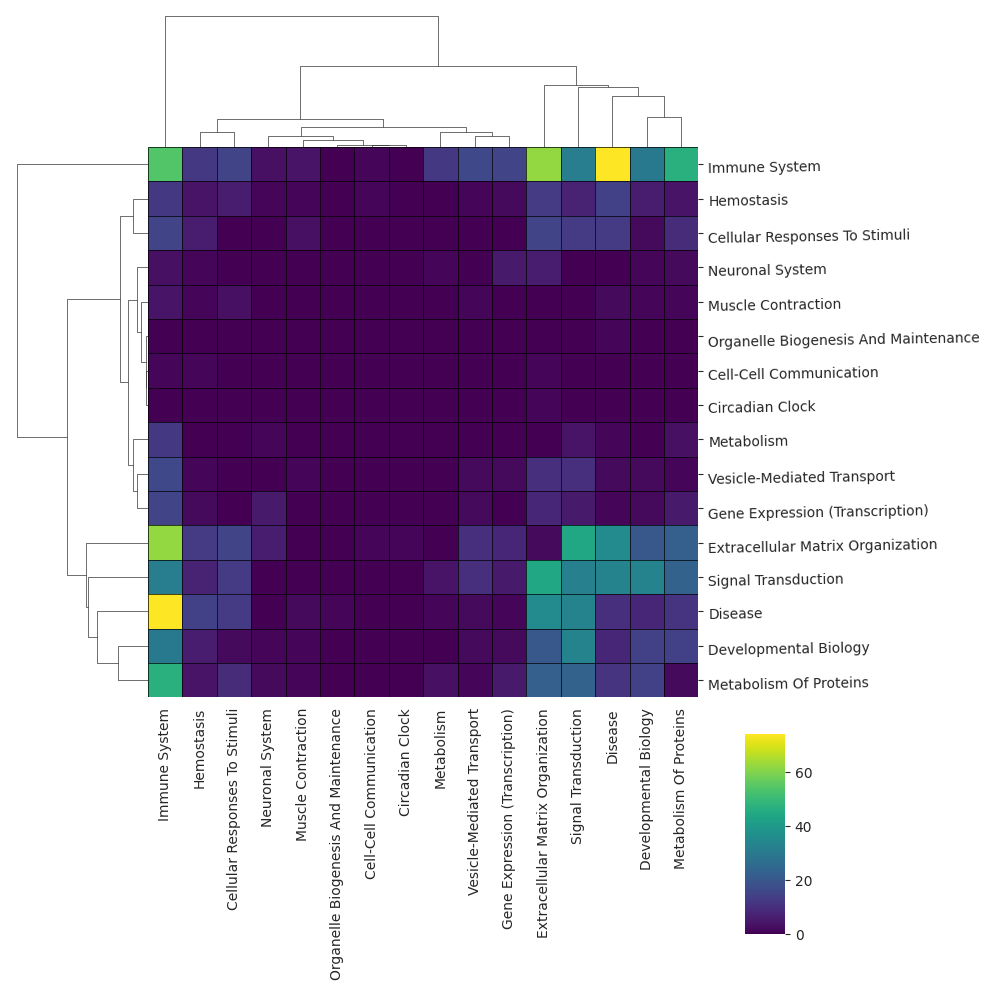

In [12]:
matrix = adj

matrix.columns = [col.title() for col in matrix.columns]
matrix.index   = [idx.title() for idx in matrix.index  ]

g = sns.clustermap(
    adj,
    cmap='viridis',
    cbar_pos=(.75, .06, .04, .2),
    figsize=(10, 10),
    #row_cluster=False,
    #col_cluster=False,
    #row_colors=row_colors,
    #colors_ratio=1/(2*len(all_roots)),
    #vmin=-1.1,
    #vmax=1.1
)

g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), rotation=1)  # Adjust the rotation as needed

# Add black outline
separators1 = list(range(matrix.shape[1]))
separators1 = separators1 + [max(separators1) + 0.99]
separators2 = list(range(matrix.shape[0]))
separators2 = separators2 + [max(separators2) + 0.99]
g.ax_heatmap.vlines(separators1, *g.ax_heatmap.get_ylim(), color='k', linewidth=0.5, zorder=1)
g.ax_heatmap.hlines(separators2, *g.ax_heatmap.get_xlim(), color='k', linewidth=0.5, zorder=1)

plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/pathways_network/high_lev_heathmap.pdf', bbox_inches="tight")

# Pathways Network (New)

In [51]:
network = pd.read_csv('/home/lnemati/pathway_crosstalk/results/pathways_network/pathways_network.csv')

In [52]:
network = network.query('pathway2_modules_tumor >= 3')

#network = network.query(
#    'pathway1_modules_tumor >= 5 & ' + \
#    'pathway2_modules_tumor >= 5 & ' + \
#    'pathway1_modules_normal >= 5 & ' + \
#    'pathway2_modules_normal >= 5'
#)

network = network[network['j_genesets'] < 0.2]
network = network[np.abs(network['adj_diff']) > 0.05]
#
network.reset_index(drop=True, inplace=True)

In [53]:
#network.to_csv('/home/lnemati/pathway_crosstalk/results/pathways_cooccurrences/pathways_network_filtered_small.csv')

In [61]:
network.head()

,pathway1,pathway2,adj_diff,j_genesets,j_modules_diff,intersection_tot,pathway1_modules_tot,pathway2_modules_tot,j_modules_tumor,j_modules_normal,pathway1_modules_tumor,pathway1_modules_normal,pathway2_modules_tumor,pathway2_modules_normal,intersection_tumor,intersection_normal,adj_tumor,adj_normal
0,Interleukin-21 Signaling R-HSA-9020958,FCGR Activation R-HSA-2029481,0.807692,0.000000,0.807692,21,25,40,0.807692,0.000000,23,2,24,16,21,0,0.807692,0.000000
1,TRAF6-mediated Induction Of TAK1 Complex Withi...,MAP3K8 (TPL2)-dependent MAPK1/3 Activation R-H...,0.791209,0.142857,0.923077,5,8,14,1.000000,0.076923,4,4,4,10,4,1,0.857143,0.065934
2,MAP3K8 (TPL2)-dependent MAPK1/3 Activation R-H...,IRAK2 Mediated Activation Of TAK1 Complex Upon...,0.786325,0.148148,0.923077,5,14,8,1.000000,0.076923,4,10,4,4,4,1,0.851852,0.065527
3,Interleukin-21 Signaling R-HSA-9020958,Classical Antibody-Mediated Complement Activat...,0.769231,0.000000,0.769231,20,25,45,0.769231,0.000000,23,2,23,22,20,0,0.769231,0.000000
4,Peptide Ligand-Binding Receptors R-HSA-375276,Interleukin-21 Signaling R-HSA-9020958,0.750000,0.000000,0.750000,18,22,25,0.750000,0.000000,19,3,23,2,18,0,0.750000,0.000000


In [60]:
26187 / network.shape[0]

0.08229393519435095

318213

In [57]:
str1 = 'gpcr'
str2 = 'tyrosine kinase'

network[
    (network['pathway1'].str.lower().str.contains(str1.lower()) & network['pathway2'].str.lower().str.contains(str2.lower())) |
    (network['pathway1'].str.lower().str.contains(str2.lower()) & network['pathway2'].str.lower().str.contains(str1.lower()))
]


,pathway1,pathway2,adj_diff,j_genesets,j_modules_diff,intersection_tot,pathway1_modules_tot,pathway2_modules_tot,j_modules_tumor,j_modules_normal,pathway1_modules_tumor,pathway1_modules_normal,pathway2_modules_tumor,pathway2_modules_normal,intersection_tumor,intersection_normal,adj_tumor,adj_normal
26122,Signaling By Receptor Tyrosine Kinases R-HSA-9...,GPCR Ligand Binding R-HSA-500792,0.209640,0.004211,0.210526,16,142,24,0.210526,0.000000,70,72,22,2,16,0,0.209640,0.000000
26187,Signaling By Receptor Tyrosine Kinases R-HSA-9...,Signaling By GPCR R-HSA-372790,0.209358,0.049601,0.220284,39,142,58,0.354430,0.134146,70,72,37,21,28,11,0.336850,0.127492
28420,Signaling By Receptor Tyrosine Kinases R-HSA-9...,GPCR Downstream Signaling R-HSA-388396,0.201596,0.052880,0.212851,36,142,55,0.333333,0.120482,70,72,34,21,26,10,0.315707,0.114111
131376,Signaling By Non-Receptor Tyrosine Kinases R-H...,GPCR Ligand Binding R-HSA-500792,0.073929,0.001965,0.074074,2,17,24,0.074074,0.000000,7,10,22,2,2,0,0.073929,0.000000
177271,Signaling By Non-Receptor Tyrosine Kinases R-H...,GPCR Downstream Signaling R-HSA-388396,0.050741,0.010542,0.051282,2,17,55,0.051282,0.000000,7,10,34,21,2,0,0.050741,0.000000


In [54]:
network['pathway1_modules_normal'].max()

27

In [11]:
t_network[t_network['intersection'] >= 10].sort_values(by='adj', ascending=False)

,pathway1,pathway2,j_genesets,j_modules,pathway1_modules,pathway2_modules,intersection,adj
253026,Immunoregulatory Interactions Between A Lympho...,Generation Of Second Messenger Molecules R-HSA...,0.026490,0.878049,41,36,36,0.854789
514084,Nuclear Envelope (NE) Reassembly R-HSA-2995410,Extension Of Telomeres R-HSA-180786,0.000000,0.846154,34,38,33,0.846154
1410031,Transcriptional Regulation By E2F6 R-HSA-8953750,Removal Of Flap Intermediate R-HSA-69166,0.000000,0.812500,31,27,26,0.812500
1409844,Transcriptional Regulation By E2F6 R-HSA-8953750,Processive Synthesis On Lagging Strand R-HSA-6...,0.000000,0.812500,31,27,26,0.812500
291205,Interleukin-21 Signaling R-HSA-9020958,FCGR Activation R-HSA-2029481,0.000000,0.807692,23,24,21,0.807692
...,...,...,...,...,...,...,...,...
418743,Mitotic G2-G2/M Phases R-HSA-453274,G2/M Transition R-HSA-69275,0.989130,1.000000,68,68,68,0.010870
1391208,Toll Like Receptor 7/8 (TLR7/8) Cascade R-HSA-...,MyD88 Dependent Cascade Initiated On Endosome ...,0.990291,0.961538,26,25,25,0.009335
1338360,TRAF6 Mediated Induction Of NFkB And MAP Kinas...,MyD88 Dependent Cascade Initiated On Endosome ...,0.990196,0.920000,23,25,23,0.009020
419983,Mitotic Metaphase And Anaphase R-HSA-2555396,Mitotic Anaphase R-HSA-68882,0.995708,1.000000,70,70,70,0.004292


# Module enrichment

In [12]:
# Pathways genesets Jaccard similarity
jg = pd.read_csv('/home/lnemati/pathway_crosstalk/results/pathways_cooccurrences/pathways_genesets_jaccard.csv', index_col=0)

# Pathways tumor modules similarity 
tjm = pd.read_csv('/home/lnemati/pathway_crosstalk/results/pathways_cooccurrences/tumor_modules_jaccard.csv', index_col=0)
tc = pd.read_csv('/home/lnemati/pathway_crosstalk/results/pathways_cooccurrences/tumor_cooccurrences_counts.csv', index_col=0)
tc = tc.loc[tjm.index, tjm.columns]

# Pathways normal modules similarity 
njm = pd.read_csv('/home/lnemati/pathway_crosstalk/results/pathways_cooccurrences/normal_modules_jaccard.csv', index_col=0)
nc = pd.read_csv('/home/lnemati/pathway_crosstalk/results/pathways_cooccurrences/normal_cooccurrences_counts.csv', index_col=0)
nc = nc.loc[njm.index, njm.columns]


FileNotFoundError: [Errno 2] No such file or directory: '/home/lnemati/pathway_crosstalk/results/pathways_cooccurrences/pathways_genesets_jaccard.csv'

In [4]:
def stack_triangle(df, col):
    df = pd.DataFrame(
        df.where(
            np.tri(
                df.shape[0],
                dtype=bool,
                k=-1
            ),
            np.nan
        ).stack(dropna=True), columns=[col] 
    )
    
    return df

jg  = stack_triangle(jg,  'J')
tjm = stack_triangle(tjm, 'J')
tc  = stack_triangle(tc,  'C')
njm = stack_triangle(njm, 'J')
nc  = stack_triangle(nc,  'C')

[]

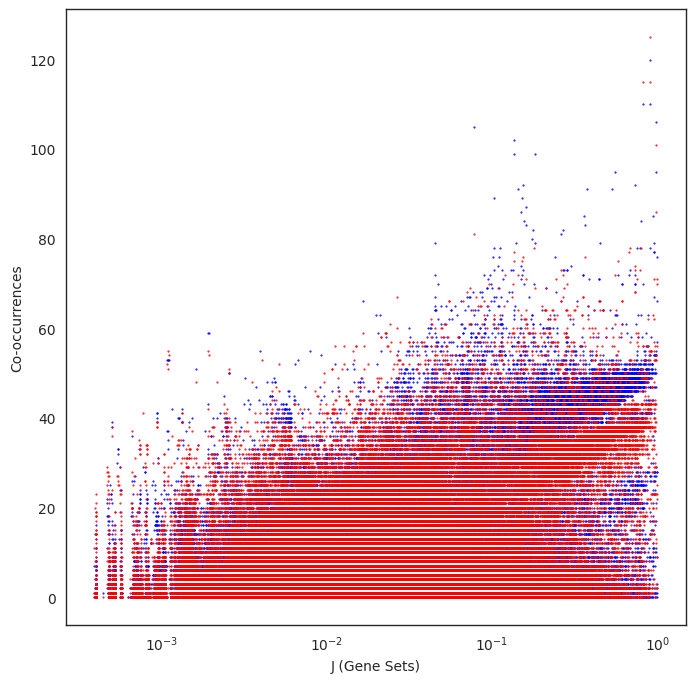

In [5]:
plt.figure(figsize=(8, 8))
plt.scatter(jg['J'], nc['C'], marker='.', color='blue', s=1, alpha=1)
plt.scatter(jg['J'], tc['C'], marker='.', color='red', s=1, alpha=1)
plt.xlabel('J (Gene Sets)')
plt.ylabel('Co-occurrences')
plt.xscale('log')
plt.plot()

[]

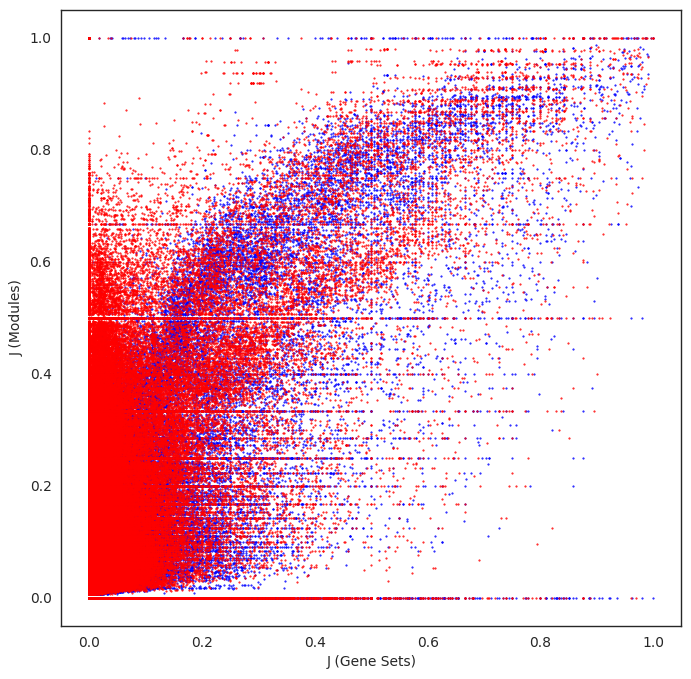

In [6]:
plt.figure(figsize=(8, 8))
plt.scatter(jg['J'], njm['J'], marker='.', color='blue', s=1, alpha=1)
plt.scatter(jg['J'], tjm['J'], marker='.', color='red', s=1, alpha=1)
plt.xlabel('J (Gene Sets)')
plt.ylabel('J (Modules)')
plt.plot()

In [7]:
df = (tjm['J'] - njm['J']).to_frame(name='diff_J_modules')
df.loc[jg.index, 'J_genesets'] = jg['J'] 
df.loc[jg.index, 'J_N_modules'] = njm.loc[jg.index, 'J']
df.loc[jg.index, 'J_T_modules'] = tjm.loc[jg.index, 'J']
df.loc[jg.index, 'N_counts'] = nc.loc[jg.index, 'C']
df.loc[jg.index, 'T_counts'] = tc.loc[jg.index, 'C'] 
df['sum_counts'] = df['T_counts'] + df['N_counts']
df = df.sort_values(by='diff_J_modules', ascending=False)

min_modules = 10
min_J_difference = 0.
max_J_genesets = 1.

df = df[(df['N_counts'] >= min_modules) & (df['T_counts'] >= min_modules)]
df = df[df['J_genesets'] <= max_J_genesets]
df = df[np.abs(df['diff_J_modules']) >= min_J_difference]

Text(0, 0.5, 'Modules')

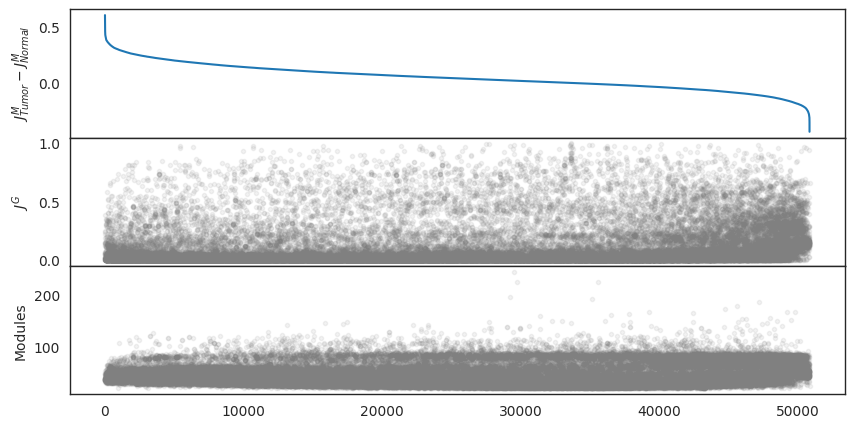

In [8]:
fig, (ax1, ax2, ax3) = plt.subplots(3,1, figsize=(10,5), sharex=True)
plt.subplots_adjust(hspace=0)
ax1.plot(df.diff_J_modules.values)
ax1.set_ylabel('$J_{Tumor}^M - J_{Normal}^M$')
ax2.plot(df.J_genesets.values, marker='.', alpha=0.1, linestyle=" ", color='gray')
ax2.set_ylabel('$J^G$')
ax3.plot(df.sum_counts.values, marker='.', alpha=0.1, linestyle=" ", color='gray')
ax3.set_ylabel('Modules')

In [9]:
df['adj'] = df['diff_J_modules']*(1-df['J_genesets'])
df.sort_values(by='adj', ascending=False, inplace=True)
df['rank'] = list(range(df.shape[0]))

In [10]:
#queries = ['Receptor Tyrosine Kinases']
queries = ['Signaling By GPCR']

masks = []

for i, query in enumerate(queries):
    mask0 = df.index.get_level_values(0).str.contains(query, case=False)
    mask1 = df.index.get_level_values(1).str.contains(query, case=False)
    masks.append(np.logical_or(mask0 , mask1))
    
mask = True * df.shape[0]

for elem in masks:
    print(sum(elem))
    mask = np.logical_and(mask , elem)
    print(sum(mask))
    print()

32
32



In [11]:
df.shape

(50855, 9)

In [2]:
def stack_triangle(df, col):
    df = pd.DataFrame(
        df.where(
            np.tri(
                df.shape[0],
                dtype=bool,
                k=-1
            ),
            np.nan
        ).stack(dropna=True), columns=[col] 
    )
    
    return df


In [12]:
df[mask]

,,diff_J_modules,J_genesets,J_N_modules,J_T_modules,N_counts,T_counts,sum_counts,adj,rank
Toll-like Receptor Cascades R-HSA-168898,Signaling By GPCR R-HSA-372790,0.359618,0.019162,0.177419,0.537037,11.0,27.0,38.0,0.352727,188
Cell Surface Interactions At Vascular Wall R-HSA-202733,Signaling By GPCR R-HSA-372790,0.345000,0.016049,0.275000,0.620000,11.0,30.0,41.0,0.339463,263
Innate Immune System R-HSA-168249,Signaling By GPCR R-HSA-372790,0.336103,0.046117,0.141509,0.477612,15.0,30.0,45.0,0.320603,443
"Platelet Activation, Signaling And Aggregation R-HSA-76002",Signaling By GPCR R-HSA-372790,0.352320,0.114657,0.254237,0.606557,15.0,35.0,50.0,0.311924,538
Immunoregulatory Interactions Between A Lymphoid And A non-Lymphoid Cell R-HSA-198933,Signaling By GPCR R-HSA-372790,0.307265,0.003708,0.288889,0.596154,13.0,30.0,43.0,0.306126,629
Cytokine Signaling In Immune System R-HSA-1280215,Signaling By GPCR R-HSA-372790,0.311357,0.046652,0.161616,0.472973,16.0,33.0,49.0,0.296832,785
Signaling By Interleukins R-HSA-449147,Signaling By GPCR R-HSA-372790,0.305870,0.047706,0.171053,0.476923,13.0,29.0,42.0,0.291278,879
Immune System R-HSA-168256,Signaling By GPCR R-HSA-372790,0.300000,0.042789,0.123077,0.423077,16.0,31.0,47.0,0.287163,981
Interferon Gamma Signaling R-HSA-877300,Signaling By GPCR R-HSA-372790,0.287722,0.007772,0.204082,0.491803,10.0,28.0,38.0,0.285485,1027
"Interleukin-3, Interleukin-5 And GM-CSF Signaling R-HSA-512988",Signaling By GPCR R-HSA-372790,0.273243,0.012431,0.277778,0.551020,10.0,26.0,36.0,0.269846,1382


[]

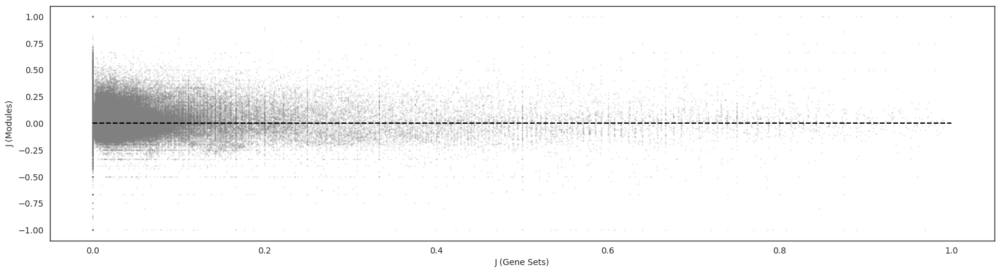

In [14]:
plt.figure(figsize=(20, 5))
plt.scatter(jg['J'], tjm['J'] - njm['J'], marker='.', color='gray', s=5, alpha=0.1)
plt.hlines(y=0, xmin=0, xmax=1, linestyle='--', color='k')
plt.xlabel('J (Gene Sets)')
plt.ylabel('J (Modules)')
plt.plot()

# Modules ranked by size

In [39]:
import os
import pandas as pd
from matplotlib.cm import get_cmap

cmap = get_cmap('tab20')

parent_dir = "/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/"

# Initialize an empty list to store dataframes
t_df = []
n_df = []
i = 0
processed_normal_files = set()

for tissue in os.listdir(parent_dir):
    increase_i = False
    color = cmap(i)
    tissue_path = os.path.join(parent_dir, tissue, "tumor")
    
    for tumor_type in os.listdir(tissue_path):
        data = {}
        tumor_dir = os.path.join(tissue_path, tumor_type)
        module_info_path = os.path.join(tumor_dir, "module_info.csv")
        corresponding_normal_file = os.path.join(tumor_dir, "corresponding_normal_file.txt")
        
        # Check if both module_info.csv and corresponding_normal_file.txt exist
        if os.path.exists(module_info_path) and os.path.exists(corresponding_normal_file):
            try:
                with open(corresponding_normal_file, 'r') as normal_file:
                    normal_dir = os.path.dirname(normal_file.read().strip())
                
                # Read module_info.csv into a dataframe
                tumordata = pd.read_csv(module_info_path, index_col=0)
                tumordata["name"] = os.path.basename(tumor_dir)
                tumordata["color"] = [color] * tumordata.shape[0]
                
                # Also read normal file if it's new
                if normal_dir not in processed_normal_files:
                    normaldata = pd.read_csv(os.path.join(normal_dir, 'module_info.csv'), index_col=0)
                    normaldata["name"] = os.path.basename(os.path.dirname(normal_dir))
                    normaldata["color"] = [color] * normaldata.shape[0]

                    # Append the dataframe to the list and update the set
                    n_df.append(normaldata)
                    processed_normal_files.add(normal_dir)
                    increase_i = True

                # Append the tumor dataframe to the list
                t_df.append(tumordata)
                
            except Exception as e:
                print(f"Error processing {tumor_dir}: {e}")
    
    if increase_i:
        i += 1
                
# Concatenate all dataframes into a final dataframe
t_df = pd.concat(t_df)
n_df = pd.concat(n_df)


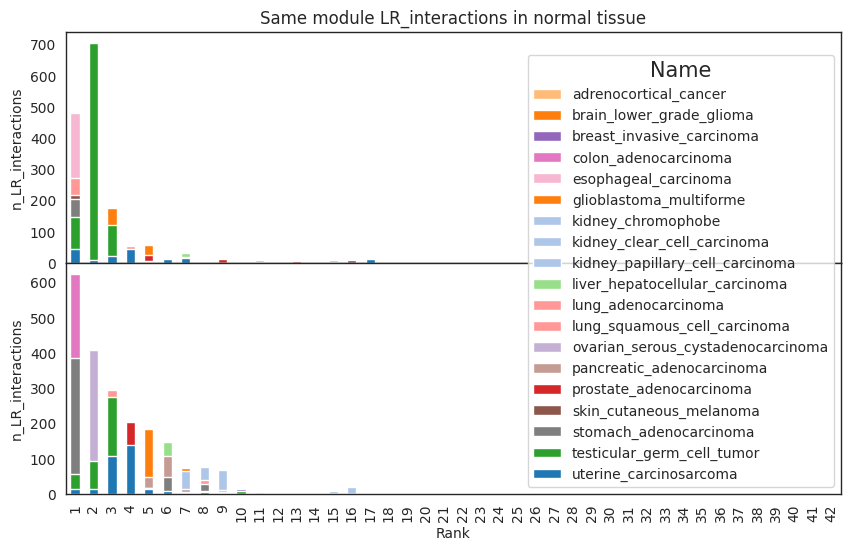

In [43]:
import matplotlib.pyplot as plt

# Create subplots
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 6), sharex=True)
fig.subplots_adjust(hspace=0)
fig.subplots_adjust(wspace=0)

col_to_plot = "n_LR_interactions" 
#col_to_plot = "per10k_pairs_that_are_LR_interactions" 

# Plot for n_df
for i, (name, group) in enumerate(n_df.groupby('name')):
    color = group['color'].iloc[0]  # Get the color of the group
    group.plot(kind='bar', x='rank', y=col_to_plot, ax=axes[0], label=name, color=color, legend=False)

axes[0].set_title('Same module LR_interactions in normal tissue')
axes[0].set_xlabel('Rank')
axes[0].set_ylabel(col_to_plot)

# Plot for t_df
for i, (name, group) in enumerate(t_df.groupby('name')):
    color = group['color'].iloc[0]  # Get the color of the group
    group.plot(kind='bar', x='rank', y=col_to_plot, ax=axes[1], label=name, color=color)

#axes[1].set_title('Same module LR_interactions in tumor tissue')
axes[1].set_xlabel('Rank')
axes[1].set_ylabel(col_to_plot)
axes[1].legend(title='Name')

# Adjust layout
#plt.tight_layout()

# Show the plot
plt.show()


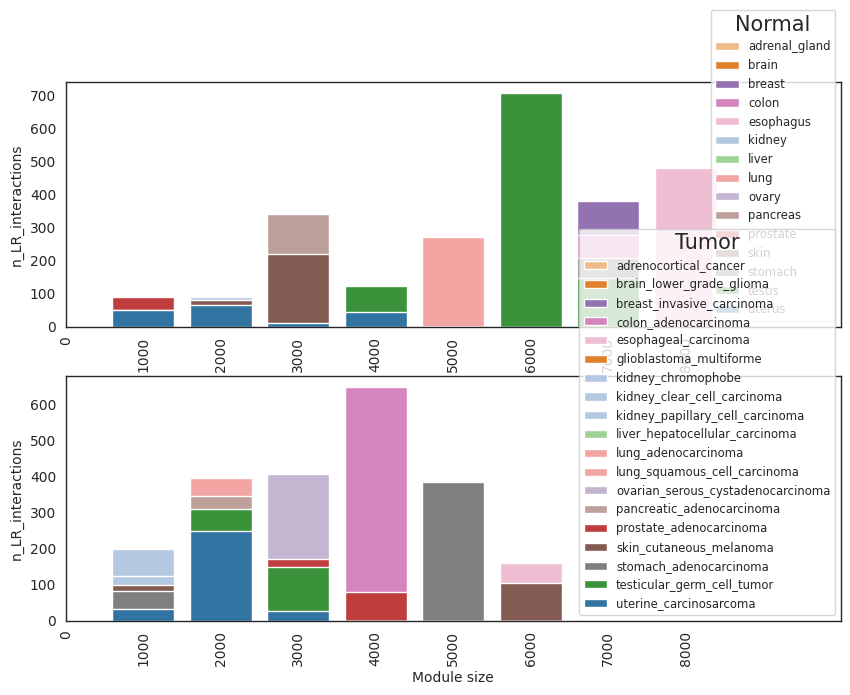

In [47]:
# Create subplots
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 7), sharex=False)
#fig.subplots_adjust(hspace=0)

col_to_plot = "n_LR_interactions" 

# Define bins for different sizes
bin_width = 1000

size_bins = np.arange(
    0,
    max(max(n_df['size']), max(t_df['size'])) + bin_width,
    bin_width,
)  # Define your desired bin sizes here

# Function to assign size bins
def assign_size_bin(size):
    for i in range(len(size_bins) - 1):
        if size_bins[i] < size <= size_bins[i + 1]:
            return size_bins[i+1]
        
n_df['size_bin'] = n_df['size'].apply(assign_size_bin)
t_df['size_bin'] = t_df['size'].apply(assign_size_bin)

n_df_grouped = n_df.groupby(['name', 'size_bin']).agg({col_to_plot: 'sum'}).reset_index()
t_df_grouped = t_df.groupby(['name', 'size_bin']).agg({col_to_plot: 'sum'}).reset_index()

# Merge n_df_grouped with n_df to add corresponding colors
if 'color' not in n_df_grouped.columns:
    n_df_grouped = n_df_grouped.merge(n_df[['name', 'color']].drop_duplicates(), on='name', how='left')
if 'color' not in t_df_grouped.columns:
    # Merge t_df_grouped with t_df to add corresponding colors
    t_df_grouped = t_df_grouped.merge(t_df[['name', 'color']].drop_duplicates(), on='name', how='left')

# Ensure both grouped dataframes have entries for all bins
for name in n_df_grouped['name'].unique():
    for size_bin in size_bins:
        if not ((n_df_grouped['name'] == name) & (n_df_grouped['size_bin'] == size_bin)).any():
            n_df_grouped = n_df_grouped.append({'name': name, 'size_bin': size_bin, col_to_plot: 0}, ignore_index=True)

for name in t_df_grouped['name'].unique():
    for size_bin in size_bins:
        if not ((t_df_grouped['name'] == name) & (t_df_grouped['size_bin'] == size_bin)).any():
            t_df_grouped = t_df_grouped.append({'name': name, 'size_bin': size_bin, col_to_plot: 0}, ignore_index=True)
            
xlim = max(t_df_grouped.size_bin.nunique(), n_df_grouped.size_bin.nunique()) + 1

# Normal colors

# Extract unique names and corresponding colors
unique_names_n = n_df_grouped['name'].unique()
unique_colors_n = n_df_grouped['color'].unique()
# Create a dictionary mapping each unique name to its corresponding color
name_color_map_n = dict(zip(unique_names_n, unique_colors_n))
# Create a dictionary to store the first color assigned to each unique name
name_color_map_t = {}

# Tumor colors

# Iterate over each unique name in the DataFrame
for name in t_df_grouped['name'].unique():
    # Get the first color assigned to the current name
    first_color = t_df_grouped.loc[t_df_grouped['name'] == name, 'color'].iloc[0]
    # Add the name and its corresponding color to the dictionary
    name_color_map_t[name] = first_color

# Plot for n_df
sns.barplot(data=n_df_grouped, x='size_bin', y=col_to_plot, hue='name', palette=name_color_map_n, ax=axes[0], dodge=False)

axes[0].legend(title='Normal', fontsize='small')
axes[0].set_xlabel('Size Bin')
axes[0].set_ylabel(col_to_plot)

# Plot for t_df
sns.barplot(data=t_df_grouped, x='size_bin', y=col_to_plot, hue='name', palette=name_color_map_t, ax=axes[1], dodge=False)

axes[1].legend(title='Tumor', fontsize='small')
axes[1].set_xlabel('Module size')
axes[1].set_ylabel(col_to_plot)

axes[0].set_xlim(0, xlim)
axes[1].set_xlim(0, xlim)

# Rotate x-labels by 90 degrees
for ax in axes:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    ax.set_xticks(ax.get_xticks())  # Set the x-axis ticks

# Show the plot
plt.show()


# LR pairs, normal vs tumor

In [78]:
parent_dir = "/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/"

# Initialize an empty list to store dataframes
all_dataframes = []

for tissue in os.listdir(parent_dir):
    tissue_path = os.path.join(parent_dir, tissue, "tumor")
    
    for tumor_type in os.listdir(tissue_path):
        data = {}
        file_path = os.path.join(tissue_path, tumor_type, "comparison.txt")
                
        try:
            with open(file_path, 'r') as file:
                for line in file:
                    # Split each line based on the colon (:)
                    key, value = map(str.strip, line.split(': ', 1))
                    
                    # Store the key-value pair in the dictionary
                    data[key] = value
                
            data["Name"] = data['Tumor directory'].split("/")[-1]
            data = {k: [v] for k, v in data.items()}
            data = pd.DataFrame(data, index=data["Name"])
            
            # Append the dataframe to the list
            all_dataframes.append(data)
            
        except Exception as e:
            pass

# Concatenate all dataframes into a final dataframe
comp_df = pd.concat(all_dataframes)
comp_df.drop(columns=["Tumor directory", "Normal directory", "Name"], inplace=True)
comp_df = comp_df.apply(pd.to_numeric, errors='ignore')
comp_df.head()

,roc_auc_normal_vs_all,roc_auc_normal_vs_lr,normal_ranksums_U_vs_all,normal_ranksums_p_vs_all,normal_ranksums_U_vs_lr,normal_ranksums_p_vs_lr,roc_auc_tumor_vs_all,roc_auc_tumor_vs_lr,tumor_ranksums_U_vs_all,tumor_ranksums_p_vs_all,tumor_ranksums_U_vs_lr,tumor_ranksums_p_vs_lr,jaccard_all_lr_pairs,jaccard_same_module
uterine_carcinosarcoma,0.552611,0.564248,7.536312,2.417237e-14,9.192151,1.925321e-20,0.632918,0.577628,20.269727,1.189865e-91,11.824415,1.459643e-32,0.719438,0.074492
kidney_papillary_cell_carcinoma,0.591298,0.563029,13.462468,1.300408e-41,9.282488,8.278301e-21,0.606828,0.587191,15.122662,5.740281e-52,12.327964,3.202228e-35,0.729156,0.083135
kidney_chromophobe,0.591298,0.563029,13.462468,1.300408e-41,9.282488,8.278301e-21,0.578623,0.550660,10.897696,5.910628e-28,7.013075,1.165685e-12,0.727090,0.078431
kidney_clear_cell_carcinoma,0.591298,0.563029,13.462468,1.300408e-41,9.282488,8.278301e-21,0.603091,0.575860,15.814185,1.242014e-56,11.623189,1.570932e-31,0.719330,0.101626
brain_lower_grade_glioma,0.606592,0.565845,15.393427,9.058910e-54,9.497419,1.075788e-21,0.624685,0.594772,19.053427,3.076925e-81,14.465088,1.006736e-47,0.815867,0.105850


In [79]:
comp_df.columns

Index(['roc_auc_normal_vs_all', 'roc_auc_normal_vs_lr',
       'normal_ranksums_U_vs_all', 'normal_ranksums_p_vs_all',
       'normal_ranksums_U_vs_lr', 'normal_ranksums_p_vs_lr',
       'roc_auc_tumor_vs_all', 'roc_auc_tumor_vs_lr',
       'tumor_ranksums_U_vs_all', 'tumor_ranksums_p_vs_all',
       'tumor_ranksums_U_vs_lr', 'tumor_ranksums_p_vs_lr',
       'jaccard_all_lr_pairs', 'jaccard_same_module'],
      dtype='object')

In [80]:
def create_subplot(ax, data, kind, ylabel, legend_title=None, xtick_labels=None, palette=None):
    if kind == 'bar':
        data.plot(kind='bar', stacked=False, ax=ax, color=palette)
        if xtick_labels is not None:
            ax.set_xticklabels(xtick_labels)
    elif kind == 'boxplot':
        sns.boxplot(data=data, ax=ax, palette=palette)
        if xtick_labels is not None:
            ax.set_xticklabels([])  # Remove xticks for boxplot

    ax.set_ylabel(ylabel)

    if legend_title:
        ax.legend(loc="right", title=legend_title)

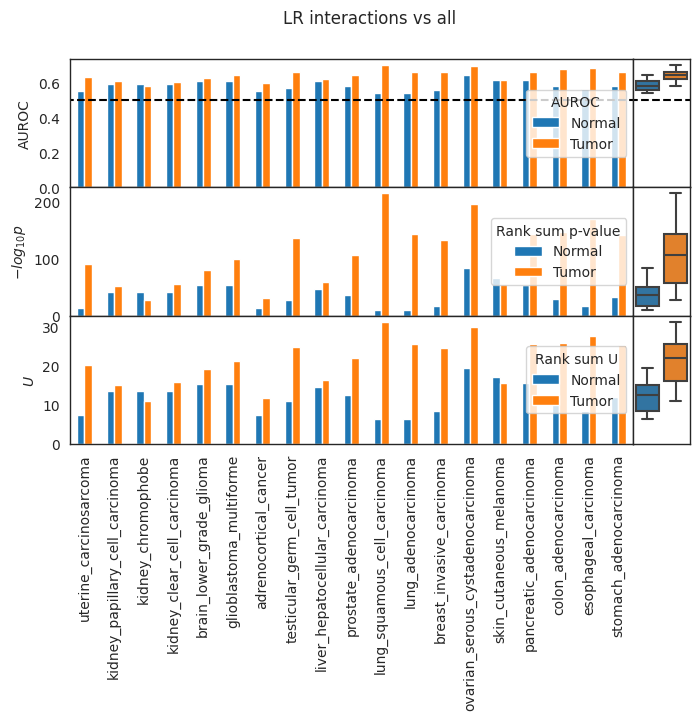

In [81]:
vs = "_vs_all"

fig, ax = plt.subplots(3, 2, figsize=(8, 5), sharex='col', sharey='row', gridspec_kw={'width_ratios': [1, 0.1]})
fig.subplots_adjust(hspace=0)
fig.subplots_adjust(wspace=0)
plt.rcParams['legend.title_fontsize'] = 'medium'

fig.suptitle("LR interactions" + vs.replace("_", " "))

# Data and parameters
rename_auc = {"roc_auc_normal"+vs: "Normal", "roc_auc_tumor"+vs: "Tumor"}
bar_colors_auc = sns.color_palette("tab10", n_colors=len(comp_df.rename(columns=rename_auc)[["Normal", "Tumor"]]))

rename_mannwhitneyu_p = {"normal_mannwhitneyu_p"+vs: "Normal", "tumor_mannwhitneyu_p"+vs: "Tumor"}
bar_colors_mannwhitneyu_p = sns.color_palette("tab10", n_colors=len(comp_df.rename(columns=rename_mannwhitneyu_p)[["Normal", "Tumor"]]))

rename_mannwhitneyu_U = {"normal_mannwhitneyu_U"+vs: "Normal", "tumor_mannwhitneyu_U"+vs: "Tumor"}
bar_colors_mannwhitneyu_U = sns.color_palette("tab10", n_colors=len(comp_df.rename(columns=rename_mannwhitneyu_U)[["Normal", "Tumor"]]))

#rename_jaccard = {"jaccard_all_lr_pairs": "LR pairs (all)", "jaccard_same_module": "LR pairs (same module)"}
#bar_colors_jaccard = sns.color_palette("Set2", n_colors=len(comp_df.rename(columns=rename_jaccard)[["LR pairs (all)", "LR pairs (same module)"]]))

# Create subplots using the function
create_subplot(ax[0, 0], comp_df.rename(columns=rename_auc)[["Normal", "Tumor"]], 'bar', 'AUROC', 'AUROC', palette=bar_colors_auc)
create_subplot(ax[0, 1], comp_df.rename(columns=rename_auc)[["Normal", "Tumor"]], 'boxplot', 'AUROC', palette=bar_colors_auc)
ax[0, 0].hlines(y=0.5, xmin=-1, xmax=len(comp_df), color="k", linestyle="dashed", label="random")
ax[0, 1].hlines(y=0.5, xmin=-1, xmax=2, color="k", linestyle="dashed", label="random")

create_subplot(ax[1, 0], -np.log10(comp_df.rename(columns=rename_mannwhitneyu_p)[["Normal", "Tumor"]]), 'bar', r'$-log_{10}p$', 'Rank sum p-value', palette=bar_colors_mannwhitneyu_p)
create_subplot(ax[1, 1], -np.log10(comp_df.rename(columns=rename_mannwhitneyu_p)[["Normal", "Tumor"]]), 'boxplot', r'$-log_{10}p$', palette=bar_colors_mannwhitneyu_p)

create_subplot(ax[2, 0], comp_df.rename(columns=rename_mannwhitneyu_U)[["Normal", "Tumor"]], 'bar', r'$U$', 'Rank sum U', palette=bar_colors_mannwhitneyu_U)
create_subplot(ax[2, 1], comp_df.rename(columns=rename_mannwhitneyu_U)[["Normal", "Tumor"]], 'boxplot', r'$U$', palette=bar_colors_mannwhitneyu_U)

#create_subplot(ax[3, 0], comp_df.rename(columns=rename_jaccard)[['LR pairs (all)', 'LR pairs (same module)']], 'bar', 'J', 'Jaccard similarity', xtick_labels=comp_df.index, palette=bar_colors_jaccard)
#create_subplot(ax[3, 1], comp_df.rename(columns=rename_jaccard)[["LR pairs (all)", "LR pairs (same module)"]], 'boxplot', 'J', palette=bar_colors_jaccard)

ax[-1, 1].set_xticks([])

plt.show()


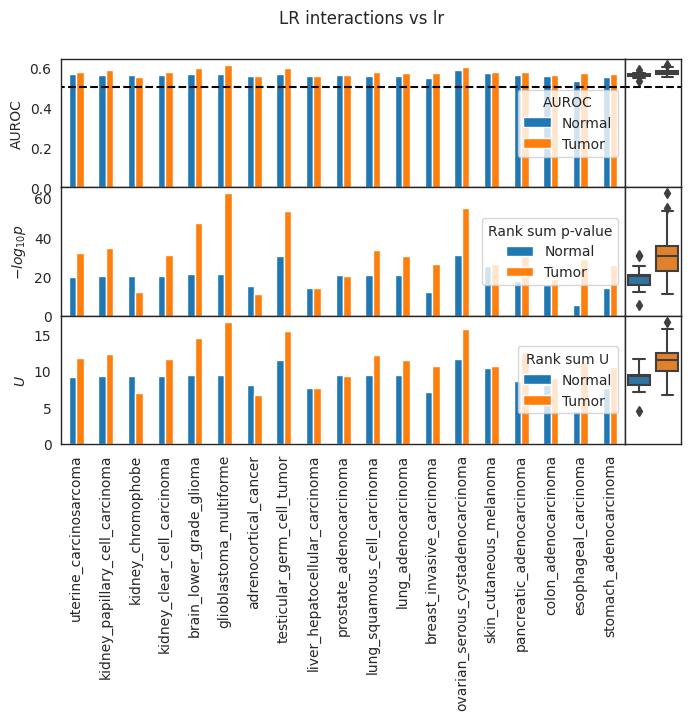

In [82]:
vs = "_vs_lr"

fig, ax = plt.subplots(3, 2, figsize=(8, 5), sharex='col', sharey='row', gridspec_kw={'width_ratios': [1, 0.1]})
fig.subplots_adjust(hspace=0)
fig.subplots_adjust(wspace=0)
plt.rcParams['legend.title_fontsize'] = 'medium'

fig.suptitle("LR interactions" + vs.replace("_", " "))

# Data and parameters
rename_auc = {"roc_auc_normal"+vs: "Normal", "roc_auc_tumor"+vs: "Tumor"}
bar_colors_auc = sns.color_palette("tab10", n_colors=len(comp_df.rename(columns=rename_auc)[["Normal", "Tumor"]]))

rename_mannwhitneyu_p = {"normal_mannwhitneyu_p"+vs: "Normal", "tumor_mannwhitneyu_p"+vs: "Tumor"}
bar_colors_mannwhitneyu_p = sns.color_palette("tab10", n_colors=len(comp_df.rename(columns=rename_mannwhitneyu_p)[["Normal", "Tumor"]]))

rename_mannwhitneyu_U = {"normal_mannwhitneyu_U"+vs: "Normal", "tumor_mannwhitneyu_U"+vs: "Tumor"}
bar_colors_mannwhitneyu_U = sns.color_palette("tab10", n_colors=len(comp_df.rename(columns=rename_mannwhitneyu_U)[["Normal", "Tumor"]]))

#rename_jaccard = {"jaccard_all_lr_pairs": "LR pairs (all)", "jaccard_same_module": "LR pairs (same module)"}
#bar_colors_jaccard = sns.color_palette("Set2", n_colors=len(comp_df.rename(columns=rename_jaccard)[["LR pairs (all)", "LR pairs (same module)"]]))

# Create subplots using the function
create_subplot(ax[0, 0], comp_df.rename(columns=rename_auc)[["Normal", "Tumor"]], 'bar', 'AUROC', 'AUROC', palette=bar_colors_auc)
create_subplot(ax[0, 1], comp_df.rename(columns=rename_auc)[["Normal", "Tumor"]], 'boxplot', 'AUROC', palette=bar_colors_auc)
ax[0, 0].hlines(y=0.5, xmin=-1, xmax=len(comp_df), color="k", linestyle="dashed", label="random")
ax[0, 1].hlines(y=0.5, xmin=-1, xmax=2, color="k", linestyle="dashed", label="random")

create_subplot(ax[1, 0], -np.log10(comp_df.rename(columns=rename_mannwhitneyu_p)[["Normal", "Tumor"]]), 'bar', r'$-log_{10}p$', 'Rank sum p-value', palette=bar_colors_mannwhitneyu_p)
create_subplot(ax[1, 1], -np.log10(comp_df.rename(columns=rename_mannwhitneyu_p)[["Normal", "Tumor"]]), 'boxplot', r'$-log_{10}p$', palette=bar_colors_mannwhitneyu_p)

create_subplot(ax[2, 0], comp_df.rename(columns=rename_mannwhitneyu_U)[["Normal", "Tumor"]], 'bar', r'$U$', 'Rank sum U', palette=bar_colors_mannwhitneyu_U)
create_subplot(ax[2, 1], comp_df.rename(columns=rename_mannwhitneyu_U)[["Normal", "Tumor"]], 'boxplot', r'$U$', palette=bar_colors_mannwhitneyu_U)

#create_subplot(ax[3, 0], comp_df.rename(columns=rename_jaccard)[['LR pairs (all)', 'LR pairs (same module)']], 'bar', 'J', 'Jaccard similarity', xtick_labels=comp_df.index, palette=bar_colors_jaccard)
#create_subplot(ax[3, 1], comp_df.rename(columns=rename_jaccard)[["LR pairs (all)", "LR pairs (same module)"]], 'boxplot', 'J', palette=bar_colors_jaccard)

ax[-1, 1].set_xticks([])

plt.show()


# LR interaction

In [7]:
import glob

def find_files(directory, filename):
    # Create a list to store the paths of matching files
    matching_files = []

    # Use os.walk to iterate through all subdirectories
    for root, dirs, files in os.walk(directory):
        # Use glob to find files with the specified filename in the current directory
        matching_files.extend(glob.glob(os.path.join(root, filename)))

    return matching_files

# Specify the parent directory and the filename to search for
parent_directory = "/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/"
filename_to_find = "LR_interactions.csv"

# Call the function to find matching files
lr_files = find_files(parent_directory, filename_to_find)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18


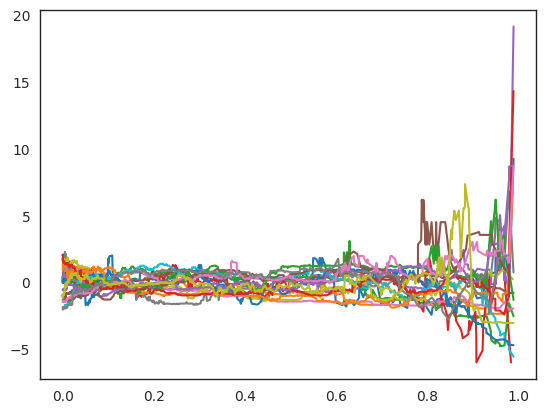

In [8]:
for i, path in enumerate(lr_files[::3]):
    print(i)
    path = path.split("LR_interactions.csv")[0]
    df = pd.read_csv(path + "LR_interactions.csv")
    tom = pd.read_csv(path + "tom.csv.gz", index_col=0)
    
    toms = []

    for index, row in df.iterrows():
        l = row['ligand']
        r = row['receptor']
        toms.append(tom.loc[l, r])

    df['TOM'] = toms
    
    ns = np.sort(df.frac_interactions.unique())
    toms = []

    for n in ns:
        toms.append(df[df.frac_interactions > n]["TOM"].median())

    plt.plot(ns, (toms-np.nanmean(toms))/np.nanstd(toms))
    #plt.vlines(x=0.75, ymin=min(toms), ymax=max(toms), color="k")
    
plt.show()

In [117]:
df.same_module.mean()

0.20389700765483645

In [118]:
df[df["frac_interactions"] > 0.75].same_module.mean()

0.19411764705882353

In [119]:
df.TOM.mean()

0.012987270164174197

In [120]:
df[df["frac_interactions"] > 0.75].TOM.mean()

0.005309597829290416

In [121]:
df.TOM.median()

0.0001767205987371

In [122]:
df[df["frac_interactions"] > 0.75].TOM.median()

0.00023644601356115

In [65]:
df = pd.read_csv("/home/lnemati/pathway_crosstalk/code/1_compare/results.csv")
df.index = df["Name"].values
df.head(3)

,Name,Tumor_n_modules,Normal_n_modules,Tumor_n_genes,Normal_n_genes,Tumor_total_gene_pairs,Normal_total_gene_pairs,Tumor_gene_pairs_same_module,Normal_gene_pairs_same_module,Tumor_total_LR_pairs,Normal_total_LR_pairs,Tumor_LR_pairs_same_module,Normal_LR_pairs_same_module,Tumor_LR_pairs_Z_score,Normal_LR_pairs_Z_score
uterine_carcinosarcoma,uterine_carcinosarcoma,101,66,14242,13646,101410161,93099835,5766400,7375479,1850,1625,253,106,14.838981,-2.088137
kidney_papillary_cell_carcinoma,kidney_papillary_cell_carcinoma,34,43,13760,14033,94661920,98455528,7499613,7693709,1586,1714,184,142,5.424649,0.725461
kidney_chromophobe,kidney_chromophobe,53,43,13474,14033,90767601,98455528,5651149,7693709,1522,1714,173,142,8.300088,0.725461


In [66]:
df.columns

Index(['Name', 'Tumor_n_modules', 'Normal_n_modules', 'Tumor_n_genes',
       'Normal_n_genes', 'Tumor_total_gene_pairs', 'Normal_total_gene_pairs',
       'Tumor_gene_pairs_same_module', 'Normal_gene_pairs_same_module',
       'Tumor_total_LR_pairs', 'Normal_total_LR_pairs',
       'Tumor_LR_pairs_same_module', 'Normal_LR_pairs_same_module',
       'Tumor_LR_pairs_Z_score', 'Normal_LR_pairs_Z_score'],
      dtype='object')

In [47]:
LR_pairs_n = pd.read_csv("/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/stomach/tumor/stomach_adenocarcinoma/LR_interactions.csv")
LR_pairs_t = pd.read_csv("/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/stomach/normal/LR_interactions.csv")

In [48]:
all_lr_pairs_n = set(LR_pairs_n["ligand"] + "-" + LR_pairs_n["receptor"])
all_lr_pairs_t = set(LR_pairs_t["ligand"] + "-" + LR_pairs_t["receptor"])

subset_n = LR_pairs_n.loc[LR_pairs_n["same_module"]]
subset_t = LR_pairs_t.loc[LR_pairs_t["same_module"]]

same_module_lr_pairs_n = set(subset_n["ligand"] + "-" + subset_n["receptor"])
same_module_lr_pairs_t = set(subset_t["ligand"] + "-" + subset_t["receptor"])

In [49]:
def jaccard_similarity(set1, set2):
    intersection_size = len(set1.intersection(set2))
    union_size = len(set1.union(set2))
    similarity = intersection_size / union_size
    return similarity

# Calculate Jaccard similarity
js_all = jaccard_similarity(all_lr_pairs_n, all_lr_pairs_t)
js_same_module = jaccard_similarity(same_module_lr_pairs_n, same_module_lr_pairs_t)


# Print the result
print("Jaccard Similarity:")
print(f"All LR pairs: {js_all}")
print(f"Same module: {js_same_module}")

Jaccard Similarity:
All LR pairs: 0.7102892366050261
Same module: 0.2412818096135721


In [36]:
from scipy.stats import mannwhitneyu

rng = np.random.default_rng()

sample1 = rng.uniform(-1, 1, int(1e8))

sample2 = rng.uniform(-0.99, 1.01, 2000) # a shifted distribution

In [39]:
mannwhitneyu(sample1, sample2, alternative='less')

RanksumsResult(statistic=-35.99798191271874, pvalue=4.498049667762534e-284)

In [ ]:
mannwhitneyu(sample1, sample2, alternative='greater')

In [26]:
col1

'Name'

In [72]:
metrics = [
    "Tumor_gene_pairs_same_module",
    "Normal_gene_pairs_same_module",
    "Tumor_LR_pairs_same_module",
    "Normal_LR_pairs_same_module",
    "Tumor_LR_pairs_Z_score",
    "Normal_LR_pairs_Z_score",
]

compare_to = [
    "Tumor_n_modules",
    "Normal_n_modules",
    "Tumor_n_genes",
    "Normal_n_genes", 
    "Tumor_total_LR_pairs",
    "Normal_total_LR_pairs",
]

In [91]:
df["Tumor_n_modules"].sort_values()

stomach_adenocarcinoma                15
testicular_germ_cell_tumor            18
prostate_adenocarcinoma               18
brain_lower_grade_glioma              22
colon_adenocarcinoma                  23
glioblastoma_multiforme               26
kidney_clear_cell_carcinoma           29
liver_hepatocellular_carcinoma        33
skin_cutaneous_melanoma               33
pancreatic_adenocarcinoma             33
kidney_papillary_cell_carcinoma       34
breast_invasive_carcinoma             39
adrenocortical_cancer                 46
lung_squamous_cell_carcinoma          49
kidney_chromophobe                    53
lung_adenocarcinoma                   54
esophageal_carcinoma                  63
ovarian_serous_cystadenocarcinoma     75
uterine_carcinosarcoma               101
Name: Tumor_n_modules, dtype: int64

In [94]:
WGCNA = PyWGCNA.readWGCNA("/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/uterus/tumor/uterine_carcinosarcoma/WGCNA_uterine_carcinosarcoma.p")

Reading WGCNA_uterine_carcinosarcoma WGCNA done!


In [95]:
WGCNA.power

5

In [92]:
df["Normal_n_modules"].sort_values()

testicular_germ_cell_tumor            6
esophageal_carcinoma                 10
stomach_adenocarcinoma               12
colon_adenocarcinoma                 12
brain_lower_grade_glioma             15
glioblastoma_multiforme              15
adrenocortical_cancer                25
liver_hepatocellular_carcinoma       25
breast_invasive_carcinoma            26
lung_adenocarcinoma                  34
lung_squamous_cell_carcinoma         34
prostate_adenocarcinoma              43
kidney_chromophobe                   43
kidney_papillary_cell_carcinoma      43
kidney_clear_cell_carcinoma          43
ovarian_serous_cystadenocarcinoma    49
pancreatic_adenocarcinoma            60
skin_cutaneous_melanoma              63
uterine_carcinosarcoma               66
Name: Normal_n_modules, dtype: int64

Tumor_gene_pairs_same_module Tumor_n_modules
!!! p-value < 0.05: 0.010349906625842863 !!!
R: -0.5729042111814793
R^2: 0.328219235189473


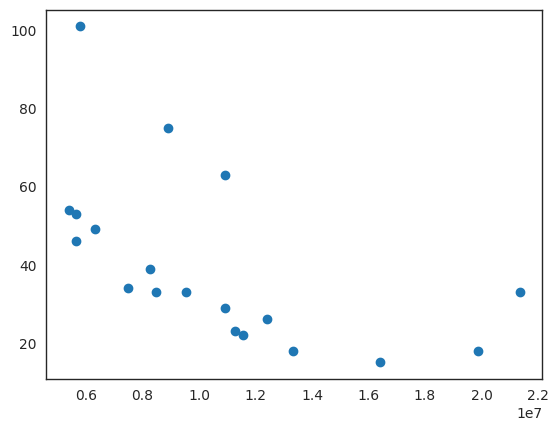

- - - - - - - - 

Normal_gene_pairs_same_module Normal_n_modules
!!! p-value < 0.05: 2.360686378370989e-06 !!!
R: -0.8599195774526
R^2: 0.7394616796862581


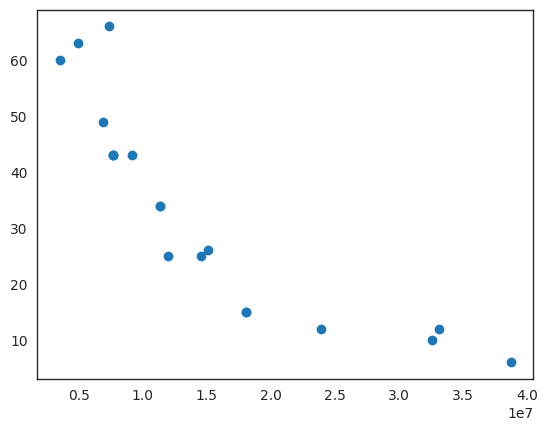

- - - - - - - - 

Normal_LR_pairs_same_module Normal_n_modules
!!! p-value < 0.05: 0.0002640810844065757 !!!
R: -0.7434727692186409
R^2: 0.5527517585696345


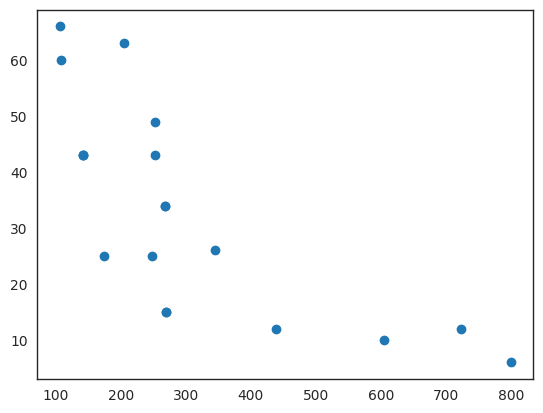

- - - - - - - - 



In [84]:
from scipy.stats import pearsonr


for col1 in metrics:
    for col2 in compare_to:
        if (("Tumor" in col1) & ("Tumor" in col2)) | (("Normal" in col1) & ("Normal" in col2)):
            res = pearsonr(df[col1], df[col2])
            if res.pvalue < 0.05:
                print(col1, col2)
                print(f"!!! p-value < 0.05: {res.pvalue} !!!")
                r = res.statistic
                print(f"R: {r}")
                print(f"R^2: {r**2}")
                plt.scatter(df[col1], df[col2])
                plt.show()
                print("- - - - - - - - ")
                print()



In [86]:
pearsonr(df["Normal_LR_pairs_same_module"], df["Normal_n_modules"])

PearsonRResult(statistic=-0.7434727692186409, pvalue=0.0002640810844065757)

In [87]:
pearsonr(df["Tumor_LR_pairs_same_module"], df["Tumor_n_modules"])

PearsonRResult(statistic=-0.2995424374572069, pvalue=0.2128063699524571)

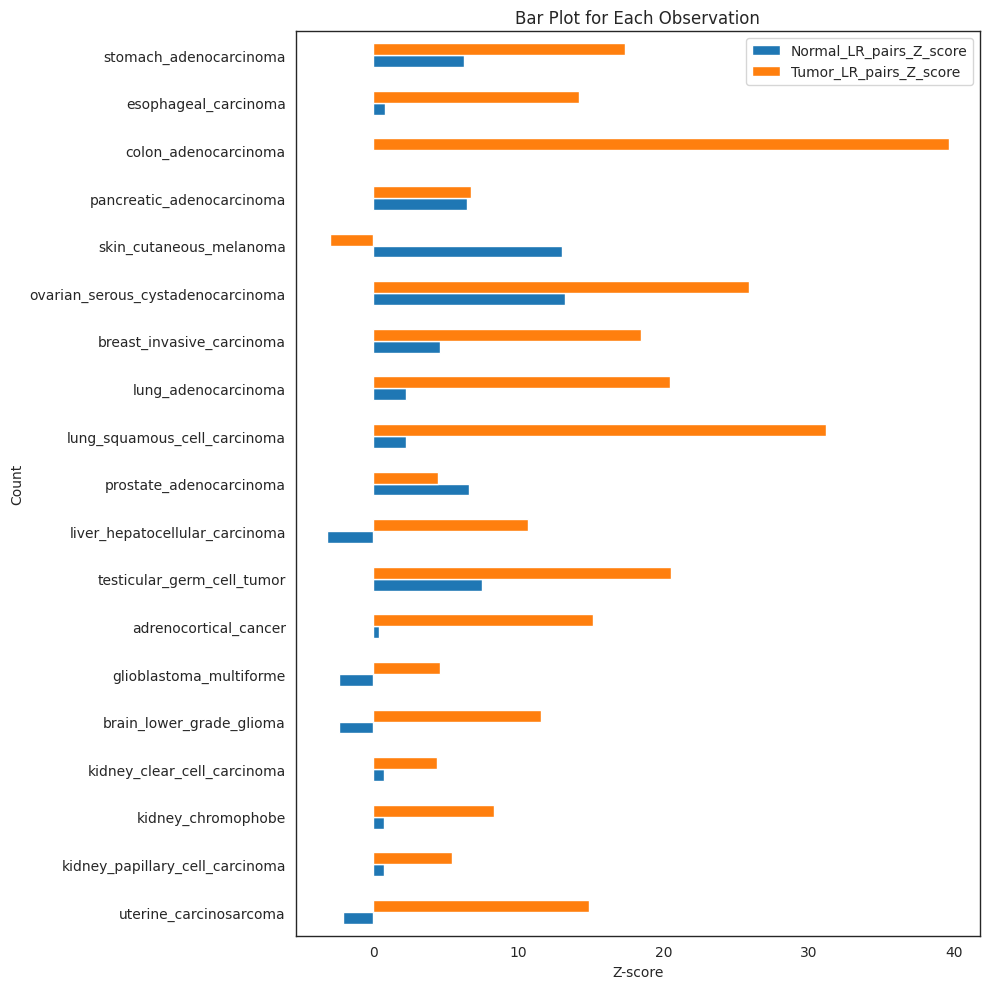

In [9]:
# Plotting
fig, ax = plt.subplots(figsize=(10, 10))
df[["Normal_LR_pairs_Z_score", "Tumor_LR_pairs_Z_score"]].plot(kind='barh', stacked=False, ax=ax)

# Adding labels and title
plt.xlabel('Z-score')
plt.ylabel('Count')
plt.title('Bar Plot for Each Observation')
plt.tight_layout()

In [3]:
df["Tumor_same_module"] = -df["Tumor_same_module"]

In [23]:
df["Tumor_frac"] = df["Tumor_same_module"] / df["Tumor_total"]
df["Normal_frac"] = df["Normal_same_module"] / df["Normal_total"]

In [24]:
df["Difference"] = df["Normal"] + df["Tumor"]

KeyError: 'Normal'

In [ ]:
df.index = df["Name"].values

In [25]:
df["Sum"] = df["Normal_frac"] - df["Tumor_frac"]

In [26]:
df.head(3)

,Name,Tumor_same_module,Normal_same_module,Tumor_total,Normal_total,Tumor_frac,Normal_frac,Sum
uterine_carcinosarcoma,uterine_carcinosarcoma,NaN,NaN,NaN,NaN,NaN,NaN,NaN
kidney_papillary_cell_carcinoma,kidney_papillary_cell_carcinoma,NaN,NaN,NaN,NaN,NaN,NaN,NaN
kidney_chromophobe,kidney_chromophobe,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [27]:
df["RelativeDiff"] =  df["Normal_frac"] + df["Tumor_frac"] / df["Normal_frac"] - df["Tumor_frac"]

In [28]:
# Sort values from lowest to highest 
df.sort_values('Sum', inplace=True) 

ValueError: Axis limits cannot be NaN or Inf

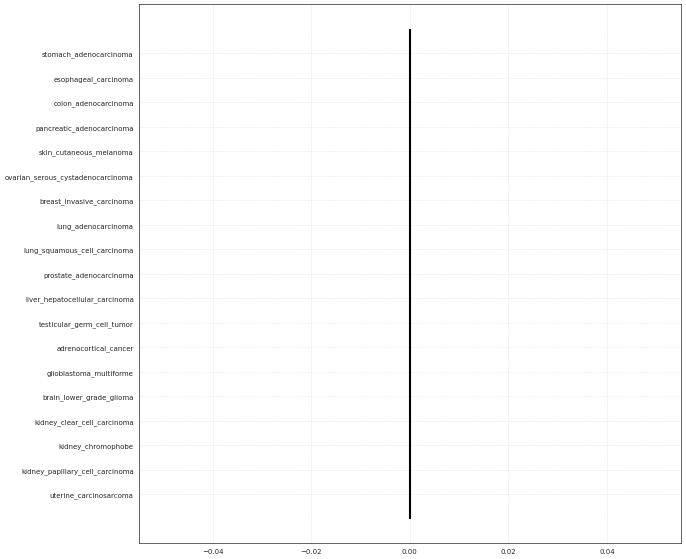

In [29]:
fig, ax = plt.subplots(figsize=(14, 14), dpi=50) 
  
lw = 35
fs = 25
bigfs = 30

# Plotting the horizontal lines 
plt.hlines(y=df.index, xmin=0, xmax=df.Normal_frac, color="#00728eff", linewidth=lw)
plt.hlines(y=df.index, xmin=0, xmax=df.Tumor_frac, color="#b72a3aff", linewidth=lw)
plt.vlines(x=0, ymin=-1, ymax=len(df), color="k", linewidth=3)

plt.grid(linestyle='--', alpha=0.5) 

width = 1.1 * np.max( [-df.Tumor_frac.min(), df.Normal_frac.max()] )

plt.xlim(-width, width)


plt.xticks(fontsize=fs) 
plt.yticks(fontsize=fs)
plt.xlabel("Fraction of LR pairs in same module", fontsize=fs)

plt.text(-width/2, len(df), "Tumor_frac", horizontalalignment='center', verticalalignment='center',fontsize=bigfs)
plt.text(+width/2, len(df), "Normal_frac", horizontalalignment='center', verticalalignment='center',fontsize=bigfs)

plt.tight_layout()

plt.savefig("/home/lnemati/barplot.png")

plt.show()

In [13]:
import liana as li

In [128]:
li.resource.select_resource("cellphonedb")

,ligand,receptor
13085,JAG2,NOTCH1
13086,DLL1,NOTCH1
13087,IGF1,IGF1R
13088,JAG1,NOTCH1
13089,WNT5A,FZD2
...,...,...
14303,WNT1,CD36
14304,OGN,HLA-DRB1
14305,CCL4L1,PGRMC2
14306,TNFSF9,KLRG2


In [4]:
# GNAZ

In [33]:
hcc = PyWGCNA.readWGCNA('/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/liver/tumor/liver_hepatocellular_carcinoma/wgcna_liver_hepatocellular_carcinoma.p')

Reading wgcna_liver_hepatocellular_carcinoma WGCNA done!


In [34]:
degr = pd.read_csv('/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/liver/tumor/liver_hepatocellular_carcinoma/degree_df.csv.gz', index_col=0)

In [35]:
module = hcc.datExpr.var.moduleLabels.loc['GNAZ']

In [36]:
genes = hcc.datExpr.var[hcc.datExpr.var.moduleLabels == module].index

In [37]:
df = degr.loc[genes].sort_values(by='intramodular_degree', ascending=False)
df['rank'] = range(0, len(df))

In [38]:
df.loc['GNAZ']

degree                    0.326945
intramodular_degree       0.103043
module                    0.000000
rank                   1307.000000
Name: GNAZ, dtype: float64

In [46]:
with open('/home/lnemati/scrnaseq_hcc/results/combined/wgcna/gnaz_module.txt', 'w') as outf:
    outf.write('\n'.join(str(i) for i in df.index))

# Explore WGCNA results

In [2]:
# Let's use Normal Pancreas VS Pancreatic Adenocarcinoma as an example
pancreas_dir = "/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/pancreas/"

path_normal = os.path.join(pancreas_dir, "normal/WGCNA_pancreas.p")
WGCNA_n = PyWGCNA.readWGCNA(path_normal)

path_tumor = os.path.join(pancreas_dir, "tumor/pancreatic_adenocarcinoma/WGCNA_pancreatic_adenocarcinoma.p")
WGCNA_t = PyWGCNA.readWGCNA(path_tumor)

Reading WGCNA_pancreas WGCNA done!
Reading WGCNA_pancreatic_adenocarcinoma WGCNA done!


In [89]:
genes = WGCNA_n.datExpr.var[WGCNA_n.datExpr.var["moduleLabels"] == 2].index.tolist()

In [90]:
dc.run_ora(
    mat=genes,
    net=msigdb,
    source='geneset',
    target='genesymbol',
    verbose=True
)

NameError: name 'dc' is not defined

In [62]:
import gseapy as gp

In [134]:
genes = WGCNA_t.datExpr.var[WGCNA_t.datExpr.var.moduleLabels == 1].symbol

In [135]:
enr = gp.enrichr(
    gene_list=genes,
    gene_sets='Reactome_2022',
    organism="Human",
    #outdir=f"{self.outputPath}figures/{type}/{file_name}",
    cutoff=0.05,
)

enr = enr.results
enr = enr[enr['Adjusted P-value'] < 0.05]

In [5]:
liver_dir = "/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/liver/"

path_normal = os.path.join(liver_dir, "normal/WGCNA_liver.p")
WGCNA_n = PyWGCNA.readWGCNA(path_normal)

path_tumor = os.path.join(liver_dir, "tumor/liver_hepatocellular_carcinoma/WGCNA_liver_hepatocellular_carcinoma.p")
WGCNA_t = PyWGCNA.readWGCNA(path_tumor)

Reading WGCNA_liver WGCNA done!
Reading WGCNA_liver_hepatocellular_carcinoma WGCNA done!


Mean value of TOM:
All genes:    0.00034
LR pairs:    0.00064


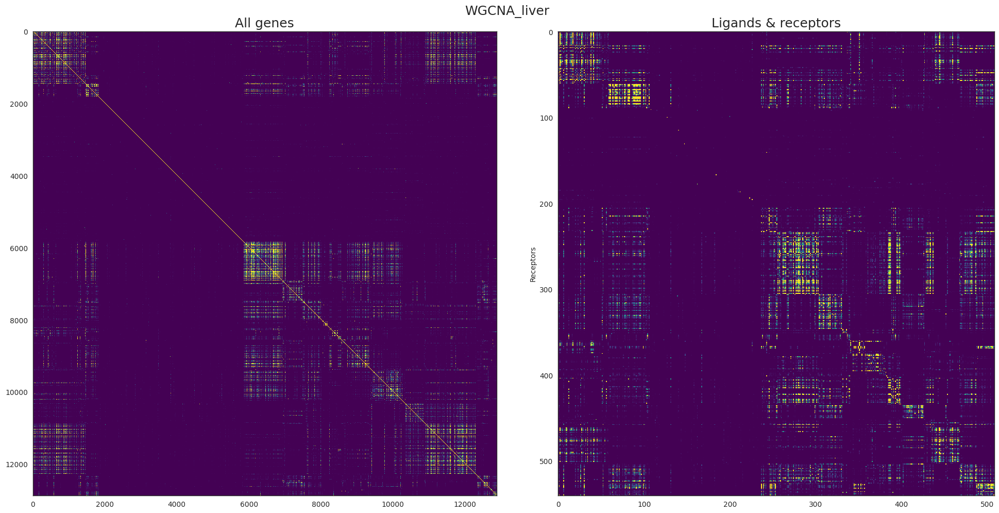

Mean value of TOM:
All genes:    0.00178
LR pairs:    0.00868


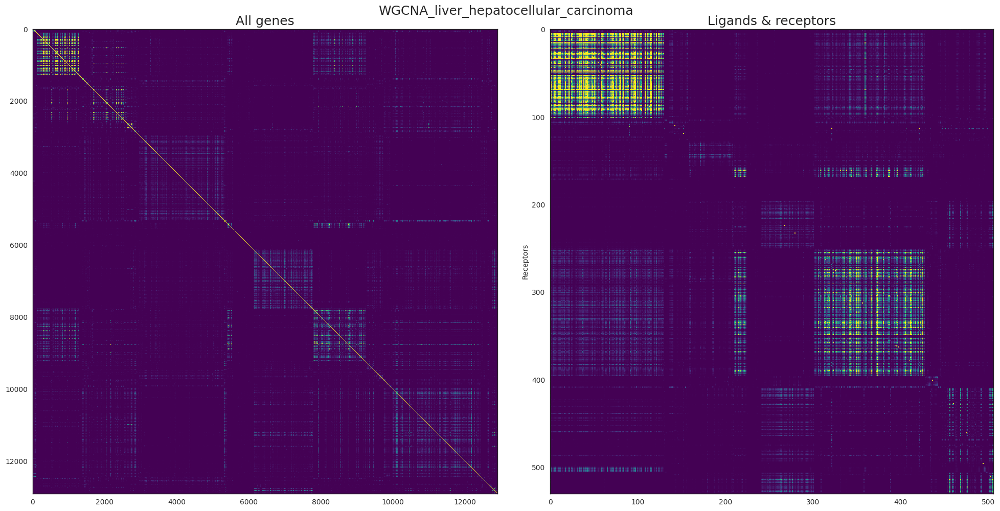

In [6]:
resource = pd.read_csv("/projects/bioinformatics/DB/CellCellCommunication/LianaResources/consensus.csv")
#resource = pd.read_csv("/projects/bioinformatics/DB/CellCellCommunication/LianaResources/cellphonedb.csv")
lr_genes = set(resource["ligand"]).union(resource["receptor"])

fs = 18
cmap='viridis'

for WGCNA in WGCNA_n, WGCNA_t:
    
    ordered = WGCNA.datExpr.var.sort_values(by="moduleLabels").index
    tom_all = WGCNA.TOM.loc[ordered, ordered]
    
    ligands_ordered = ordered[ordered.isin(resource["ligand"])]
    receptors_ordered = ordered[ordered.isin(resource["receptor"])]
    tom_lr = WGCNA.TOM.loc[ligands_ordered, receptors_ordered]
    
    print("Mean value of TOM:")
    mean_all = np.mean(tom_all.values[np.triu_indices(n=tom_all.shape[0], k=1)])
    mean_lr = np.mean(tom_lr.values[np.triu_indices(n=tom_lr.shape[0], k=1, m=tom_lr.shape[1])])

    print("All genes:    {:.5f}".format(mean_all))
    print("LR pairs:    {:.5f}".format(mean_lr))
    
    fig, ax = plt.subplots(1,2, figsize=(20,10))
    
    fig.suptitle(WGCNA.name, fontsize=fs)
    
    vmax = np.percentile(tom_lr, 99)
    vmin = 0
    cax = ax[0].imshow(tom_all, cmap=cmap, interpolation='none', vmin=vmin, vmax=vmax)
    ax[0].set_title("All genes", fontsize=fs)
    
    cax = ax[1].imshow(tom_lr, cmap=cmap, interpolation='none', vmin=vmin, vmax=vmax)
    ax[1].set_title("Ligands & receptors", fontsize=fs)
    ax[1].set_ylabel("Ligands")
    ax[1].set_ylabel("Receptors")
    
    plt.tight_layout()    
    plt.show()

In [ ]:
all_pairs.d

In [36]:
all_pairs.shape

(166745569, 2)

In [46]:
all_pairs = pd.DataFrame(
    WGCNA.TOM.where(
        np.tri(
            WGCNA.TOM.shape[0],
            dtype=bool,
            k=-1
        ),
        np.nan
    ).stack(dropna=True, sort=True), columns=["TOM"]
)

In [65]:
WGCNA.TOM.iloc[:5,:5]

,RAB4B,TIGAR,RNF44,RPL23A,ARL8B
RAB4B,1.000000e+00,0.000017,2.728838e-07,0.029141,0.000015
TIGAR,1.712677e-05,1.000000,1.206204e-04,0.000006,0.000012
RNF44,2.728838e-07,0.000121,1.000000e+00,0.000018,0.000064
RPL23A,2.914066e-02,0.000006,1.754604e-05,1.000000,0.000066
ARL8B,1.529344e-05,0.000012,6.381174e-05,0.000066,1.000000


In [72]:
all_ligands_and_receptors = set(resource["ligand"]).union(resource["receptor"])

In [76]:
all_pairs.index.isin(all_ligands_and_receptors)

0

In [81]:
valid_rows = resource[(resource['ligand'].isin(allgenes)) & (resource['receptor'].isin(allgenes))]



In [78]:
all_pairs[
    all_pairs.index.get_level_values(0).isin(all_ligands_and_receptors) |
    all_pairs.index.get_level_values(1).isin(all_ligands_and_receptors)
]

TOM
IL32   RAB4B      3.573207e-03
       TIGAR      6.693785e-05
       RNF44      1.635897e-06
       RPL23A     5.212802e-03
       ARL8B      3.686519e-06
...                        ...
PPP6R1 TPSAB1     4.515497e-06
       TNFRSF11A  2.566904e-04
       EPHB6      7.349381e-05
       GCGR       3.474937e-07
       TIMP1      6.082795e-04

[12436323 rows x 1 columns]

In [69]:
np.isin(all_pairs.index, resource["ligand"])

KeyboardInterrupt: 

In [68]:
all_pairs.index.isin(resource["ligand"])

array([False, False, False, ..., False, False, False])

In [ ]:
all_pairs.index

In [62]:
all_pairs.index.get_level_values(1)

Index(['RAB4B', 'RAB4B', 'TIGAR', 'RAB4B', 'TIGAR', 'RNF44', 'RAB4B', 'TIGAR',
       'RNF44', 'RPL23A',
       ...
       'CNDP2', 'ELAVL1', 'RBAK', 'ARHGAP21', 'DDX47', 'POMZP3', 'EIF5B',
       'KIF16B', 'CYP4F2', 'BATF3'],
      dtype='object', length=83366328)

In [7]:
# flatten TOM matrix
#all_pairs = pd.DataFrame(WGCNA.TOM.stack(dropna=True, sort=True), columns=["TOM"])
all_pairs = pd.DataFrame(WGCNA.TOM.stack(dropna=True, sort=True), columns=["TOM"])

allgenes = set(all_pairs.index.get_level_values(0))

all_pairs["LR Pair"] = False

# Identify rows where both ligand and receptor are present in allgenes
valid_rows = resource[(resource['ligand'].isin(allgenes)) & (resource['receptor'].isin(allgenes))]

# Set "LR Pair" to True for the valid rows using loc and the index
all_pairs.loc[list(zip(valid_rows['ligand'], valid_rows['receptor'])), "LR Pair"] = True

In [44]:
all_pairs.shape #old

(166745569, 2)

In [12]:
all_lr_combinations = all_pairs.loc[
    all_pairs.index.get_level_values(0).isin(resource["ligand"]) & \
    all_pairs.index.get_level_values(1).isin(resource["receptor"]) \
]

In [18]:
all_lr_combinations.shape

(268686, 2)

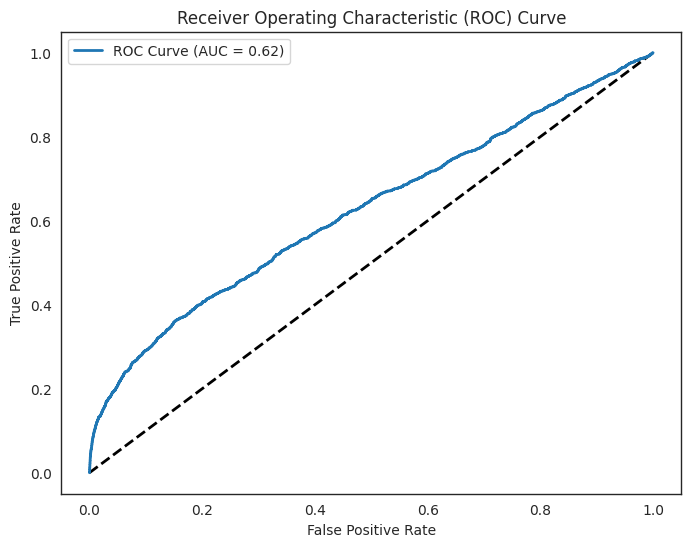

In [74]:
# Assuming df is your dataframe with columns "TOM" and "LR Pair"
# X is the feature (TOM) and y is the target variable (LR Pair)
X = all_pairs['TOM']
y = all_pairs['LR Pair']

# Calculate ROC curve for different thresholds
fpr, tpr, thresholds = roc_curve(y, X)

# Calculate AUC (Area Under the Curve)
roc_auc = roc_auc_score(y, X)

# Plot ROC curve and include AUC in the legend
plt.figure(figsize=(8, 6))
plt.plot([0, 1], [0, 1], color='k', linestyle='--', lw=2)
plt.plot(fpr, tpr, color='C0', lw=2, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

In [45]:
tom_all = tom_all.values
tom_all_flat = tom_all[np.triu_indices(tom_all.shape[0], k=1)]

tom_lr  = tom_lr.loc[tom_lr.index.isin(resource["ligand"]), tom_lr.columns.isin(resource["receptor"])]

AttributeError: 'numpy.ndarray' object has no attribute 'values'

In [46]:
new_tom_lr = resource.copy()
new_tom_lr['tom_lr_values'] = np.nan

for index, row in new_tom_lr.iterrows():
    ligand = row['ligand']
    receptor = row['receptor']
    
    if (ligand in tom_lr.index) & (receptor in tom_lr.columns):

        # Access the corresponding value from tom_lr
        value = tom_lr.loc[ligand, receptor]

        # Assign the value to the 'tom_lr_values' column in new_tom_lr
        new_tom_lr.at[index, 'tom_lr_values'] = value
        


In [50]:
np.median(new_tom_lr.dropna()["tom_lr_values"])

0.0013369267686109748

In [51]:
np.median(tom_all_flat)

0.0005624204163595901

In [43]:
np.mean(tom_lr_flat)

nan

In [41]:
tom_lr_flat = new_tom_lr["tom_lr_values"].values

In [44]:
tom_lr_flat

array([0.00054969, 0.01410266, 0.00544349, ..., 0.03450438,        nan,
              nan])

In [204]:
sum(tom_lr_flat > 0.01)

443

In [13]:
import seaborn as sns

In [56]:
import matplotlib.pyplot as plt

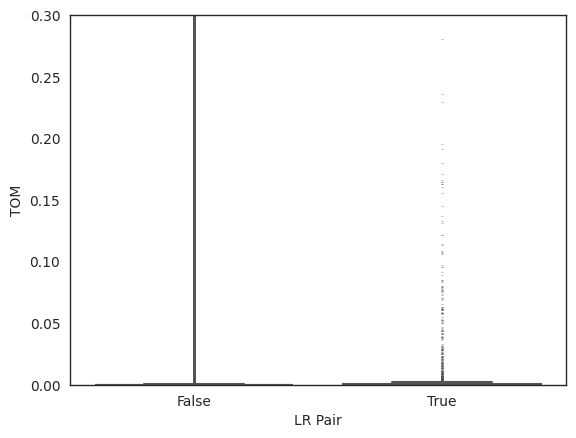

In [25]:
sns.boxplot(
    x='LR Pair',
    y='TOM',
    data=all_pairs,
    palette='muted',
    fliersize=0.1,
    #cut=0,
)

plt.ylim(0, 0.3)
plt.show()

In [31]:
import seaborn as sns

In [34]:
# Create separate DataFrames for tom_all and tom_lr
df_tom_all = pd.DataFrame({'Value': tom_all_flat, 'Matrix': 'tom_all'})
df_tom_lr = pd.DataFrame({'Value': tom_lr_flat, 'Matrix': 'tom_lr'})

# Concatenate the DataFrames vertically
data = pd.concat([df_tom_all, df_tom_lr], ignore_index=True)

# Create a violin plot using Seaborn
plt.figure(figsize=(10, 6))
sns.boxplot(
    x='Matrix',
    y='Value',
    data=data,
    palette='muted',
    #fliersize=0,
    #cut=0,
)

plt.ylim(0, 0.2)
plt.title('Topological Overlap Measure')
plt.show()

NameError: name 'tom_all_flat' is not defined

In [ ]:
# Exclude diagonal elements
np.fill_diagonal(tom_all, np.nan)
np.fill_diagonal(tom_lr, np.nan)

# Create separate DataFrames for tom_all and tom_lr
df_tom_all = pd.DataFrame(tom_all.flatten(), columns=['Value'])
df_tom_all['Matrix'] = 'tom_all'

df_tom_lr = pd.DataFrame(tom_lr.flatten(), columns=['Value'])
df_tom_lr['Matrix'] = 'tom_lr'

# Concatenate the DataFrames vertically
data = pd.concat([df_tom_all, df_tom_lr], ignore_index=True)

# Create a violin plot using Seaborn
plt.figure(figsize=(10, 6))
sns.violinplot(
    x='Matrix',
    y='Value',
    data=data,
    palette='muted',
    #fliersize=0,
    cut=0,
)
plt.title('Topological Overlap Measure')
plt.show()

In [34]:
toms = pd.DataFrame({
    "All genes": tom_all.values.flatten(),
})

toms["LR Pairs"] = np.nan
toms["LR Pairs"].iloc[:len(tom_lr.values.flatten())] = tom_lr.values.flatten()

In [ ]:
sns.violinplot(toms)

In [ ]:
sns.load_dataset("titanic").head()

In [79]:
import random

In [80]:
def generate_unique_random_pairs(k, N):
    if k > N * (N - 1) // 2:
        raise ValueError("Cannot generate more unique pairs than the total number of possible pairs.")

    pairs = set()

    while len(pairs) < k:
        pair = tuple(random.sample(range(N), 2))
        pairs.add(pair)

    return list(pairs)

def check_pairs(series, pairs):
    result = []

    for pair in pairs:
        index1, index2 = pair
        value1 = series.iloc[index1]
        value2 = series.iloc[index2]

        result.append(value1 == value2)

    return result

In [81]:
def calculate_observed_expected(WGCNA_object, k):
    N = len(WGCNA_object.datExpr.var)
    
    # Generate random pairs
    random_pairs = generate_unique_random_pairs(k, N)
    
    # Calculate observed values
    observed_result = check_pairs(WGCNA_object.datExpr.var.moduleColors, random_pairs)
    observed_result = pd.Series(observed_result)
    
    print("Observed:")
    print(observed_result.value_counts() / k)
    
    # Calculate expected values
    probs = WGCNA_object.datExpr.var.moduleColors.value_counts() / WGCNA_object.datExpr.var.shape[0]
    tot = 0
    for c1 in probs.index:
        tot += probs[c1] * (WGCNA_object.datExpr.var.moduleColors.value_counts()[c1] - 1) / (WGCNA_object.datExpr.var.shape[0] -1)
    
    print("Expected:")
    print(tot)

In [84]:
def expected_frac_same_module(WGCNA_object):
    N = len(WGCNA_object.datExpr.var)
    
    # Calculate expected values
    probs = WGCNA_object.datExpr.var.moduleColors.value_counts() / WGCNA_object.datExpr.var.shape[0]
    tot = 0
    for c1 in probs.index:
        tot += probs[c1] * (WGCNA_object.datExpr.var.moduleColors.value_counts()[c1] - 1) / (WGCNA_object.datExpr.var.shape[0] -1)
    
    return tot

In [97]:
cpdb_n = pd.read_csv(os.path.join(pancreas_dir, "normal/cellphonedb_interactions.csv"))
cpdb_t = pd.read_csv(os.path.join(pancreas_dir, "tumor/pancreatic_adenocarcinoma/cellphonedb_interactions.csv"))

In [99]:
exp_n = expected_frac_same_module(WGCNA_normal)*cpdb_n.shape[0]
exp_t = expected_frac_same_module(WGCNA_tumor)*cpdb_t.shape[0]

In [102]:
exp_t

33.15260412032569

In [100]:
df.loc["pancreatic_adenocarcinoma"]

Name            pancreatic_adenocarcinoma
Tumor                                 -56
Normal                                 25
Difference                            -31
Sum                                    81
RelativeDiff                        78.76
Name: pancreatic_adenocarcinoma, dtype: object

In [82]:
# Example usage:
k = 1e6  # Number of unique pairs
calculate_observed_expected(WGCNA_normal, k)

Observed:
False    0.938841
True     0.061159
Name: count, dtype: float64
Expected:
0.061459809206494236


In [83]:
# Example usage:
k = 1e6  # Number of unique pairs
calculate_observed_expected(WGCNA_tumor, k)

Observed:
False    0.90364
True     0.09636
Name: count, dtype: float64
Expected:
0.0963738491869933


In [28]:
WGCNA_normal.datExpr.shape

(167, 13428)

In [30]:
WGCNA_tumor.datExpr.shape

(178, 14635)

In [19]:
WGCNA_normal.datExpr.var.top_50pct_variable.value_counts()

top_50pct_variable
True     7789
False    7625
Name: count, dtype: int64

In [9]:
WGCNA_tumor.datExpr.var

,ensembl,symbol,MAD,top_50pct_variable,top_50pct_variable_in_tissue,dynamicColors,moduleColors,moduleLabels
RAB4B,ENSG00000167578,RAB4B,1.0569,False,True,dimgrey,dimgrey,3
TIGAR,ENSG00000078237,TIGAR,1.3634,False,True,gainsboro,gainsboro,5
RNF44,ENSG00000146083,RNF44,0.5941,False,False,gainsboro,gainsboro,5
DNAH3,ENSG00000158486,DNAH3,3.0484,True,True,indianred,indianred,6
RPL23A,ENSG00000198242,RPL23A,0.4619,False,False,gainsboro,gainsboro,5
...,...,...,...,...,...,...,...,...
KIF16B,ENSG00000089177,KIF16B,0.8554,False,True,gainsboro,gainsboro,5
CYP4F2,ENSG00000186115,CYP4F2,1.5536,True,True,firebrick,firebrick,4
TENM1,ENSG00000009694,TENM1,0.9653,True,True,darkred,darkred,2
BATF3,ENSG00000123685,BATF3,1.5689,True,True,lightgrey,lightgrey,8


In [17]:
WGCNA_normal.datExpr.var.moduleColors.value_counts()

moduleColors
silver    7697
black      270
Name: count, dtype: int64

In [15]:
WGCNA_tumor.datExpr.var.moduleColors.value_counts()

moduleColors
darkgrey      2917
dimgrey       2152
gainsboro      976
black          568
white          518
salmon         404
lightcoral     221
firebrick      216
coral          190
silver         153
lightgrey      138
mistyrose      132
indianred      111
darkred         96
red             87
tomato          79
brown           62
darksalmon      56
Name: count, dtype: int64

In [29]:
comparison.jaccard_similarity.head(5)

,Pancreas:gainsboro,Pancreas:dimgrey,Pancreas:lightgrey,Pancreas:black,Pancreas:rosybrown,Pancreas:silver,Pancreatic Adenocarcinoma:coral,Pancreatic Adenocarcinoma:firebrick,Pancreatic Adenocarcinoma:darkgrey,Pancreatic Adenocarcinoma:lightcoral,Pancreatic Adenocarcinoma:orangered,Pancreatic Adenocarcinoma:maroon,Pancreatic Adenocarcinoma:sienna,Pancreatic Adenocarcinoma:darksalmon,Pancreatic Adenocarcinoma:tomato,Pancreatic Adenocarcinoma:lightsalmon,Pancreatic Adenocarcinoma:seashell,Pancreatic Adenocarcinoma:chocolate,Pancreatic Adenocarcinoma:black,Pancreatic Adenocarcinoma:red
Pancreas:gainsboro,1.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.007051,0.006301,0.123548,0.001266,0.000000,0.003268,0.003812,0.004902,0.003273,0.003571,0.012570,0.000000,0.000000
Pancreas:dimgrey,0.0,1.0,0.0,0.0,0.0,0.0,0.131135,0.427354,0.131437,0.090392,0.001656,0.037268,0.000000,0.007726,0.000000,0.000229,0.000000,0.000680,0.000381,0.000000
Pancreas:lightgrey,0.0,0.0,1.0,0.0,0.0,0.0,0.028143,0.140286,0.138881,0.087693,0.013782,0.017055,0.003217,0.020820,0.004508,0.004510,0.001732,0.008211,0.006883,0.001079
Pancreas:black,0.0,0.0,0.0,1.0,0.0,0.0,0.011834,0.021617,0.020751,0.019158,0.004762,0.017286,0.001502,0.004768,0.000000,0.001504,0.001629,0.002577,0.000000,0.000000
Pancreas:rosybrown,0.0,0.0,0.0,0.0,1.0,0.0,0.000000,0.000084,0.008937,0.003655,0.005831,0.000000,0.000000,0.036145,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [10]:
#LIVER
liver_dir = "/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/Liver/"

path_normal = os.path.join(liver_dir, "normal/Liver/Liver.p")
WGCNA_normal = PyWGCNA.readWGCNA(path_normal)

path_tumor = os.path.join(liver_dir, "tumor/Liver Hepatocellular Carcinoma/Liver Hepatocellular Carcinoma.p")
WGCNA_tumor = PyWGCNA.readWGCNA(path_tumor)

Reading Liver WGCNA done!
Reading Liver Hepatocellular Carcinoma WGCNA done!


In [10]:
WGCNA_normal.datExpr.var.moduleColors.unique()

array(['lightgrey', 'darkgrey', 'black', 'gainsboro'], dtype=object)

In [17]:
WGCNA_tumor.datExpr.var

,ensembl,symbol,MAD,top_50pct_variable,top_50pct_variable_in_tissue,dynamicColors,moduleColors,moduleLabels
TIGAR,ENSG00000078237,TIGAR,0.755400,False,True,dimgrey,dimgrey,1
DNAH3,ENSG00000158486,DNAH3,3.459384,True,True,white,white,8
CALB2,ENSG00000172137,CALB2,1.898200,True,True,firebrick,firebrick,2
DACH1,ENSG00000276644,DACH1,1.385700,True,True,gainsboro,gainsboro,3
FMO2,ENSG00000094963,FMO2,1.434100,True,True,silver,silver,6
...,...,...,...,...,...,...,...,...
SLCO4C1,ENSG00000173930,SLCO4C1,2.439900,True,True,gainsboro,gainsboro,3
KIF16B,ENSG00000089177,KIF16B,0.617700,False,True,dimgrey,dimgrey,1
CYP4F2,ENSG00000186115,CYP4F2,0.974900,True,True,gainsboro,gainsboro,3
TENM1,ENSG00000009694,TENM1,2.494200,True,True,gainsboro,gainsboro,3


In [13]:
cpdb = pd.read_csv("/projects/bioinformatics/DB/decoupler/CellPhoneDB/CellPhoneDB.csv.gz")

In [16]:
cpdb

,genesymbol,integrin,peripheral,receptor,receptor_class,secreted,secreted_class,transmembrane
0,ESR1,False,True,True,receptor,False,NaN,False
1,RORB,False,False,True,receptor,False,NaN,False
2,ABCA1,False,False,False,NaN,False,NaN,True
3,NR1H3,False,False,True,receptor,False,NaN,False
4,NR3C1,False,False,True,receptor,False,NaN,False
...,...,...,...,...,...,...,...,...
1349,SLC32A1,False,False,False,NaN,False,NaN,False
1350,VSIR,False,False,True,receptor,False,NaN,True
1351,SLC18A1,False,False,False,NaN,False,NaN,False
1352,SLC18A2,False,False,False,NaN,False,NaN,False


In [3]:
import scanpy as sc

In [4]:
adata = sc.read_h5ad("/projects/bioinformatics/DB/Xena/TCGA_GTEX/TCGA_GTEX.h5ad")

In [5]:
rename = {
    "X_study": "study",
    "X_gender": "gender",
    "X_sample_type": "type",
    "X_primary_site": "tissue",
    "primary_disease_or_tissue": "condition"
}

adata.obs.rename(columns=rename, inplace=True)
adata.obs

,detailed_category,condition,tissue,type,gender,study
GTEX-1117F-0226-SM-5GZZ7,Adipose - Subcutaneous,Adipose - Subcutaneous,Adipose Tissue,Normal Tissue,Female,GTEX
GTEX-1117F-0426-SM-5EGHI,Muscle - Skeletal,Muscle - Skeletal,Muscle,Normal Tissue,Female,GTEX
GTEX-1117F-0526-SM-5EGHJ,Artery - Tibial,Artery - Tibial,Blood Vessel,Normal Tissue,Female,GTEX
GTEX-1117F-0626-SM-5N9CS,Artery - Coronary,Artery - Coronary,Blood Vessel,Normal Tissue,Female,GTEX
GTEX-1117F-0726-SM-5GIEN,Heart - Atrial Appendage,Heart - Atrial Appendage,Heart,Normal Tissue,Female,GTEX
...,...,...,...,...,...,...
TCGA-ZS-A9CG-01,Liver Hepatocellular Carcinoma,Liver Hepatocellular Carcinoma,Liver,Primary Tumor,Male,TCGA
TCGA-ZT-A8OM-01,Thymoma,Thymoma,Thymus,Primary Tumor,Female,TCGA
TCGA-ZU-A8S4-01,Cholangiocarcinoma,Cholangiocarcinoma,Bile duct,Primary Tumor,Male,TCGA
TCGA-ZU-A8S4-11,Cholangiocarcinoma,Cholangiocarcinoma,Bile duct,Solid Tissue Normal,Male,TCGA


In [12]:
adata[adata.obs['tissue'] == 'Cervix Uteri'].obs.condition.value_counts()

Cervix - Ectocervix    6
Cervix - Endocervix    4
Name: condition, dtype: int64

In [6]:
adata[adata.obs.isna().sum(axis=1) > 0, :].obs

,detailed_category,condition,tissue,type,gender,study
GTEX-YEC3-1426-101806-SM-5PNXX,Stomach,Stomach,NaN,Normal Tissue,Male,GTEX
GTEX-YEC3-2526-101809-SM-5CVLT,Esophagus - Mucosa,Esophagus - Mucosa,NaN,Normal Tissue,Male,GTEX
GTEX-YEC4-1026-101814-SM-5P9FX,Esophagus - Mucosa,Esophagus - Mucosa,NaN,Normal Tissue,Male,GTEX
GTEX-YFC4-0126-101855-SM-5CVLZ,Skin - Sun Exposed (Lower Leg),Skin - Sun Exposed (Lower Leg),NaN,Normal Tissue,Female,GTEX
TCGA-06-0675-11,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Solid Tissue Normal,NaN,TCGA
TCGA-06-0678-11,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Solid Tissue Normal,NaN,TCGA
TCGA-06-0680-11,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Solid Tissue Normal,NaN,TCGA
TCGA-06-0681-11,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Solid Tissue Normal,NaN,TCGA
TCGA-06-AABW-11,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Solid Tissue Normal,NaN,TCGA
TCGA-07-0249-20,NaN,NaN,NaN,Control Analyte,NaN,TCGA


In [ ]:
add_tissues = {
    'Esophagus - Mucosa': 'Esophagus',
    'Stomach': 'Stomach',
    'Skin - Sun Exposed (Lower Leg)': 'Skin'
}

for k, v in add_tissues.items():
    adata.obs.loc[np.logical_and(adata.obs["tissue"].isna(), adata.obs["condition"] == k), "tissue"] = v
    print(f"Added tissue {v} to samples with condition {k}")

In [161]:
adata[adata.obs.isna().sum(axis=1) > 0, :].obs

,detailed_category,condition,tissue,type,gender,study
TCGA-06-0675-11,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Solid Tissue Normal,NaN,TCGA
TCGA-06-0678-11,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Solid Tissue Normal,NaN,TCGA
TCGA-06-0680-11,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Solid Tissue Normal,NaN,TCGA
TCGA-06-0681-11,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Solid Tissue Normal,NaN,TCGA
TCGA-06-AABW-11,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Solid Tissue Normal,NaN,TCGA
TCGA-07-0249-20,NaN,NaN,NaN,Control Analyte,NaN,TCGA
TCGA-28-2510-01,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Primary Tumor,NaN,TCGA
TCGA-2G-AAKO-01,Testicular Germ Cell Tumor,Testicular Germ Cell Tumor,Testis,Primary Tumor,NaN,TCGA
TCGA-2G-AAKO-05,Testicular Germ Cell Tumor,Testicular Germ Cell Tumor,Testis,Additional - New Primary,NaN,TCGA
TCGA-2G-AALF-01,Testicular Germ Cell Tumor,Testicular Germ Cell Tumor,Testis,Primary Tumor,NaN,TCGA


In [12]:
adata[adata.obs.detailed_category == 'Esophagus - Mucosa'].obs.tissue.value_counts

Stomach    174
NaN          1
Name: tissue, dtype: int64

Esophagus    271
Name: tissue, dtype: int64

In [4]:
adata

AnnData object with n_obs × n_vars = 18305 × 60498
    obs: 'detailed_category', 'primary_disease_or_tissue', 'X_primary_site', 'X_sample_type', 'X_gender', 'X_study'
    layers: 'TPM', 'raw_counts'

In [15]:
is_in_tcga = adata.obs["X_study"] == "TCGA"

In [ ]:
adata = adata[is_in_tcga]

In [ ]:
ad

In [18]:
adata[is_in_tcga].obs

,detailed_category,primary_disease_or_tissue,X_primary_site,X_sample_type,X_gender,X_study
TCGA-02-0047-01,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Primary Tumor,Male,TCGA
TCGA-02-0055-01,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Primary Tumor,Female,TCGA
TCGA-02-2483-01,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Primary Tumor,Male,TCGA
TCGA-02-2485-01,Glioblastoma Multiforme,Glioblastoma Multiforme,Brain,Primary Tumor,Male,TCGA
TCGA-04-1331-01,Ovarian Serous Cystadenocarcinoma,Ovarian Serous Cystadenocarcinoma,Ovary,Primary Tumor,Female,TCGA
...,...,...,...,...,...,...
TCGA-ZS-A9CG-01,Liver Hepatocellular Carcinoma,Liver Hepatocellular Carcinoma,Liver,Primary Tumor,Male,TCGA
TCGA-ZT-A8OM-01,Thymoma,Thymoma,Thymus,Primary Tumor,Female,TCGA
TCGA-ZU-A8S4-01,Cholangiocarcinoma,Cholangiocarcinoma,Bile duct,Primary Tumor,Male,TCGA
TCGA-ZU-A8S4-11,Cholangiocarcinoma,Cholangiocarcinoma,Bile duct,Solid Tissue Normal,Male,TCGA


In [148]:
#tissue = 'blood'
path = f'/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/{tissue}/normal/{tissue}.h5ad'

#path = f'/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/eye/tumor/uveal_melanoma/uveal_melanoma.h5ad'
#path = f'/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/pancreas/tumor/pancreatic_adenocarcinoma/pancreatic_adenocarcinoma.h5ad'
#path = f'/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/liver/tumor/liver_hepatocellular_carcinoma/liver_hepatocellular_carcinoma.h5ad'



adata = sc.read_h5ad(path)
adata.shape

(548, 14069)

std: Found 7 outlier
mad: Found 99 outlier


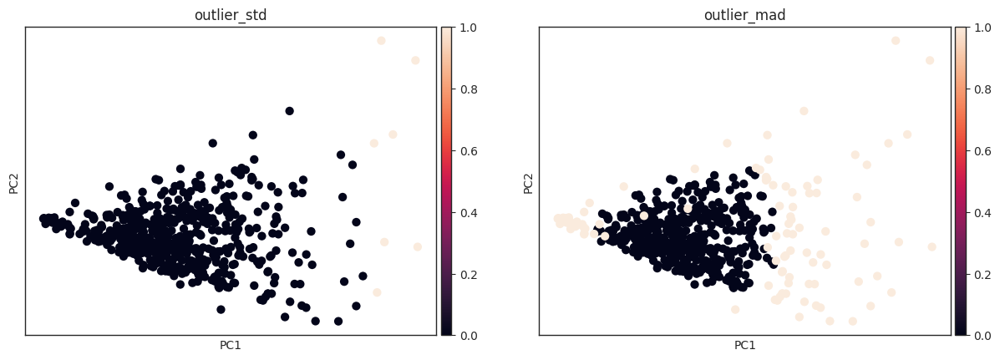

In [149]:
adata.X = adata.layers["deseq2_norm_counts"]

# Calculate PCA
sc.pp.pca(adata, n_comps=10, use_highly_variable=False) 

# Calculate centroid of the PCA using median
centroid = np.median(adata.obsm["X_pca"], axis=0)

# Calculate distance from centroid
adata.obs["pca_distance"] = np.linalg.norm(adata.obsm["X_pca"] - centroid, axis=1)

# Remove samples that are more than 5 standard deviations away from the median
std = np.std(adata.obs["pca_distance"])
mad = np.median(np.abs(adata.obs["pca_distance"] - np.median(adata.obs["pca_distance"])))
n = 5

print("std: Found {} outlier".format(len(adata.obs[adata.obs["pca_distance"] > n*std])))
adata.obs['outlier_std'] = np.where(adata.obs["pca_distance"] > n * std, 1, 0)
print("mad: Found {} outlier".format(len(adata.obs[adata.obs["pca_distance"] > n*mad])))
adata.obs['outlier_mad'] = np.where(adata.obs["pca_distance"] > n * mad, 1, 0)

#adata = adata[adata.obs["pca_distance"] <= 3 * mad]

sc.pl.pca(adata, color=['outlier_std', 'outlier_mad'])

# Sankey

In [127]:
pancreas_dir = "/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/pancreas"

nlr = pd.read_csv(os.path.join(pancreas_dir, "normal/LR_interactions.csv"))
tlr = pd.read_csv(os.path.join(pancreas_dir, "tumor/pancreatic_adenocarcinoma/LR_interactions.csv"))

module_similarity = pd.read_csv(os.path.join(pancreas_dir, "tumor/pancreatic_adenocarcinoma/module_similarity.csv"), index_col=0)

In [128]:
liver_dir = "/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/liver"

nlr = pd.read_csv(os.path.join(liver_dir, "normal/LR_interactions.csv"))
tlr = pd.read_csv(os.path.join(liver_dir, "tumor/liver_hepatocellular_carcinoma/LR_interactions.csv"))

module_similarity = pd.read_csv(os.path.join(liver_dir, "tumor/liver_hepatocellular_carcinoma/module_similarity.csv"), index_col=0)

In [132]:
nlr = nlr[(nlr.ligand + '-' + nlr.receptor).isin(tlr.ligand + '-' + tlr.receptor)]

In [133]:
tlr = tlr[(tlr.ligand + '-' + tlr.receptor).isin(nlr.ligand + '-' + nlr.receptor)]

In [134]:
same_module = nlr["same_module"]
nlr["consensus_module"] = "_different"
nlr.loc[same_module, "consensus_module"] = nlr.loc[same_module, "L_module"]

same_module = tlr["same_module"]
tlr["consensus_module"] = "_different"
tlr.loc[same_module, "consensus_module"] = tlr.loc[same_module, "L_module"]

In [136]:
nlr

,ligand,receptor,type,same_module,L_module,R_module,TOM,adjacency,consensus_module
0,LGALS9,PTPRC,ligand-receptor,False,1,5,1.378712e-03,1.478635e-05,_different
1,LGALS9,MET,ligand-receptor,False,1,3,1.954073e-15,0.000000e+00,_different
2,LGALS9,CD44,ligand-receptor,False,1,2,6.256026e-03,3.015149e-03,_different
3,LGALS9,LRP1,ligand-receptor,True,1,1,8.903721e-07,2.846861e-14,1
4,LGALS9,CD47,ligand-receptor,False,1,3,1.647149e-03,6.757767e-04,_different
...,...,...,...,...,...,...,...,...,...
1560,AKR1B1,PTGER4,enzyme-receptor,False,1,4,3.904451e-05,7.460441e-10,_different
1561,PTGIS,PTGER4,enzyme-receptor,False,2,4,5.756701e-06,1.770975e-11,_different
1568,PTGIS,PTGIR,enzyme-receptor,False,2,0,3.663529e-03,1.482083e-03,_different
1569,HPGD,TBXA2R,enzyme-receptor,False,6,0,8.638159e-10,0.000000e+00,_different


In [137]:
consensus_df = pd.merge(
    nlr,
    tlr,
    on=["ligand", "receptor"],
    suffixes=("_normal", "_tumor")
)[["ligand", "receptor", "consensus_module_normal", "consensus_module_tumor"]]

consensus_df.head()

#consensus_df = consensus_df[consensus_df["consensus_module_normal"] != "_different"]
#consensus_df = consensus_df[consensus_df["consensus_module_tumor"] != "_different"]

,ligand,receptor,consensus_module_normal,consensus_module_tumor
0,LGALS9,PTPRC,_different,0
1,LGALS9,MET,_different,_different
2,LGALS9,CD44,_different,0
3,LGALS9,LRP1,1,_different
4,LGALS9,CD47,_different,0


In [69]:
module_changes = pd.DataFrame(
    0,
    index=consensus_df["consensus_module_normal"].value_counts().index,
    columns=consensus_df["consensus_module_tumor"].value_counts().index,
)

for normal_module in consensus_df["consensus_module_normal"].unique():
    for tumor_module in consensus_df["consensus_module_tumor"].unique():
        
        module_changes.loc[normal_module, tumor_module] = sum(
            (consensus_df["consensus_module_normal"] == normal_module) & (consensus_df["consensus_module_tumor"] == tumor_module)
        )
        
module_changes = module_changes.fillna(0)

module_changes.index = "N" + module_changes.index.astype(str)# + ": (" + module_changes.sum(axis=1).astype(str) + " pairs)"
module_changes.columns = "T" + module_changes.columns.astype(str)# + ": (" + module_changes.sum(axis=0).astype(str) + " pairs)"

In [70]:
#module_similarity.loc["N_different"] = 1
#module_similarity["T_different"] = 0

In [71]:
labels = list(module_changes.index) + list(module_changes.columns)
source = []
target = []
value = []
similarity = []

for norm, row in module_changes.iterrows():
    for tum, val in row.iteritems():
        if val > 0:
            source.append(labels.index(norm))
            target.append(labels.index(tum))
            value.append(val)
            if (norm in module_similarity.index) & (tum in module_similarity.columns):
                similarity.append(module_similarity.loc[norm, tum])
            else:
                similarity.append(np.nan)

In [72]:
def interpolate_color(color1, color2, value, opacity):
    """
    Interpolate between two RGBA colors based on a given value.

    Parameters:
    - color1: Tuple representing the RGBA values of the first color.
    - color2: Tuple representing the RGBA values of the second color.
    - value: Interpolation value between 0 and 1.
    - fixed_opacity: Fixed opacity value between 0 and 1.

    Returns:
    - Interpolated RGBA tuple.
    """
    r = int(color1[0] + (color2[0] - color1[0]) * value)
    g = int(color1[1] + (color2[1] - color1[1]) * value)
    b = int(color1[2] + (color2[2] - color1[2]) * value)
    a = opacity
    return f"rgba({r},{g},{b},{a})"

# Example usage:
opacity = 0.5  # Set the fixed opacity value
t_color = (255, 0, 0) + (opacity,)  # Red
n_color = (0, 0, 255) + (opacity,)  # Blue
nan_color = (100, 100, 100) + (opacity,) 

colors = []

for norm, row in module_changes.iterrows():
    for tum, val in row.iteritems():
        if val > 0:
            if (norm in module_similarity.index) & (tum in module_similarity.columns):
                r, g, b, a = nan_color
                colors.append(f"rgba({r},{g},{b},{a})")
            else:
                if (norm == "N_different") & (tum == "T_different"):
                    r, g, b, a = nan_color
                    colors.append(f"rgba({r},{g},{b},{a})")
                elif (norm == "N_different"):
                    r, g, b, a = t_color
                    colors.append(f"rgba({r},{g},{b},{a})")
                elif (tum == "T_different"):
                    r, g, b, a = n_color
                    colors.append(f"rgba({r},{g},{b},{a})")

In [73]:
import plotly.graph_objects as go

In [74]:
r, g, b, a = t_color
tc = f"rgba({r},{g},{b},{a})"

r, g, b, a = n_color
nc = f"rgba({r},{g},{b},{a})"

color = [nc] * module_changes.shape[0] + [tc] * module_changes.shape[1]

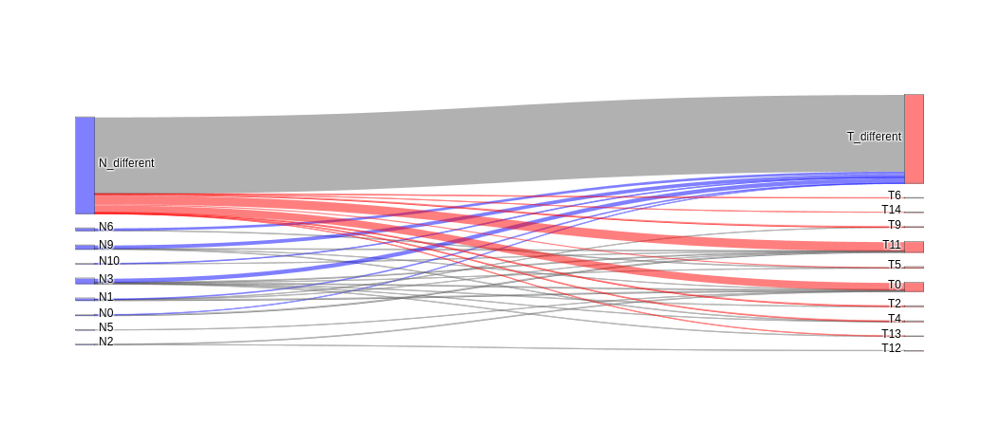

In [75]:
INVERT = True

if INVERT:
    source = source[::-1]
    target = target[::-1]
    value =  value[::-1]
    colors =  colors[::-1]

fig = go.Figure(
    go.Sankey(
        arrangement='snap',
        node = dict(
            pad = 15,
            thickness = 20,
            #line = dict(color = "black", width = 0.5),
            label = labels,
            color = color,
            align="right",
        ),
        link = dict(
            source = source,
            target = target,
            value =  value,
            color =  colors
        )
    )
)

#fig.update_layout(title_text="$log_{10}(1 + N_{pairs})$", font_size=10)
fig.show()

In [83]:
module_changes

,T_different,T11,T0,T5,T4,T9,T2,T6,T13,T14,T12
N_different,892,105,86,13,6,9,8,4,2,1,0
N3,48,6,6,1,1,0,2,0,2,0,0
N9,42,4,1,0,3,0,0,0,0,0,0
N6,30,0,0,3,0,0,0,0,0,0,0
N1,18,1,9,0,0,1,0,0,0,0,0
N0,1,9,0,0,0,0,0,0,0,0,0
N10,4,1,0,0,0,0,0,0,0,0,0
N2,0,0,4,0,0,0,0,0,0,0,1
N5,0,0,1,0,0,0,0,0,0,0,0


In [5]:
import gseapy as gp

path = "/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/adrenal_gland/tumor/adrenocortical_cancer/wgcna_adrenocortical_cancer.p"
WGCNA = PyWGCNA.readWGCNA(path)

Reading wgcna_adrenocortical_cancer WGCNA done!


array([[ 1.        ,  0.31763451, -0.05011658, ...,  0.27638295,
        -0.02713565,  0.22496695],
       [ 0.31763451,  1.        , -0.04478937, ...,  0.1609851 ,
         0.25892936,  0.24979123],
       [-0.05011658, -0.04478937,  1.        , ..., -0.49671712,
         0.06714678,  0.04175146],
       ...,
       [ 0.27638295,  0.1609851 , -0.49671712, ...,  1.        ,
         0.07826513,  0.04389444],
       [-0.02713565,  0.25892936,  0.06714678, ...,  0.07826513,
         1.        ,  0.33888036],
       [ 0.22496695,  0.24979123,  0.04175146, ...,  0.04389444,
         0.33888036,  1.        ]])

In [16]:
all_genes = WGCNA.datExpr.var.index.tolist()

In [17]:
WGCNA.datExpr.var['moduleLabels'].value_counts()

0     2416
8     1187
18    1124
9      940
10     926
19     906
17     876
6      840
7      747
12     611
1      550
15     429
14     252
4      233
5      232
13     213
16     162
11     160
3      138
2        3
Name: moduleLabels, dtype: int64

In [11]:
reactome = '/home/lnemati/resources/reactome/ReactomeLowestLevelPathways.gmt'

for module in WGCNA.datExpr.var["moduleLabels"].unique():    
    module_genes = WGCNA.datExpr.var[WGCNA.datExpr.var["moduleLabels"] == module].index.tolist()
    enr = gp.enrichr(
        gene_list=module_genes,                              
        #gene_sets="Reactome_2022",                          
        gene_sets=reactome,                                  
        background=all_genes,                                
        outdir=None,
        )
    enr = enr.results                                        
    # Only keep significant enrichments                      
    #enr = enr[enr["Adjusted P-value"] < 0.05]                
    ## Add module column and concatenate                      
    #enr["module"] = module                                   
    #enrichment = pd.concat([enrichment, enr])

ValueError: No objects to concatenate

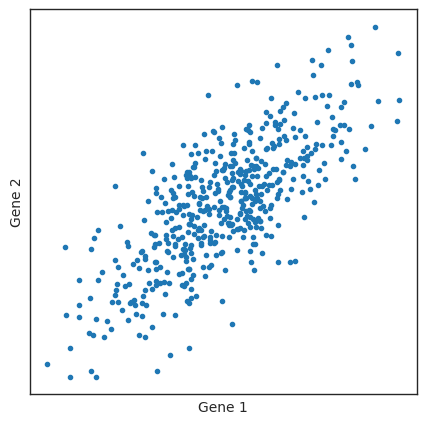

In [65]:
n = 500

plt.figure(figsize=(5,5))

xx = np.random.normal(0,1, n)
yy = xx + np.random.normal(0,1, n)

plt.scatter(xx, yy, marker='.')

plt.xticks([])
plt.yticks([])

plt.xlabel('Gene 1')
plt.ylabel('Gene 2')

plt.show()

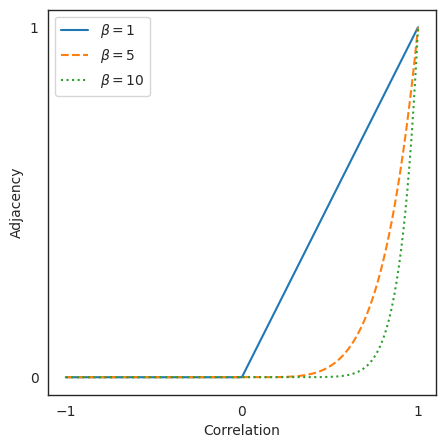

In [67]:
n = 500

xx = np.linspace(-1,1, n)

plt.figure(figsize=(5,5))

for beta, linestyle in zip([1,5,10], ['-', '--', ':']):
    yy = np.clip(xx, 0, 1)**beta
    plt.plot(xx, yy, linestyle=linestyle, label=f'$\\beta={beta}$')

plt.xticks([-1, 0, 1])
plt.yticks([0, 1])
plt.legend()

plt.xlabel('Correlation')
plt.ylabel('Adjacency')

plt.show()

In [103]:
adj = pd.read_csv('/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/pancreas/normal/pancreas/adjacency.csv.gz', index_col=0)
tom = pd.read_csv('/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/pancreas/normal/pancreas/tom.csv.gz', index_col=0)

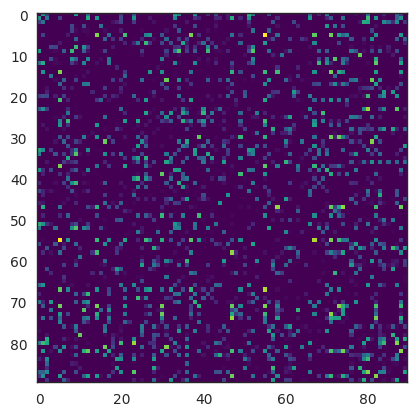

In [104]:
subset = 150
pseudocount = 1e-6
cmap = 'viridis'

plt.imshow(np.log(pseudocount + adj.iloc[::subset, ::subset]), cmap=cmap)

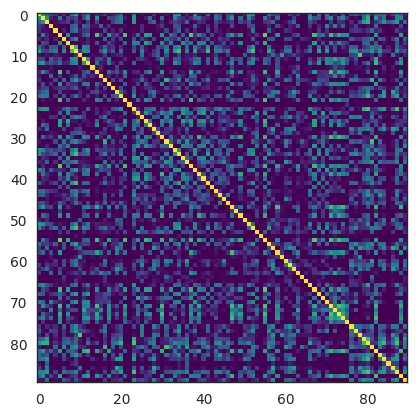

In [105]:
plt.imshow(np.log(pseudocount + tom.iloc[::subset, ::subset]), cmap=cmap)

In [164]:
import igraph as ig
from igraph import Graph

# Example weighted adjacency matrix
adj_matrix = np.array([
    [0, 2, 0, 6],
    [2, 0, 3, 8],
    [0, 3, 0, 7],
    [6, 8, 7, 0]
])

adj_matrix = 100 * adj_matrix

# Create the graph using the weighted adjacency matrix
g = Graph.Weighted_Adjacency(adj_matrix, mode="UNDIRECTED", attr="weight")

np.mean(g.closeness(weights='weight'))

0.0020109890109890113

In [170]:
g.es['distance'] = list(10000 - np.array(g.es['weight']))

In [171]:
g.es['distance']

[9800.0, 9400.0, 9700.0, 9200.0, 9300.0]

In [172]:
g.get_shortest_paths(0, to=1, weights='weight', output="vpath")
g.get_shortest_paths(0, to=2, weights='weight', output="vpath")
g.get_shortest_paths(0, to=3, weights='weight', output="vpath")

[[0, 3]]

In [175]:
g.modularity?

Signature: g.modularity(membership, weights=None, resolution=1, directed=True)
Docstring:
Calculates the modularity score of the graph with respect to a given
clustering.

The modularity of a graph w.r.t. some division measures how good the
division is, or how separated are the different vertex types from each
other. It's defined as M{Q=1/(2m)*sum(Aij-gamma*ki*kj/(2m)delta(ci,cj),i,j)}.
M{m} is the number of edges, M{Aij} is the element of the M{A}
adjacency matrix in row M{i} and column M{j}, M{ki} is the degree of
node M{i}, M{kj} is the degree of node M{j}, and M{Ci} and C{cj} are
the types of the two vertices (M{i} and M{j}), and M{gamma} is a resolution
parameter that defaults to 1 for the classical definition of modularity.
M{delta(x,y)} is one iff M{x=y}, 0 otherwise.

If edge weights are given, the definition of modularity is modified as
follows: M{Aij} becomes the weight of the corresponding edge, M{ki}
is the total weight of edges adjacent to vertex M{i}, M{kj} is the
total w

In [173]:
g.get_shortest_paths(0, to=1, weights='distance', output="vpath")

[[0, 1]]

In [6]:
interactions = pd.read_csv('/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/pancreas/normal/pancreas/interactions.csv', index_col='interaction')

In [8]:
interactions.loc['GCG_GLP1R']

num_interactors_a        1
num_interactors_b        1
interactor1            GCG
interactor2          GLP1R
interactor3            NaN
interactor4            NaN
interactor5            NaN
interactor6            NaN
interactor7            NaN
same_module          False
module                 NaN
mean_adj               0.0
Name: GCG_GLP1R, dtype: object

In [4]:
rank_adj = pd.read_csv('/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/brain/normal/brain_hypothalamus/ranked_adjacency.csv.gz', index_col=0)

In [5]:
WGCNA = PyWGCNA.readWGCNA('/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/brain/normal/brain_hypothalamus/wgcna_brain_hypothalamus.p')

Reading wgcna_brain_hypothalamus WGCNA done!


In [6]:
def rank_matrix(matrix):
    original_shape = matrix.shape

    # Only keep upper triangle, set diagonal and lower triangle to 0
    matrix = np.triu(matrix , 1)
    
    n_elements = matrix[matrix > 0].size
    print(f'n_elements: {n_elements}')
    
    # Flatten the matrix into a 1D array
    flat_matrix = matrix.flatten()

    # Get the ranks (argsort returns the indices that would sort the array)
    ranks = np.argsort(np.argsort(flat_matrix))

    print(f'max rank: {ranks.max()}')

    ranks = ranks.reshape(original_shape)
    print(ranks)

    # Use n_elements to normalize the ranks so that all elements outside the upper triangle are 0
    threshold = np.max(ranks) - n_elements
    print(f'threshold: {threshold}')
    
    ranks = np.where(ranks > threshold, ranks - threshold, 0)
    print(ranks)
    print()
    
    print(f'new max: {ranks.max()}')
    print(ranks)
    assert (ranks == np.triu(ranks , 1)).all()
    
    print(f'non 0: {np.sum(ranks > 0)}')
    assert (ranks == np.triu(ranks , 1)).all()
    
    # Reshape the ranks back to the original matrix shape
    ranks = ranks.reshape(original_shape)
    print(f'new max: {ranks.max()}')
    assert (ranks == np.triu(ranks , 1)).all()
    
    # Normalizing
    print('Normalizing')
    ranks = ranks / n_elements
    print(f'new max: {ranks.max()}')
    # Make symmetric
    
    print('Making symmetric')
    ranks = ranks + ranks.T
    print(f'new max: {ranks.max()}')

    return ranks

print("Getting adjacency matrix")

adj = WGCNA.adjacency
index = adj.index
ranked_adj = pd.DataFrame(rank_matrix(adj), index=index, columns=index)

#adj = np.array([[2,2,3],
#                [2,2,6],
#                [3,6,0]])
#ranked_adj = rank_matrix(adj)

Getting adjacency matrix
n_elements: 51210594
max rank: 208022928
[[ 64453446 122577579 180934313 ... 122574932 122574933 168376263]
 [122574934 122574935 122574936 ... 122582270 199378377 164371333]
 [122582271 122582272 122582273 ... 164188785 160217009 189330627]
 ...
 [ 64473112  64473079  64473068 ...  64474810  64474811  64474812]
 [ 64474813  64474814  64474815 ...  64442762  64442763 198112338]
 [ 64442764  64442765  64442766 ...  64453443  64453444  64453445]]
threshold: 156812334
[[       0        0 24121979 ...        0        0 11563929]
 [       0        0        0 ...        0 42566043  7558999]
 [       0        0        0 ...  7376451  3404675 32518293]
 ...
 [       0        0        0 ...        0        0        0]
 [       0        0        0 ...        0        0 41300004]
 [       0        0        0 ...        0        0        0]]

new max: 51210594
[[       0        0 24121979 ...        0        0 11563929]
 [       0        0        0 ...        0 42566043  7

In [7]:
ranked_adj

,RAB4B,TIGAR,RNF44,RPL23A,ARL8B,CALB2,DACH1,FMO2,ZNF708,MYADML2,...,ELAVL1,RBAK,ARHGAP21,DDX47,POMZP3,EIF5B,KIF16B,TENM1,BATF3,PPP6R1
RAB4B,0.000000,0.000000,0.471035,0.829552,0.000000,0.502205,0.000000,0.000000,0.000000,0.658076,...,0.000000,0.000000,0.277347,0.000000,0.220226,0.650242,0.239104,0.000000,0.000000,0.225811
TIGAR,0.000000,0.000000,0.000000,0.409891,0.487699,0.000000,0.000000,0.000000,0.902559,0.000000,...,0.000000,0.206757,0.709577,0.920313,0.378431,0.288464,0.746068,0.000000,0.831196,0.147606
RNF44,0.471035,0.000000,0.000000,0.000000,0.000000,0.707541,0.010049,0.000000,0.000000,0.902467,...,0.000000,0.000000,0.000000,0.000000,0.013763,0.000000,0.000000,0.144042,0.066484,0.634992
RPL23A,0.829552,0.409891,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.633641,0.000000,...,0.000000,0.000000,0.791500,0.564652,0.501934,0.985257,0.648433,0.000000,0.566701,0.223355
ARL8B,0.000000,0.487699,0.000000,0.000000,0.000000,0.580071,0.355599,0.000000,0.000000,0.779724,...,0.433519,0.027565,0.000000,0.000000,0.180830,0.000000,0.000000,0.735428,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
EIF5B,0.650242,0.288464,0.000000,0.985257,0.000000,0.000000,0.000000,0.000000,0.741761,0.000000,...,0.000000,0.000000,0.885044,0.647453,0.494933,0.000000,0.552792,0.000000,0.522007,0.160461
KIF16B,0.239104,0.746068,0.000000,0.648433,0.000000,0.000000,0.000000,0.000000,0.948009,0.000000,...,0.000000,0.000000,0.997456,0.678229,0.047972,0.552792,0.000000,0.000000,0.316729,0.000000
TENM1,0.000000,0.000000,0.144042,0.000000,0.735428,0.895872,0.842523,0.734789,0.000000,0.899093,...,0.423934,0.307583,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
BATF3,0.000000,0.831196,0.066484,0.566701,0.000000,0.000000,0.000000,0.000000,0.887639,0.000000,...,0.591873,0.306259,0.628816,0.861988,0.459272,0.522007,0.316729,0.000000,0.000000,0.806474


n_elements: 1040403.0
max rank: 2082248
threshold: 1041845.0


AssertionError: 

In [28]:
ranks = [[0,2,3],
         [0,0,6],
         [0,0,0]]
(ranks == np.triu(ranks , 1)).all()

True

In [11]:
ranked_adj.max().max()

1.5075889733086203

In [12]:
ranked_adj

,RAB4B,TIGAR,RNF44,RPL23A,ARL8B,CALB2,DACH1,FMO2,ZNF708,MYADML2,...,ELAVL1,RBAK,ARHGAP21,DDX47,POMZP3,EIF5B,KIF16B,TENM1,BATF3,PPP6R1
RAB4B,0.000000,0.356862,0.918032,1.094358,0.356797,0.933223,0.357197,0.357362,0.357063,1.010236,...,0.178418,0.178418,0.644173,0.178418,0.616048,0.827783,0.625343,0.178418,0.178418,0.618798
TIGAR,0.356862,0.356837,0.356907,0.887721,0.926102,0.356751,0.357171,0.357336,1.130640,0.357014,...,0.178489,0.609415,0.856999,0.960763,0.693946,0.649647,0.874966,0.178489,0.916883,0.580290
RNF44,0.918032,0.356907,0.356978,0.356774,0.356842,1.034329,0.691312,0.357407,0.357108,1.130572,...,0.178285,0.178285,0.178285,0.178285,0.514387,0.178285,0.178285,0.578535,0.540346,0.820274
RPL23A,1.094358,0.887721,0.356774,0.356570,0.356639,0.356618,0.357038,0.357203,0.998228,0.356881,...,0.178353,0.178353,0.897337,0.785639,0.754758,0.992741,0.826892,0.178353,0.786648,0.617588
ARL8B,0.356797,0.926102,0.356842,0.356639,0.356706,0.971564,0.861457,0.357271,0.356972,1.070134,...,0.721071,0.521183,0.178333,0.178332,0.596649,0.178332,0.178332,0.869728,0.178332,0.178332
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
EIF5B,0.827783,0.649647,0.178285,0.992741,0.178332,0.178753,0.178918,0.178619,0.872846,0.178693,...,0.000000,0.000000,0.943397,0.826409,0.751310,0.000000,0.779799,0.000000,0.764641,0.586620
KIF16B,0.625343,0.874966,0.178285,0.826892,0.178332,0.178753,0.178918,0.178619,0.974400,0.178693,...,0.000000,0.000000,0.998748,0.841563,0.531232,0.779799,0.000000,0.000000,0.663564,0.000000
TENM1,0.178418,0.178489,0.578535,0.178353,0.869728,0.948729,0.922460,0.869413,0.178596,0.950314,...,0.716351,0.659061,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
BATF3,0.178418,0.916883,0.540346,0.786648,0.178332,0.178753,0.178918,0.178619,0.944675,0.178693,...,0.799043,0.658409,0.817233,0.932045,0.733751,0.764641,0.663564,0.000000,0.000000,0.904710


In [5]:
rank_adj.max().max()

1.5075889733086203

In [ ]:
rank_adj.loc

In [ ]:
TSH CRH GnRH GHRH

In [ ]:
TRH SCTH LH GH

In [ ]:
rank_adj.loc[]

In [21]:
nj = pd.read_csv('/home/lnemati/pathway_crosstalk/results/pairs_of_interactions/normal_jaccard.csv', index_col=0)
tj = pd.read_csv('/home/lnemati/pathway_crosstalk/results/pairs_of_interactions/tumor_jaccard.csv', index_col=0)

In [ ]:
GRP SCT GCG IAPP

In [13]:
nj.index[nj.index.str.contains('GLP')]

Index(['GCG_GLP1R', 'GCG_GLP2R'], dtype='object')

In [22]:
glp_ints = tj.loc['GCG_GLP1R']

In [25]:
glp_ints[glp_ints > 0.].sort_values()

CCL5_CCR5            0.041667
DPEP2_CYSLTR1        0.055556
PTPRC_CD22           0.062500
CLSTN2_NRXN3         0.066667
LRRC4B_PTPRS         0.066667
CLSTN3_NRXN3         0.071429
CCL5_CCR4            0.083333
NLGN1_NRXN3          0.083333
NRXN3_ADGRL1         0.100000
RELN_VLDLR           0.100000
GGT1_CYSLTR1         0.125000
CNTN1_NRCAM          0.125000
CXCL13_CXCR5         0.142857
CCL5_ACKR2           0.166667
DPEP1_CYSLTR1        0.200000
PVR_CD226            0.200000
CRTAM_CADM1          0.250000
NLGN1_NRXN1          0.250000
CLSTN2_NRXN1         0.250000
NRXN1_ADGRL1         0.250000
FGF9_FGFR3           0.250000
CLSTN3_NRXN1         0.250000
ADCYAP1_ADCYAP1R1    0.333333
WNT2B_SFRP5          0.333333
WNT4_SFRP5           0.333333
C1QL1_ADGRB3         0.333333
SST_SSTR1            0.500000
SST_SSTR2            0.500000
CCL5_GPR75           0.500000
FGL1_LAG3            1.000000
GCG_GLP1R            1.000000
SST_SSTR3            1.000000
TPH1_CASR            1.000000
GAD2_GRM8 

In [223]:
paths_list = [
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/rectum/tumor/rectum_adenocarcinoma/wgcna_rectum_adenocarcinoma.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/uterus/tumor/uterine_carcinosarcoma/wgcna_uterine_carcinosarcoma.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/thyroid_gland/tumor/thyroid_carcinoma/wgcna_thyroid_carcinoma.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/kidney/tumor/kidney_papillary_cell_carcinoma/wgcna_kidney_papillary_cell_carcinoma.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/kidney/tumor/kidney_chromophobe/wgcna_kidney_chromophobe.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/kidney/tumor/kidney_clear_cell_carcinoma/wgcna_kidney_clear_cell_carcinoma.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/brain/tumor/brain_lower_grade_glioma/wgcna_brain_lower_grade_glioma.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/brain/tumor/glioblastoma_multiforme/wgcna_glioblastoma_multiforme.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/adrenal_gland/tumor/adrenocortical_cancer/wgcna_adrenocortical_cancer.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/testis/tumor/testicular_germ_cell_tumor/wgcna_testicular_germ_cell_tumor.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/liver/tumor/liver_hepatocellular_carcinoma/wgcna_liver_hepatocellular_carcinoma.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/prostate/tumor/prostate_adenocarcinoma/wgcna_prostate_adenocarcinoma.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/thymus/tumor/thymoma/wgcna_thymoma.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/lung/tumor/lung_squamous_cell_carcinoma/wgcna_lung_squamous_cell_carcinoma.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/lung/tumor/lung_adenocarcinoma/wgcna_lung_adenocarcinoma.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/bladder/tumor/bladder_urothelial_carcinoma/wgcna_bladder_urothelial_carcinoma.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/breast/tumor/breast_invasive_carcinoma/wgcna_breast_invasive_carcinoma.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/cervix/tumor/cervical_and_endocervical_cancer/wgcna_cervical_and_endocervical_cancer.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/ovary/tumor/ovarian_serous_cystadenocarcinoma/wgcna_ovarian_serous_cystadenocarcinoma.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/endometrium/tumor/uterine_corpus_endometrioid_carcinoma/wgcna_uterine_corpus_endometrioid_carcinoma.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/lining_of_body_cavities/tumor/mesothelioma/wgcna_mesothelioma.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/skin/tumor/skin_cutaneous_melanoma/wgcna_skin_cutaneous_melanoma.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/pancreas/tumor/pancreatic_adenocarcinoma/wgcna_pancreatic_adenocarcinoma.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/eye/tumor/uveal_melanoma/wgcna_uveal_melanoma.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/bile_duct/tumor/cholangiocarcinoma/wgcna_cholangiocarcinoma.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/soft_tissue_bone/tumor/sarcoma/wgcna_sarcoma.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/colon/tumor/colon_adenocarcinoma/wgcna_colon_adenocarcinoma.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/head_and_neck_region/tumor/head_and_neck_squamous_cell_carcinoma/wgcna_head_and_neck_squamous_cell_carcinoma.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/lymphatic_tissue/tumor/diffuse_large_bcell_lymphoma/wgcna_diffuse_large_bcell_lymphoma.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/paraganglia/tumor/pheochromocytoma_and_paraganglioma/wgcna_pheochromocytoma_and_paraganglioma.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/esophagus/tumor/esophageal_carcinoma/wgcna_esophageal_carcinoma.p',
    '/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/stomach/tumor/stomach_adenocarcinoma/wgcna_stomach_adenocarcinoma.p',
]

In [5]:
Z = pd.read_csv('/home/lnemati/pathway_crosstalk/results/consensus_modules/tumor/linkage_matrix.csv').values
all_clusterings = pd.read_csv('/home/lnemati/pathway_crosstalk/results/consensus_modules/tumor/median/all_clusterings.csv', index_col=0)
#mm = pd.read_csv('/home/lnemati/pathway_crosstalk/results/consensus_modules/tumor/module_membership.csv', index_col=0)
#corr = pd.read_csv('/home/lnemati/pathway_crosstalk/results/consensus_modules/tumor/correlation_matrix.csv', index_col=0)

FileNotFoundError: [Errno 2] No such file or directory: '/home/lnemati/pathway_crosstalk/results/consensus_modules/tumor/linkage_matrix.csv'

In [12]:
from scipy.cluster.hierarchy import fcluster
import igraph as ig
from scipy.sparse import csr_matrix

In [13]:
wgcna = PyWGCNA.readWGCNA('/projects/bioinformatics/DB/Xena/TCGA_GTEX/by_tissue_primary_vs_normal/pancreas/tumor/pancreatic_adenocarcinoma/wgcna_pancreatic_adenocarcinoma.p')
adj = wgcna.adjacency

Reading wgcna_pancreatic_adenocarcinoma WGCNA done!


In [14]:
adj = (adj + adj.T) / 2
adj = adj.iloc[::2, ::2]
g = ig.Graph.Weighted_Adjacency(adj, mode=ig.ADJ_UNDIRECTED)

0.19323022161004785


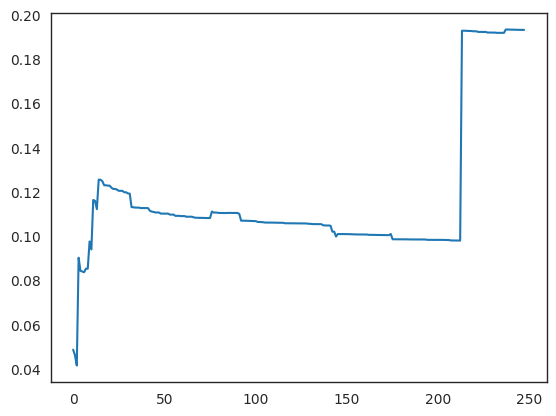

In [15]:
results = []

for column in all_clusterings.columns:
    clustering = all_clusterings.loc[adj.index, column].values          
    modularity = g.modularity(clustering, weights=g.es['weight'])
    results.append(modularity)
    
results = np.array(results)

print(results.max())
plt.plot(results)

In [141]:
import os
import pandas as pd

#quantile = 'perc25'
quantile = 'median'

# Define the root directory where you want to search
root_dir = f'/home/lnemati/pathway_crosstalk/results/consensus_modules/tumor/{quantile}/tissues'
all_clusterings = pd.read_csv(f'/home/lnemati/pathway_crosstalk/results/consensus_modules/tumor/{quantile}/all_clusterings.csv', index_col=0)

# Initialize an empty dataframe for merging
merged_df = None

# Walk through all subdirectories
for subdir, _, files in os.walk(root_dir):
    for file in files:
        if file == 'modularity.csv':
            file_path = os.path.join(subdir, file)
            name = file_path.split('/')[-2]
            # Read the CSV file
            df = pd.read_csv(file_path, index_col=0)  # Assuming the index is in the first column
            df.columns = [f"{col}_{name}" for col in df.columns]
            # Merge the dataframe with the existing one on index (horizontally)
            if merged_df is None:
                merged_df = df  # Initialize merged_df with the first dataframe
            else:
                merged_df = merged_df.join(df, how='inner')  # Join on index (outer join to keep all indices)

# Save the merged dataframe to a new CSV file
# merged_df.to_csv('merged_modularity.csv', index=False)

print("All files have been successfully merged horizontally!")


All files have been successfully merged horizontally!


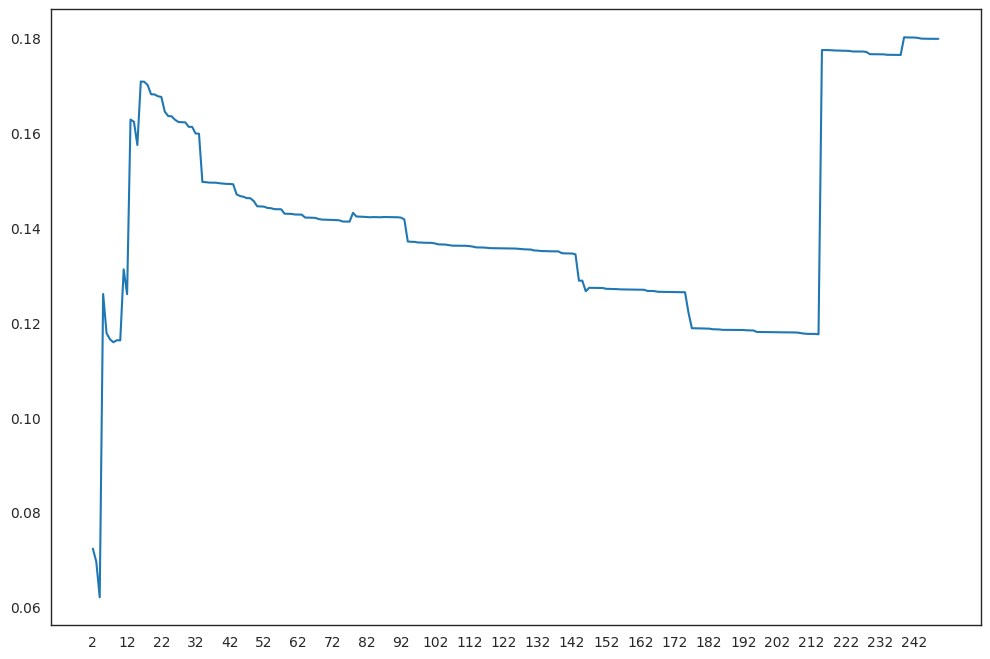

In [142]:
n_clust = list(merged_df.mean(axis=1).index.str.split('_',expand=True).get_level_values(0))
means = merged_df.mean(axis=1).values

plt.figure(figsize=(12,8))
plt.plot(n_clust, means)
plt.xticks(np.arange(0, len(n_clust), 10))
plt.show()

In [143]:
all_clusterings['16_clusters'].value_counts()

6     15682
2       238
5       195
7       192
4        89
1        86
13       56
10       47
12       27
15       15
3        12
16        5
14        5
11        4
8         2
9         1
Name: 16_clusters, dtype: int64

In [157]:
all_clusterings.loc['CSF1R', '16_clusters']

13

In [ ]:
all_clusterings

In [162]:
all_clusterings[all_clusterings['16_clusters'] == 12].index[:100]

Index(['C1QA', 'CD84', 'CYBB', 'EVI2A', 'AIF1', 'TNFAIP8L2', 'GPR65', 'MS4A6A',
       'C1QC', 'DOK2', 'SCIMP', 'SELPLG', 'MPEG1', 'PARVG', 'C1QB', 'SAMSN1',
       'FERMT3', 'FCER1G', 'ITGB2', 'SLA', 'TYROBP', 'C3AR1', 'HCK', 'HAVCR2',
       'PIK3R5', 'CD86', 'SLAMF8'],
      dtype='object', name='gene')

In [63]:
all_clusterings = pd.read_csv('/home/lnemati/pathway_crosstalk/results/consensus_modules/tumor/median/all_clusterings.csv', index_col=0)

In [65]:
all_clusterings['50_clusters'].value_counts()[:50]

13    15682
14      184
3       183
10      114
11       80
9        79
2        64
4        31
22       25
1        22
6        20
37       20
35       19
7        12
8        10
19        8
30        8
15        8
36        7
27        7
29        6
34        6
21        6
20        5
41        4
42        4
39        4
5         4
45        4
28        4
33        3
16        2
24        2
18        2
47        2
50        1
12        1
25        1
43        1
40        1
46        1
38        1
44        1
17        1
49        1
26        1
32        1
48        1
23        1
31        1
Name: 50_clusters, dtype: int64

In [ ]:
WGCNA.cutreeHybrid(dendro=self.geneTree, distM=dissTOM, minClusterSize=self.minModuleSize, **kwargs)

In [19]:
ZZZ

In [99]:
condition = 'normal'
quantile = 'median'

Z    = pd.read_csv(f'/home/lnemati/pathway_crosstalk/results/consensus_modules/{condition}/{quantile}/linkage.csv').values
dist = pd.read_csv(f'/home/lnemati/pathway_crosstalk/results/consensus_modules/{condition}/{quantile}/disimilarity.csv', index_col=0)
np.fill_diagonal(dist.values, 0)

In [50]:
from scipy.spatial.distance import pdist, squareform

In [89]:
distances = squareform(dist.values[::5, ::5])
link = linkage(distances, "average")

In [90]:
clusters = cutreeHybrid(link, distances)
clusters["labels"]

..cutHeight not given, setting it to 0.9994738051534142  ===>  99% of the (truncated) height range in dendro.
..done.


array([ 2,  0,  1, ...,  4, 10,  1])

In [93]:
pd.Series(clusters["labels"]).value_counts()

0     1879
1      417
2      405
3      185
4      105
5       86
6       70
7       65
8       50
9       44
10      26
dtype: int64

In [62]:
from dynamicTreeCut import cutreeHybrid

ImportError: cannot import name 'dist_index' from 'dynamicTreeCut' (/home/lnemati/.conda/envs/WGCNA/lib/python3.9/site-packages/dynamicTreeCut/__init__.py)

In [67]:
from dynamicTreeCut import cutreeHybrid
from scipy.spatial.distance import pdist
import numpy as np
from scipy.cluster.hierarchy import linkage
d = np.transpose(np.arange(1,10001).reshape(100,100))
distances = pdist(d, "euclidean")
link = linkage(distances, "average")
clusters = cutreeHybrid(link, distances)
clusters["labels"]

..cutHeight not given, setting it to 495.1  ===>  99% of the (truncated) height range in dendro.
..done.


array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [71]:
flat.shape

(138702840,)

In [74]:
Z

array([[5.00000000e+00, 9.00000000e+00, 0.00000000e+00, 2.00000000e+00],
       [1.60000000e+01, 1.78100000e+04, 0.00000000e+00, 3.00000000e+00],
       [2.10000000e+01, 1.78110000e+04, 0.00000000e+00, 4.00000000e+00],
       ...,
       [2.53100000e+03, 3.56150000e+04, 7.03296671e-01, 1.77190000e+04],
       [3.56090000e+04, 3.56120000e+04, 7.36492028e-01, 9.10000000e+01],
       [3.56160000e+04, 3.56170000e+04, 1.30790148e+00, 1.78100000e+04]])

In [73]:
Z.shape

(17809, 4)

In [72]:
link.shape

(99, 4)

In [70]:
distances.shape

(4950,)

In [6]:
condition = 'tumor'
quantile = 'perc25'



In [30]:
for c in ['normal', 'tumor']:
    for q in ['perc25', 'median']:
        modules = pd.read_csv(f'/home/lnemati/pathway_crosstalk/results/consensus_modules/{c}/{q}/consensus_modules.csv', index_col=0)
        print(f'{c}, {q}:')
        print('\tTotal number of modules:', modules['module'].nunique())
        print('\tGenes in biggest module:', modules['module'].value_counts().iloc[0])
        print('\tGenes in smallest module:', modules['module'].value_counts().iloc[-1])
        print('\tAverage genes in modules: {:.1f}'.format(modules['module'].value_counts().mean()))
        print('\tStd genes in modules: {:.1f}'.format(modules['module'].value_counts().std()))

normal, perc25:
	Total number of modules: 32
	Genes in biggest module: 14991
	Genes in smallest module: 20
	Average genes in modules: 556.6
	Std genes in modules: 2634.4
normal, median:
	Total number of modules: 55
	Genes in biggest module: 11368
	Genes in smallest module: 21
	Average genes in modules: 323.8
	Std genes in modules: 1518.6
tumor, perc25:
	Total number of modules: 41
	Genes in biggest module: 12917
	Genes in smallest module: 21
	Average genes in modules: 406.2
	Std genes in modules: 2004.7
tumor, median:
	Total number of modules: 53
	Genes in biggest module: 9680
	Genes in smallest module: 25
	Average genes in modules: 314.3
	Std genes in modules: 1322.7


In [20]:
modules.value_counts()

module
0         9680
1          893
2          827
3          481
4          468
5          285
6          263
7          260
8          245
9          174
10         155
11         143
12         139
13         112
14         111
15         110
16         105
17         102
18          98
19          97
20          95
21          95
22          94
23          91
24          90
25          89
26          88
27          86
28          78
29          77
30          69
31          68
32          59
33          56
34          54
35          53
36          52
37          49
38          49
39          49
40          45
41          44
42          42
43          41
44          41
45          40
46          36
47          35
48          34
49          32
50          27
51          25
52          25
dtype: int64

In [41]:
for gene in modules[modules['module'] == 3].index:
    print(gene)

GINS1
PAQR4
CCNB1
E2F1
SPAG5
CDH24
RCC2
SKA3
NUSAP1
ZCRB1
ESPL1
PWP1
TRAIP
SF1
EME1
KIF20A
WDR62
MTFR2
STIL
RECQL4
ORC1
E2F7
KHDRBS1
CDC45
RLIG1
ATAD5
KIFC1
RCC1
HMGB3
TTK
CCDC18
CEP55
CCDC150
C21orf58
SCFD2
CENPQ
FGD1
EZH2
GTSE1
HMMR
PHF19
PIF1
SASS6
USP1
CENPL
DENR
E2F2
MCM5
ANLN
TCOF1
CENPN
TPX2
KIF23
DNA2
DBF4
UCK2
MTHFD1
DEPDC1
KRR1
NDE1
CSE1L
FANCI
AURKB
ATAD2
PLK1
GINS4
STMN1
PSRC1
XPOT
CNOT2
FAM72A
CHEK1
DEK
GEN1
KIF24
PIMREG
MTBP
POC1A
HNRNPA2B1
POLR2D
SGO1
CENPK
CDCA3
GRK6
EXO1
LRP8
NAT10
CDC7
MRPL42
CKAP2
CCT2
HIRIP3
MCM10
H2AZ1
RAD51
CCDC138
FBXO5
SKA1
NT5DC2
HMGB2
CNOT9
CENPF
RPAP3
CCNB2
H2AZ2
TARDBP
KIF2C
CSTF3
FIRRM
TEDC2
NUP210
FANCA
ZWINT
CENPU
PTTG1
FAM216A
RFC4
MYBL1
CHTF18
UNG
TRIM59
DNMT1
FEN1
TYMS
TDP1
CENPO
SLC35E3
NEK2
NEIL3
CEP85
MRPL49
CCSAP
RBMX
CDC6
KIF11
USP15
MDM2
CDK2
NSD2
GPN3
ACAT2
CPSF6
SAPCD2
BORA
CENPA
ZGRF1
TBC1D15
UBE2C
HNRNPDL
LIN9
GINS3
SKA2
PIGW
TBC1D31
IWS1
CENPW
HNRNPD
PPP1CC
RMI2
NCAPG2
CEP72
VRK3
SMC4
CIT
PCNA
MTF2
DDIAS
SPC24
REXO5
E2F8
MND

In [38]:
modules.loc[['CSF1', 'CSF1R']]

,module
CSF1,2
CSF1R,2


In [3]:
import scanpy as sc

In [4]:
adata = sc.read_h5ad('/projects/bioinformatics/DB/Xena/TCGA_GTEX/TCGA_GTEX.h5ad')

In [5]:
adata

AnnData object with n_obs × n_vars = 18305 × 60498
    obs: 'detailed_category', 'primary_disease_or_tissue', 'X_primary_site', 'X_sample_type', 'X_gender', 'X_study'
    layers: 'TPM', 'raw_counts'

In [7]:
adata = adata[adata.obs.X_sample_type.isin(['Primary Tumor', 'Normal Tissue'])]

In [11]:
adata.obs

,detailed_category,primary_disease_or_tissue,X_primary_site,X_sample_type,X_gender,X_study
GTEX-1117F-0226-SM-5GZZ7,Adipose - Subcutaneous,Adipose - Subcutaneous,Adipose Tissue,Normal Tissue,Female,GTEX
GTEX-1117F-0426-SM-5EGHI,Muscle - Skeletal,Muscle - Skeletal,Muscle,Normal Tissue,Female,GTEX
GTEX-1117F-0526-SM-5EGHJ,Artery - Tibial,Artery - Tibial,Blood Vessel,Normal Tissue,Female,GTEX
GTEX-1117F-0626-SM-5N9CS,Artery - Coronary,Artery - Coronary,Blood Vessel,Normal Tissue,Female,GTEX
GTEX-1117F-0726-SM-5GIEN,Heart - Atrial Appendage,Heart - Atrial Appendage,Heart,Normal Tissue,Female,GTEX
...,...,...,...,...,...,...
TCGA-ZS-A9CG-01,Liver Hepatocellular Carcinoma,Liver Hepatocellular Carcinoma,Liver,Primary Tumor,Male,TCGA
TCGA-ZT-A8OM-01,Thymoma,Thymoma,Thymus,Primary Tumor,Female,TCGA
TCGA-ZU-A8S4-01,Cholangiocarcinoma,Cholangiocarcinoma,Bile duct,Primary Tumor,Male,TCGA
TCGA-ZU-A8S4-11,Cholangiocarcinoma,Cholangiocarcinoma,Bile duct,Solid Tissue Normal,Male,TCGA


In [9]:
sc.pp.pca(adata)

In [17]:
sc.pp.neighbors(adata)

In [18]:
sc.tl.umap(adata)

In [14]:
adata.obs

,detailed_category,primary_disease_or_tissue,X_primary_site,X_sample_type,X_gender,X_study
GTEX-1117F-0226-SM-5GZZ7,Adipose - Subcutaneous,Adipose - Subcutaneous,Adipose Tissue,Normal Tissue,Female,GTEX
GTEX-1117F-0426-SM-5EGHI,Muscle - Skeletal,Muscle - Skeletal,Muscle,Normal Tissue,Female,GTEX
GTEX-1117F-0526-SM-5EGHJ,Artery - Tibial,Artery - Tibial,Blood Vessel,Normal Tissue,Female,GTEX
GTEX-1117F-0626-SM-5N9CS,Artery - Coronary,Artery - Coronary,Blood Vessel,Normal Tissue,Female,GTEX
GTEX-1117F-0726-SM-5GIEN,Heart - Atrial Appendage,Heart - Atrial Appendage,Heart,Normal Tissue,Female,GTEX
...,...,...,...,...,...,...
TCGA-ZS-A9CG-01,Liver Hepatocellular Carcinoma,Liver Hepatocellular Carcinoma,Liver,Primary Tumor,Male,TCGA
TCGA-ZT-A8OM-01,Thymoma,Thymoma,Thymus,Primary Tumor,Female,TCGA
TCGA-ZU-A8S4-01,Cholangiocarcinoma,Cholangiocarcinoma,Bile duct,Primary Tumor,Male,TCGA
TCGA-ZU-A8S4-11,Cholangiocarcinoma,Cholangiocarcinoma,Bile duct,Solid Tissue Normal,Male,TCGA


/home/lnemati/.conda/envs/WGCNA/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


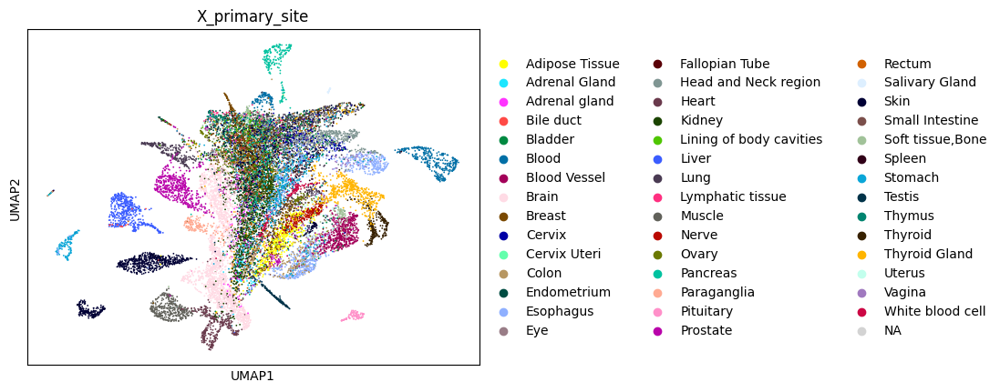

/home/lnemati/.conda/envs/WGCNA/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


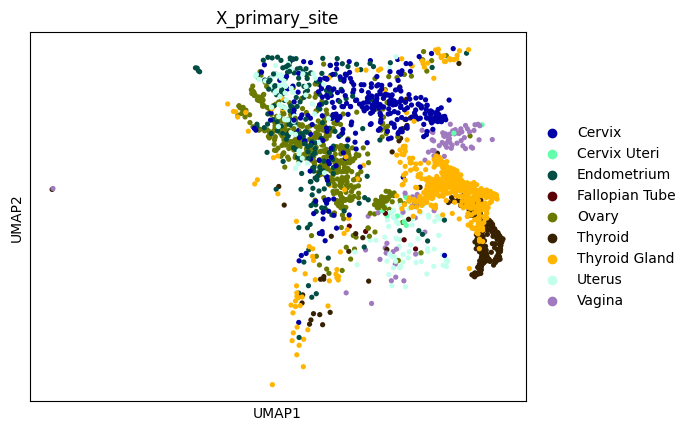

In [35]:
tissues = ['thyroid', 'thyroid gland', 'vagina', 'uterus', 'ovary', 'fallopian tube', 'endometrium', 'cervix', 'cervix uteri']
sc.pl.umap(adata, color=['X_primary_site'], ncols=1)
sc.pl.umap(adata[adata.obs.X_primary_site.str.lower().isin(tissues)], color=['X_primary_site'], ncols=1)

/home/lnemati/.conda/envs/WGCNA/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


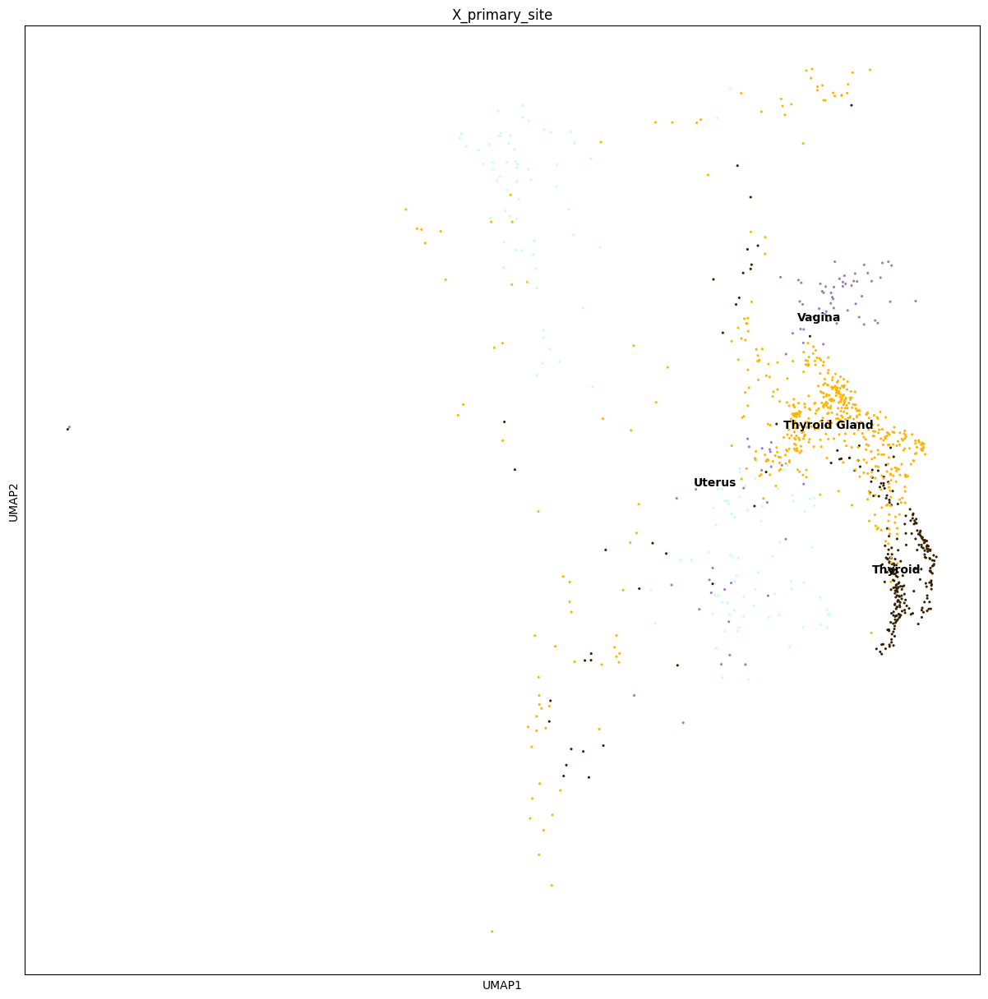

In [31]:
fig, ax = plt.subplots(1,1, figsize=(15,15))
sc.pl.umap(adata[adata.obs.X_primary_site.str.lower().isin(tissues)], color=['X_primary_site'], legend_loc='on data', size=20, ncols=1, ax=ax)

In [ ]:
sc.pl.pca(adata, color=)